In [1]:
import numpy as np
import scipy.io.wavfile as wavfile
from scipy.fftpack import dct
import librosa
import IPython.display as ipd
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display
import soundfile
import sklearn

import pandas as pd
import numpy as np
from numpy import argmax
import matplotlib.pyplot as plt
%matplotlib inline
import librosa
import librosa.display
import IPython.display
import random
import warnings
import os
from PIL import Image
import pathlib
import csv
# sklearn Preprocessing
from sklearn.model_selection import train_test_split
#Keras
import keras
import warnings
warnings.filterwarnings('ignore')
from keras import layers
from keras.layers import Activation, Dense, Dropout, Conv2D, Flatten, MaxPooling2D, GlobalMaxPooling2D, GlobalAveragePooling1D, AveragePooling2D, Input, Add
from keras.models import Sequential
from keras.optimizers import SGD

In [2]:
# audio_data = 'nsynth-valid/audio/bass_electronic_018-022-025.wav'
audio_data = 'data/nsynth-valid/audio/brass_acoustic_006-046-100.wav'
x, sr = librosa.load(audio_data, sr=16000)


In [3]:
print(type(x), type(sr))

<class 'numpy.ndarray'> <class 'int'>


In [4]:
print(x.shape, sr)

(64000,) 16000


In [5]:
#to play the audio in your notebook. audio widget
ipd.Audio(audio_data)

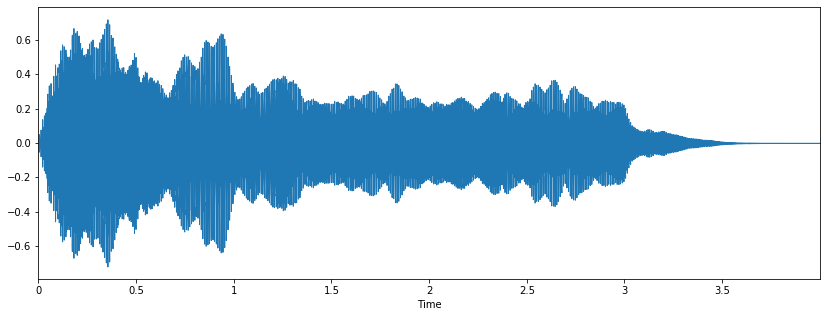

In [6]:
#plot the amplitude of the wave
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

In [7]:
#librosa.stft() converts data into short term fourier transform
#stft converts signals so that we can know the amplitude
#of the given frequency at a given time
#librosa.display.specshow displays a spectrogram

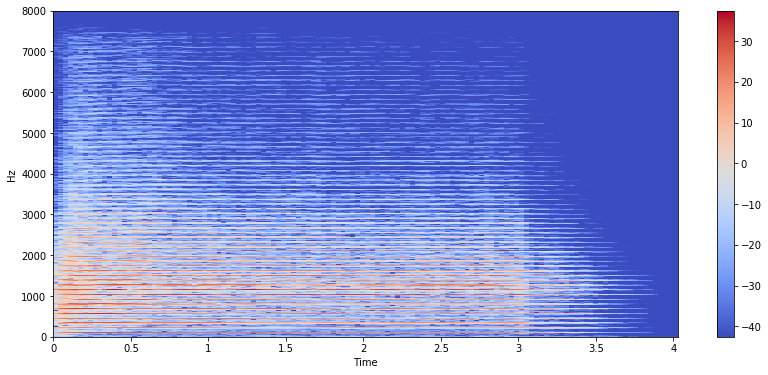

In [8]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 6))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar();

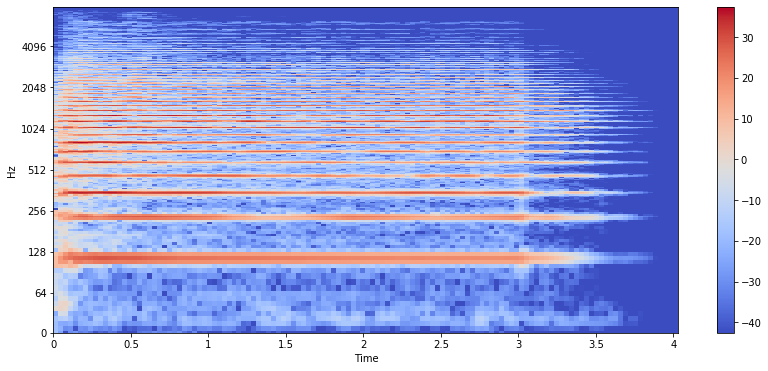

In [9]:
fig, ax = plt.subplots(figsize=(14,6))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

In [10]:
#create an audio signal
sr = 16000 # sample rate
T = 5.0    # seconds
t = np.linspace(0, T, int(T*sr), endpoint=False) # time variable
x = 0.5*np.sin(2*np.pi*220*t)# pure sine wave at 220 Hz
#Playing the audio
ipd.Audio(x, rate=sr) # load a NumPy array
#Saving the audio
soundfile.write('tone_example.wav', x, sr)

In [11]:
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
spectral_centroids.shape

(157,)

In [12]:
# Computing the time variable for visualization
plt.figure(figsize=(12, 4))
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

<Figure size 864x288 with 0 Axes>

In [13]:
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

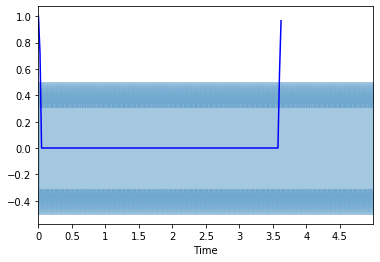

In [14]:
#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='b')


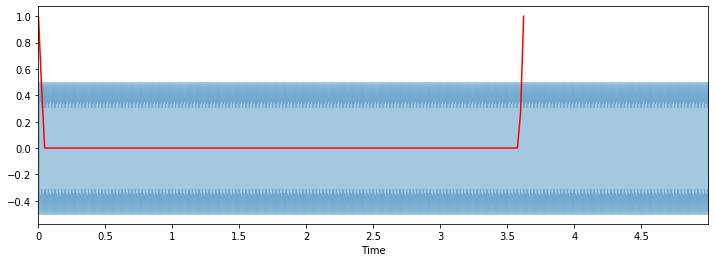

In [15]:
spectral_rolloff = librosa.feature.spectral_rolloff(x+0.01, sr=sr)[0]
plt.figure(figsize=(12, 4))
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')


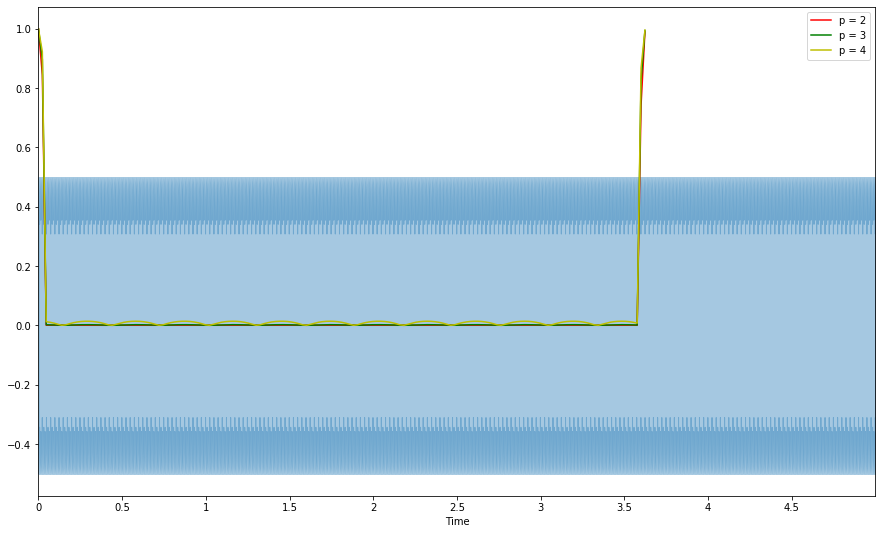

In [16]:
spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr)[0]
spectral_bandwidth_3 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr, p=3)[0]
spectral_bandwidth_4 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr, p=4)[0]
plt.figure(figsize=(15, 9))
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_bandwidth_2), color='r')
plt.plot(t, normalize(spectral_bandwidth_3), color='g')
plt.plot(t, normalize(spectral_bandwidth_4), color='y')
plt.legend(('p = 2', 'p = 3', 'p = 4'))

In [17]:
# audio_data = 'nsynth-valid/audio/bass_electronic_018-022-025.wav'
audio_data = 'data/nsynth-valid/audio/brass_acoustic_006-046-100.wav'
x, sr = librosa.load(audio_data, sr=16000)


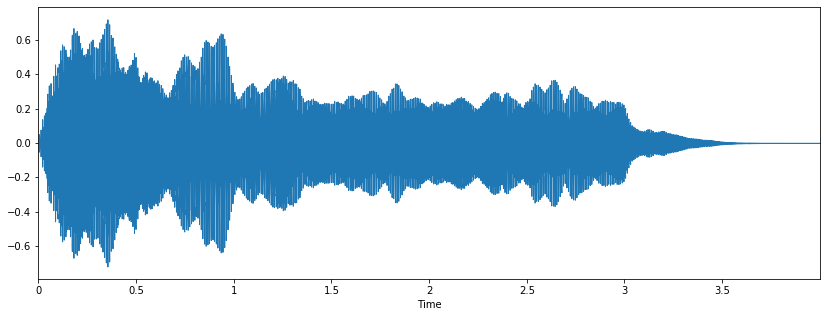

In [18]:
#Plot the signal:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

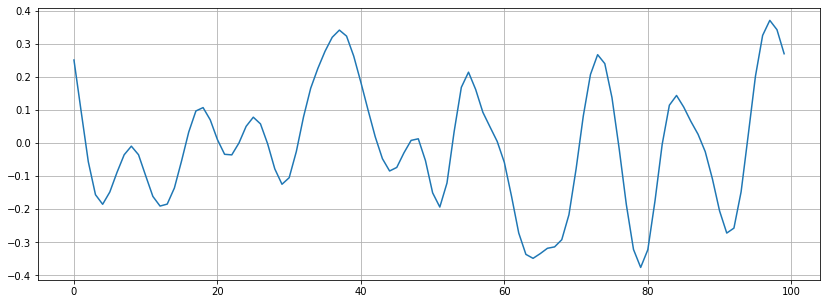

In [19]:
# Zooming in
n0 = 9000
n1 = 9100
plt.figure(figsize=(14, 5))
plt.plot(x[n0:n1])
plt.grid()

In [20]:
zero_crossings = librosa.zero_crossings(x[n0:n1], pad=False)
print(sum(zero_crossings))

16


In [21]:
mfccs = librosa.feature.mfcc(x, sr=sr)
print(mfccs.shape)

(20, 126)


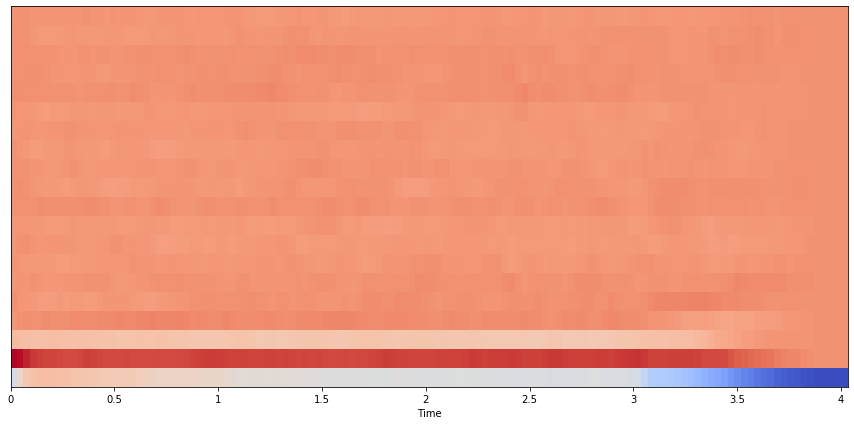

In [22]:
#Displaying  the MFCCs:
plt.figure(figsize=(15, 7))
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

# librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')

In [85]:
#set hop length: at 22050 Hz, 512 samples ~23 ms
hop_length = 512
# hop_length=512

The history saving thread hit an unexpected error (OperationalError('database or disk is full')).History will not be written to the database.


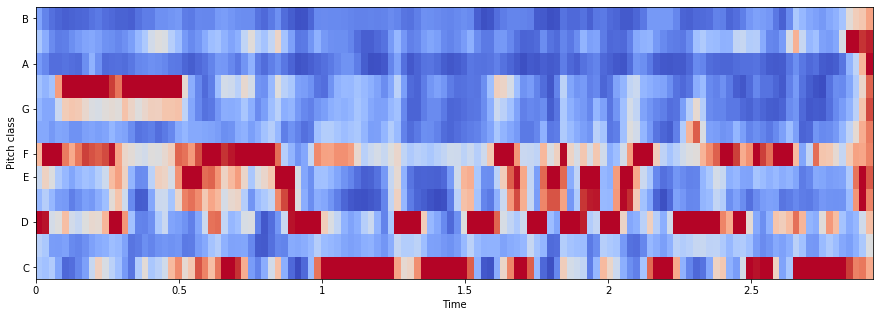

In [86]:
chromagram = librosa.feature.chroma_stft(x, sr=sr, hop_length=hop_length)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')


In [ ]:
#pitch of 046 should correspond to A#
#velocity of 100 ~ ff

In [71]:
list_notes = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
for i, j in zip(range(len(chromagram)), list_notes):

    avg_chroma = np.mean(chromagram[i, :])
    max_chroma_idx = np.argmax(chromagram[i, :])
    max_chroma = chromagram[i, max_chroma_idx]
    print(f'{j}: avg_chroma= {avg_chroma}, max_chroma= {max_chroma}')
#     np.argmax(chromagram[1, :])

C: avg_chroma= 0.5939398407936096, max_chroma= 1.0
C#: avg_chroma= 0.2660621702671051, max_chroma= 0.5089147686958313
D: avg_chroma= 0.5767139792442322, max_chroma= 1.0
D#: avg_chroma= 0.37622466683387756, max_chroma= 0.9954397082328796
E: avg_chroma= 0.4555787146091461, max_chroma= 1.0
F: avg_chroma= 0.6725060939788818, max_chroma= 1.0
F#: avg_chroma= 0.24702084064483643, max_chroma= 0.8241906762123108
G: avg_chroma= 0.2759156823158264, max_chroma= 0.918120265007019
G#: avg_chroma= 0.3489329516887665, max_chroma= 1.0
A: avg_chroma= 0.1314762383699417, max_chroma= 1.0
A#: avg_chroma= 0.26446911692619324, max_chroma= 1.0
B: avg_chroma= 0.15965045988559723, max_chroma= 0.7366587519645691


In [26]:
# brass_acoustic_006-046-100.wav
#<instrument_str>-<pitch>-<velocity>
#instruent_str: unique identifier of instrument: <instrumnet family>-<instrument production>-<instrument_name>
#pitch: 0-based MIDI pitch in the range [0, 127]
#velocity: 0-based MIDI velocity in range [0, 127]


In [27]:
audio_data = 'nsynth-valid/audio/bass_electronic_018-022-025.wav'
# audio_data = 'nsynth-valid/audio/brass_acoustic_006-046-100.wav'
x, sr = librosa.load(audio_data, sr=16000)


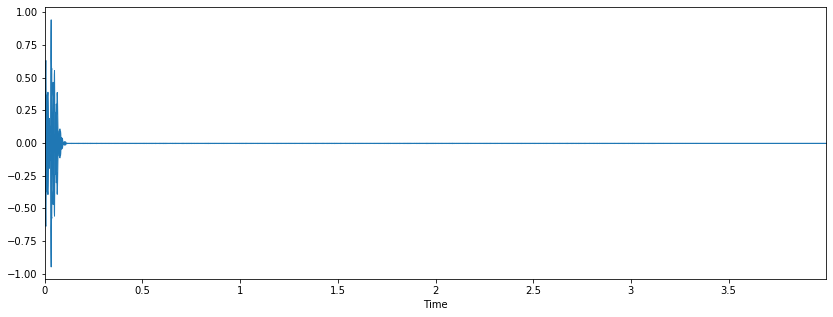

In [28]:
#Plot the signal:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

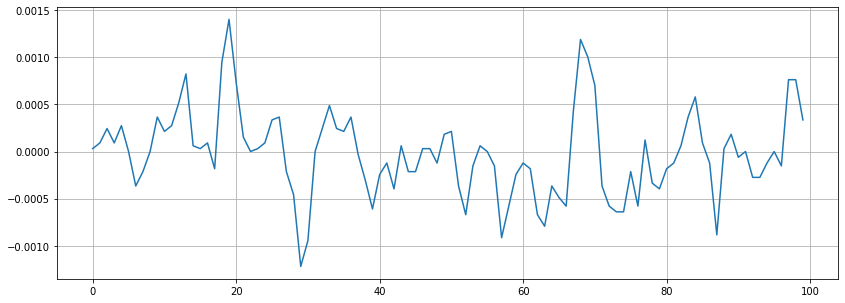

In [29]:
# Zooming in
n0 = 9000
n1 = 9100
plt.figure(figsize=(14, 5))
plt.plot(x[n0:n1])
plt.grid()

In [30]:
zero_crossings = librosa.zero_crossings(x[n0:n1], pad=False)
print(sum(zero_crossings))

28


In [31]:
mfccs = librosa.feature.mfcc(x, sr=sr)
print(mfccs.shape)

(20, 126)


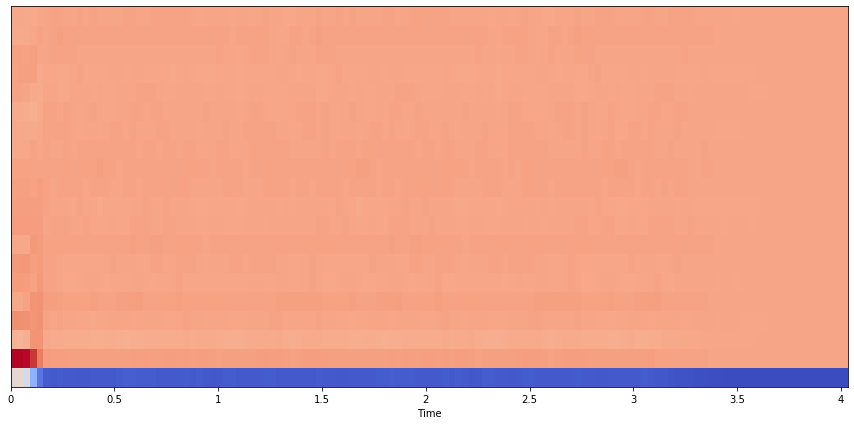

In [32]:
#Displaying  the MFCCs:
plt.figure(figsize=(15, 7))
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

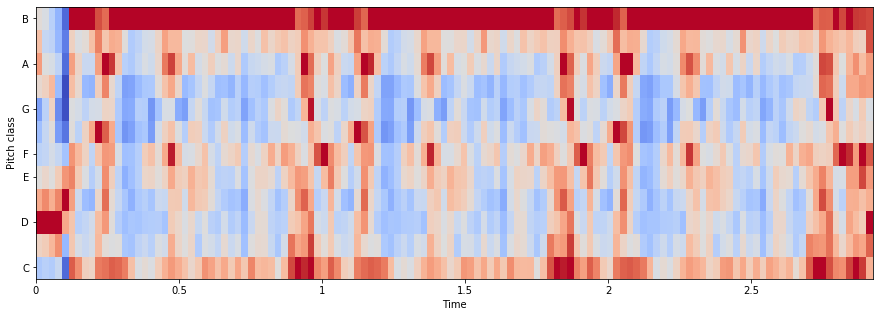

In [33]:
chromagram = librosa.feature.chroma_stft(x, sr=sr, hop_length=hop_length)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')


In [34]:
chromagram.shape

(12, 126)

In [35]:
chromagram

array([[0.41164228, 0.43987754, 0.4224021 , ..., 1.        , 0.94554645,
        0.7169537 ],
       [0.61106855, 0.6362677 , 0.703004  , ..., 0.7756976 , 0.7465952 ,
        0.8808514 ],
       [1.        , 1.        , 1.        , ..., 0.68901205, 0.63658184,
        1.        ],
       ...,
       [0.77096266, 0.54893965, 0.5266944 , ..., 0.7940801 , 0.6854875 ,
        0.7736744 ],
       [0.67484593, 0.4750671 , 0.45494148, ..., 0.6277798 , 0.61500794,
        0.91831195],
       [0.56614935, 0.53571546, 0.43769947, ..., 0.95057136, 0.9417329 ,
        0.92945373]], dtype=float32)

In [42]:
len(chromagram)

12

In [44]:
for i in range(len(chromagram)):
    avg_chroma = np.mean(chromagram[i, :])
    print(f'{i}: {avg_chroma}')
#     np.argmax(chromagram[1, :])

0: 0.7314456701278687
1: 0.5684134364128113
2: 0.5455790758132935
3: 0.5463818311691284
4: 0.5893478989601135
5: 0.6325679421424866
6: 0.5308047533035278
7: 0.4708942174911499
8: 0.5046979784965515
9: 0.6107978224754333
10: 0.6173312067985535
11: 0.9615182280540466


In [ ]:
#figure out how this chromagram works and whether it is really already classifying the pitch


In [ ]:
#convert audio data files into png format images, 
#extracting the spectrogram (MFCC) for every audio


#### get MFCC images

In [28]:

import scipy.io.wavfile as wavfile
from scipy.fftpack import dct
import librosa
import IPython.display as ipd
import librosa.display
import soundfile
import sklearn
import librosa.display
import IPython.display
import random
import warnings
import os
from PIL import Image
import pathlib
import csv

In [5]:
current_directory = pathlib.Path.cwd()
home_directory = pathlib.Path.home()

In [6]:
home_directory

PosixPath('/Users/katewessels')

In [10]:
#to list all files within directory
os.listdir('data/nsynth-train/audio')

['bass_synthetic_107-106-100.wav',
 'mallet_acoustic_035-114-127.wav',
 'keyboard_electronic_035-070-025.wav',
 'keyboard_electronic_058-056-100.wav',
 'bass_synthetic_119-092-127.wav',
 'mallet_acoustic_053-029-025.wav',
 'organ_electronic_070-047-075.wav',
 'guitar_electronic_032-049-050.wav',
 'keyboard_electronic_057-037-075.wav',
 'organ_electronic_026-036-050.wav',
 'bass_synthetic_001-016-127.wav',
 'keyboard_electronic_080-029-075.wav',
 'synth_lead_synthetic_009-086-075.wav',
 'guitar_electronic_019-058-050.wav',
 'mallet_acoustic_059-081-050.wav',
 'brass_acoustic_047-067-127.wav',
 'bass_synthetic_132-083-127.wav',
 'mallet_acoustic_000-091-100.wav',
 'guitar_electronic_040-048-100.wav',
 'keyboard_electronic_073-047-100.wav',
 'organ_electronic_054-037-100.wav',
 'organ_electronic_083-029-100.wav',
 'flute_acoustic_022-077-050.wav',
 'guitar_acoustic_016-106-075.wav',
 'keyboard_acoustic_015-085-075.wav',
 'bass_synthetic_101-074-075.wav',
 'vocal_acoustic_014-079-075.wav',

In [43]:

for filename in os.listdir('data/nsynth-train/audio'): 
    print(f"{filename[:-3].replace('.', '')}.png")

bass_synthetic_107-106-100.png
mallet_acoustic_035-114-127.png
keyboard_electronic_035-070-025.png
keyboard_electronic_058-056-100.png
bass_synthetic_119-092-127.png
mallet_acoustic_053-029-025.png
organ_electronic_070-047-075.png
guitar_electronic_032-049-050.png
keyboard_electronic_057-037-075.png
organ_electronic_026-036-050.png
bass_synthetic_001-016-127.png
keyboard_electronic_080-029-075.png
synth_lead_synthetic_009-086-075.png
guitar_electronic_019-058-050.png
mallet_acoustic_059-081-050.png
brass_acoustic_047-067-127.png
bass_synthetic_132-083-127.png
mallet_acoustic_000-091-100.png
guitar_electronic_040-048-100.png
keyboard_electronic_073-047-100.png
organ_electronic_054-037-100.png
organ_electronic_083-029-100.png
flute_acoustic_022-077-050.png
guitar_acoustic_016-106-075.png
keyboard_acoustic_015-085-075.png
bass_synthetic_101-074-075.png
vocal_acoustic_014-079-075.png
bass_synthetic_008-105-127.png
brass_acoustic_003-058-025.png
guitar_electronic_042-040-127.png
mallet_acou

string_acoustic_044-027-050.png
guitar_electronic_010-054-075.png
keyboard_synthetic_005-098-075.png
organ_electronic_106-041-100.png
mallet_acoustic_013-073-050.png
vocal_synthetic_001-061-075.png
guitar_electronic_034-024-100.png
mallet_acoustic_038-062-050.png
mallet_acoustic_061-072-100.png
bass_synthetic_089-075-127.png
guitar_acoustic_003-096-050.png
keyboard_electronic_105-041-075.png
flute_synthetic_001-063-127.png
keyboard_electronic_089-025-050.png
string_acoustic_039-047-075.png
organ_electronic_032-057-100.png
guitar_electronic_026-028-100.png
keyboard_electronic_015-027-100.png
flute_acoustic_021-091-127.png
reed_acoustic_021-041-127.png
mallet_acoustic_069-090-075.png
guitar_electronic_029-049-075.png
organ_electronic_040-056-050.png
bass_synthetic_067-076-127.png
guitar_electronic_002-058-075.png
keyboard_electronic_031-057-075.png
organ_electronic_097-048-050.png
mallet_acoustic_042-081-075.png
synth_lead_synthetic_012-086-050.png
keyboard_electronic_091-081-025.png
org

organ_electronic_103-063-127.png
bass_synthetic_124-043-050.png
reed_acoustic_007-090-075.png
guitar_synthetic_007-061-025.png
brass_acoustic_012-059-075.png
bass_synthetic_070-058-100.png
bass_synthetic_110-075-025.png
keyboard_electronic_022-103-100.png
mallet_acoustic_069-039-075.png
guitar_acoustic_011-033-050.png
bass_electronic_036-025-127.png
organ_electronic_027-071-100.png
mallet_acoustic_066-058-100.png
bass_synthetic_059-041-127.png
guitar_electronic_026-081-100.png
reed_acoustic_034-067-127.png
flute_synthetic_006-049-127.png
keyboard_electronic_024-071-075.png
bass_synthetic_072-050-127.png
organ_electronic_055-070-050.png
mallet_acoustic_014-059-050.png
keyboard_electronic_046-036-025.png
organ_electronic_061-046-025.png
mallet_acoustic_042-028-075.png
bass_synthetic_069-037-127.png
organ_electronic_018-066-075.png
brass_acoustic_004-057-127.png
bass_synthetic_102-101-025.png
guitar_electronic_003-078-100.png
keyboard_electronic_030-077-100.png
synth_lead_synthetic_009-04

organ_electronic_087-027-100.png
organ_electronic_009-029-050.png
organ_electronic_088-046-075.png
string_acoustic_062-034-075.png
mallet_acoustic_057-027-025.png
organ_electronic_074-049-075.png
guitar_electronic_036-047-050.png
keyboard_electronic_005-048-050.png
keyboard_electronic_053-039-075.png
organ_electronic_003-081-025.png
organ_electronic_022-038-050.png
vocal_synthetic_013-044-025.png
mallet_electronic_001-096-025.png
bass_synthetic_103-108-100.png
guitar_electronic_002-071-025.png
bass_synthetic_010-097-127.png
string_acoustic_000-073-025.png
brass_acoustic_014-060-127.png
mallet_acoustic_049-078-075.png
mallet_acoustic_053-096-100.png
guitar_acoustic_031-072-050.png
keyboard_electronic_020-040-100.png
flute_acoustic_005-103-075.png
reed_synthetic_001-049-050.png
flute_acoustic_001-079-127.png
guitar_acoustic_005-044-025.png
reed_acoustic_014-026-127.png
keyboard_electronic_079-050-050.png
organ_electronic_008-051-075.png
keyboard_synthetic_006-083-100.png
mallet_acoustic_

mallet_synthetic_001-070-050.png
string_acoustic_000-038-075.png
mallet_acoustic_014-092-050.png
vocal_synthetic_006-080-075.png
keyboard_synthetic_002-079-075.png
keyboard_electronic_067-044-050.png
organ_electronic_016-045-075.png
keyboard_synthetic_006-103-127.png
string_acoustic_081-057-050.png
keyboard_electronic_031-035-075.png
bass_synthetic_092-108-127.png
guitar_electronic_024-042-127.png
bass_synthetic_096-072-075.png
brass_acoustic_039-083-075.png
bass_synthetic_002-092-050.png
bass_synthetic_029-083-050.png
bass_synthetic_105-031-025.png
bass_synthetic_124-088-050.png
bass_synthetic_070-093-100.png
organ_electronic_067-034-127.png
keyboard_electronic_040-044-127.png
bass_synthetic_101-080-100.png
mallet_acoustic_033-092-127.png
keyboard_acoustic_015-071-100.png
bass_synthetic_082-085-050.png
guitar_acoustic_008-066-127.png
bass_synthetic_074-022-025.png
bass_electronic_004-061-050.png
guitar_acoustic_023-077-127.png
bass_electronic_030-057-025.png
reed_acoustic_050-052-075.

bass_synthetic_015-044-050.png
bass_synthetic_043-035-075.png
keyboard_electronic_090-101-050.png
keyboard_acoustic_019-031-050.png
bass_synthetic_021-072-025.png
reed_acoustic_021-072-100.png
keyboard_electronic_070-092-050.png
keyboard_electronic_086-035-025.png
mallet_acoustic_003-044-050.png
mallet_electronic_003-084-075.png
synth_lead_synthetic_005-032-050.png
mallet_synthetic_003-029-050.png
string_acoustic_060-026-025.png
mallet_acoustic_055-035-075.png
string_acoustic_002-061-075.png
mallet_acoustic_037-072-025.png
organ_electronic_095-073-050.png
guitar_electronic_000-063-075.png
keyboard_electronic_029-082-100.png
bass_synthetic_143-057-127.png
bass_synthetic_099-042-127.png
string_acoustic_029-070-075.png
bass_electronic_021-038-127.png
mallet_acoustic_028-055-050.png
mallet_synthetic_002-051-075.png
guitar_electronic_014-094-050.png
organ_electronic_081-084-075.png
organ_electronic_021-052-025.png
string_acoustic_055-068-075.png
keyboard_synthetic_001-058-050.png
keyboard_e

keyboard_electronic_088-039-025.png
organ_electronic_102-094-075.png
organ_electronic_015-071-100.png
bass_electronic_004-025-127.png
keyboard_electronic_074-036-025.png
keyboard_electronic_082-091-050.png
mallet_acoustic_026-059-050.png
guitar_acoustic_008-022-050.png
organ_electronic_053-046-025.png
synth_lead_synthetic_001-096-025.png
guitar_electronic_021-104-127.png
keyboard_electronic_101-094-100.png
bass_synthetic_040-050-127.png
organ_electronic_067-070-050.png
keyboard_electronic_016-071-075.png
bass_synthetic_030-059-050.png
organ_electronic_017-079-127.png
keyboard_synthetic_003-045-127.png
brass_acoustic_004-029-100.png
bass_synthetic_066-028-075.png
vocal_synthetic_012-033-127.png
bass_synthetic_109-064-025.png
keyboard_electronic_025-086-127.png
guitar_electronic_016-089-127.png
bass_synthetic_069-049-100.png
bass_synthetic_042-058-100.png
brass_acoustic_020-059-075.png
bass_synthetic_095-046-100.png
reed_acoustic_035-090-075.png
reed_acoustic_042-058-025.png
keyboard_ele

bass_synthetic_095-069-075.png
mallet_acoustic_067-080-127.png
brass_acoustic_020-076-100.png
organ_electronic_033-026-127.png
guitar_electronic_001-021-075.png
organ_electronic_062-096-025.png
bass_synthetic_036-104-050.png
organ_electronic_094-031-050.png
mallet_acoustic_036-030-025.png
mallet_acoustic_017-089-050.png
keyboard_synthetic_001-062-075.png
synth_lead_synthetic_004-070-050.png
bass_synthetic_071-080-127.png
mallet_acoustic_054-077-075.png
string_acoustic_061-064-025.png
organ_electronic_117-034-100.png
keyboard_electronic_087-077-025.png
keyboard_electronic_050-069-025.png
flute_synthetic_005-099-127.png
string_acoustic_027-053-100.png
bass_synthetic_044-105-100.png
mallet_acoustic_065-088-100.png
string_acoustic_028-032-075.png
organ_electronic_049-087-025.png
organ_electronic_014-026-050.png
keyboard_electronic_065-027-075.png
synth_lead_synthetic_010-087-075.png
mallet_acoustic_061-039-025.png
guitar_acoustic_022-064-100.png
organ_electronic_095-049-075.png
mallet_acou

guitar_electronic_002-095-025.png
bass_synthetic_119-102-075.png
keyboard_acoustic_009-089-127.png
bass_synthetic_010-073-127.png
organ_electronic_037-053-050.png
keyboard_electronic_046-052-075.png
mallet_acoustic_035-084-075.png
organ_electronic_111-049-050.png
bass_synthetic_136-069-127.png
guitar_electronic_029-084-025.png
vocal_acoustic_023-064-127.png
organ_electronic_045-052-100.png
guitar_acoustic_025-061-075.png
bass_synthetic_000-096-050.png
reed_acoustic_059-086-025.png
flute_acoustic_034-070-100.png
string_acoustic_024-044-127.png
organ_electronic_032-039-127.png
bass_synthetic_043-068-075.png
keyboard_electronic_015-049-127.png
guitar_electronic_026-046-127.png
bass_synthetic_094-076-075.png
brass_acoustic_021-069-100.png
bass_synthetic_072-097-100.png
organ_electronic_019-028-127.png
guitar_synthetic_010-021-025.png
bass_synthetic_107-035-025.png
brass_acoustic_023-061-127.png
mallet_acoustic_064-097-100.png
guitar_acoustic_006-073-050.png
keyboard_electronic_017-041-100.

keyboard_acoustic_008-023-075.png
bass_synthetic_020-026-100.png
bass_electronic_016-052-050.png
brass_acoustic_014-056-050.png
keyboard_electronic_079-066-127.png
bass_electronic_022-064-025.png
reed_acoustic_042-061-075.png
bass_synthetic_079-036-050.png
brass_acoustic_020-060-025.png
bass_synthetic_108-025-050.png
organ_electronic_070-105-050.png
string_acoustic_034-073-127.png
bass_synthetic_024-097-025.png
guitar_electronic_036-071-127.png
bass_synthetic_084-041-075.png
reed_acoustic_024-097-100.png
organ_electronic_037-081-127.png
mallet_acoustic_048-036-127.png
reed_acoustic_015-068-075.png
bass_synthetic_123-034-050.png
guitar_acoustic_022-072-025.png
bass_synthetic_089-028-127.png
keyboard_electronic_089-078-050.png
brass_acoustic_033-056-127.png
guitar_acoustic_016-044-050.png
guitar_electronic_034-079-100.png
keyboard_electronic_007-076-100.png
bass_electronic_031-052-127.png
mallet_acoustic_019-086-025.png
mallet_acoustic_032-097-025.png
keyboard_electronic_041-041-025.png


organ_electronic_067-075-075.png
keyboard_electronic_016-074-050.png
guitar_acoustic_007-046-100.png
vocal_synthetic_000-078-025.png
string_acoustic_027-079-050.png
bass_synthetic_016-024-127.png
keyboard_electronic_022-042-025.png
guitar_acoustic_008-027-075.png
mallet_acoustic_051-094-025.png
mallet_electronic_007-025-025.png
keyboard_electronic_082-094-075.png
organ_electronic_005-032-025.png
keyboard_electronic_064-075-100.png
brass_acoustic_050-055-127.png
organ_electronic_102-091-050.png
flute_synthetic_004-100-025.png
keyboard_electronic_104-058-025.png
string_acoustic_055-078-100.png
keyboard_electronic_009-053-025.png
mallet_synthetic_002-041-100.png
keyboard_electronic_012-034-025.png
organ_electronic_058-062-100.png
guitar_electronic_000-082-050.png
string_electronic_001-080-127.png
string_acoustic_002-080-050.png
vocal_synthetic_004-038-050.png
organ_electronic_035-044-025.png
mallet_electronic_003-065-050.png
keyboard_electronic_070-073-075.png
bass_synthetic_026-052-127.p

organ_electronic_067-024-050.png
guitar_synthetic_008-110-050.png
organ_electronic_031-055-075.png
keyboard_electronic_040-054-050.png
mallet_acoustic_033-082-050.png
guitar_acoustic_008-076-050.png
bass_synthetic_082-095-127.png
organ_electronic_053-012-025.png
keyboard_electronic_019-044-100.png
keyboard_electronic_074-062-025.png
string_acoustic_028-049-100.png
bass_synthetic_025-082-050.png
bass_synthetic_109-030-025.png
bass_synthetic_128-089-050.png
vocal_synthetic_012-067-127.png
guitar_electronic_003-052-127.png
string_acoustic_001-050-127.png
flute_acoustic_011-064-100.png
bass_synthetic_057-083-100.png
bass_synthetic_140-066-075.png
brass_acoustic_035-082-075.png
keyboard_acoustic_017-069-050.png
bass_synthetic_103-098-050.png
mallet_acoustic_053-106-050.png
synth_lead_synthetic_003-101-075.png
bass_electronic_008-060-050.png
mallet_synthetic_001-060-127.png
bass_synthetic_053-032-025.png
mallet_acoustic_014-082-127.png
bass_synthetic_126-090-100.png
bass_synthetic_031-075-07

bass_electronic_004-054-025.png
brass_acoustic_032-066-050.png
guitar_acoustic_017-074-127.png
bass_synthetic_006-016-100.png
bass_electronic_030-062-050.png
organ_electronic_062-103-025.png
vocal_synthetic_001-074-127.png
bass_synthetic_017-028-025.png
bass_synthetic_036-091-050.png
guitar_electronic_010-041-127.png
mallet_acoustic_050-098-127.png
flute_acoustic_018-099-075.png
mallet_electronic_006-029-127.png
organ_electronic_109-035-127.png
organ_electronic_122-024-127.png
string_acoustic_039-052-127.png
brass_acoustic_051-059-025.png
flute_acoustic_033-088-075.png
flute_synthetic_001-076-075.png
flute_acoustic_029-066-100.png
reed_acoustic_044-090-025.png
reed_acoustic_033-058-075.png
keyboard_electronic_105-054-127.png
bass_synthetic_089-060-075.png
bass_synthetic_044-090-100.png
bass_synthetic_131-032-025.png
mallet_electronic_004-021-100.png
bass_electronic_017-062-127.png
organ_electronic_006-036-100.png
mallet_acoustic_052-090-100.png
keyboard_electronic_021-046-100.png
guita

reed_acoustic_052-084-100.png
bass_synthetic_128-047-075.png
guitar_electronic_040-062-127.png
bass_synthetic_052-084-025.png
string_acoustic_042-060-127.png
mallet_electronic_004-101-050.png
bass_synthetic_123-097-025.png
guitar_electronic_038-100-075.png
brass_acoustic_056-073-025.png
reed_acoustic_030-108-127.png
bass_electronic_039-051-100.png
reed_acoustic_034-072-075.png
bass_synthetic_059-054-075.png
brass_acoustic_062-045-050.png
keyboard_acoustic_003-050-050.png
bass_electronic_036-030-075.png
bass_synthetic_056-035-100.png
brass_acoustic_034-034-075.png
brass_acoustic_049-054-050.png
brass_acoustic_010-044-100.png
bass_synthetic_072-045-075.png
keyboard_electronic_024-064-127.png
mallet_acoustic_024-100-025.png
bass_electronic_012-040-100.png
bass_synthetic_024-034-050.png
bass_synthetic_108-086-025.png
string_acoustic_015-069-127.png
synth_lead_synthetic_000-074-025.png
guitar_acoustic_028-079-025.png
string_acoustic_065-060-050.png
bass_synthetic_083-023-127.png
keyboard_el

mallet_acoustic_023-103-075.png
bass_synthetic_075-046-025.png
bass_synthetic_018-060-100.png
mallet_acoustic_027-079-127.png
organ_electronic_066-050-127.png
bass_synthetic_041-070-050.png
synth_lead_synthetic_001-105-100.png
bass_electronic_031-033-025.png
bass_synthetic_124-094-075.png
brass_acoustic_051-070-075.png
bass_synthetic_089-049-025.png
reed_acoustic_033-071-025.png
organ_electronic_088-053-127.png
brass_acoustic_000-082-050.png
reed_synthetic_000-024-127.png
bass_synthetic_141-050-025.png
bass_synthetic_136-098-075.png
keyboard_acoustic_013-096-100.png
keyboard_acoustic_009-078-075.png
mallet_acoustic_035-075-127.png
bass_synthetic_107-067-100.png
bass_synthetic_010-082-075.png
guitar_synthetic_010-073-100.png
bass_synthetic_084-062-050.png
string_acoustic_033-091-025.png
keyboard_synthetic_010-069-050.png
mallet_acoustic_006-082-075.png
vocal_synthetic_014-090-050.png
keyboard_electronic_075-054-075.png
organ_electronic_004-055-050.png
bass_synthetic_023-075-127.png
mall

keyboard_electronic_057-059-050.png
string_acoustic_030-025-075.png
keyboard_electronic_080-047-050.png
mallet_acoustic_005-036-025.png
bass_synthetic_005-102-050.png
guitar_electronic_032-027-075.png
organ_electronic_051-090-025.png
organ_electronic_070-029-050.png
synth_lead_synthetic_003-040-025.png
vocal_synthetic_007-062-100.png
organ_electronic_100-042-075.png
brass_electronic_000-076-127.png
keyboard_electronic_025-058-100.png
guitar_electronic_016-057-100.png
string_acoustic_079-073-025.png
bass_synthetic_077-103-100.png
organ_electronic_002-028-100.png
flute_acoustic_004-061-127.png
keyboard_electronic_038-035-075.png
string_acoustic_088-057-050.png
organ_electronic_049-034-050.png
reed_acoustic_003-032-127.png
mallet_electronic_012-033-100.png
string_acoustic_006-059-100.png
guitar_acoustic_026-066-050.png
mallet_acoustic_044-082-100.png
brass_acoustic_003-074-127.png
keyboard_electronic_037-054-100.png
bass_synthetic_087-094-127.png
brass_acoustic_028-065-127.png
keyboard_el

organ_electronic_097-058-127.png
keyboard_electronic_067-036-127.png
bass_synthetic_053-050-025.png
guitar_electronic_032-104-025.png
bass_synthetic_024-098-075.png
reed_acoustic_053-050-100.png
keyboard_acoustic_016-073-075.png
bass_synthetic_015-067-100.png
bass_synthetic_102-082-075.png
bass_synthetic_078-041-025.png
reed_acoustic_015-067-025.png
flute_acoustic_021-081-050.png
bass_electronic_017-025-025.png
reed_acoustic_021-051-050.png
bass_synthetic_131-075-127.png
mallet_acoustic_003-067-100.png
brass_acoustic_044-091-127.png
mallet_acoustic_019-089-075.png
reed_acoustic_051-058-127.png
vocal_acoustic_024-078-127.png
guitar_acoustic_026-107-127.png
organ_electronic_095-050-100.png
organ_electronic_109-072-025.png
keyboard_electronic_099-031-100.png
keyboard_synthetic_010-045-025.png
organ_electronic_004-079-025.png
keyboard_electronic_036-086-025.png
guitar_electronic_005-089-025.png
mallet_acoustic_045-050-025.png
keyboard_acoustic_010-101-100.png
keyboard_electronic_096-050-07

organ_electronic_047-070-100.png
mallet_acoustic_009-038-075.png
string_acoustic_044-082-100.png
guitar_acoustic_028-022-100.png
string_acoustic_089-072-075.png
flute_acoustic_027-104-025.png
reed_acoustic_054-066-127.png
bass_synthetic_039-040-127.png
mallet_acoustic_006-059-100.png
vocal_synthetic_009-026-050.png
mallet_acoustic_014-055-100.png
bass_synthetic_126-047-127.png
organ_electronic_101-067-050.png
keyboard_electronic_067-083-100.png
synth_lead_synthetic_012-023-100.png
string_acoustic_067-071-075.png
mallet_acoustic_052-062-025.png
keyboard_electronic_081-062-075.png
guitar_electronic_007-034-025.png
keyboard_electronic_015-082-050.png
string_acoustic_005-036-025.png
keyboard_synthetic_007-077-025.png
mallet_acoustic_030-025-075.png
bass_synthetic_044-062-025.png
bass_synthetic_029-044-100.png
reed_acoustic_044-062-100.png
flute_acoustic_029-094-025.png
bass_synthetic_070-054-050.png
bass_synthetic_026-025-075.png
reed_acoustic_036-063-050.png
keyboard_acoustic_001-041-075.

keyboard_electronic_088-052-025.png
string_acoustic_019-089-075.png
string_acoustic_003-067-100.png
mallet_acoustic_054-033-100.png
organ_electronic_000-095-100.png
vocal_synthetic_010-050-100.png
organ_electronic_117-070-075.png
mallet_electronic_002-082-100.png
bass_synthetic_140-059-075.png
reed_acoustic_020-074-075.png
bass_synthetic_116-028-050.png
brass_acoustic_042-075-025.png
bass_synthetic_137-091-025.png
brass_acoustic_020-032-075.png
bass_synthetic_042-033-100.png
keyboard_acoustic_017-056-050.png
bass_electronic_022-036-075.png
organ_electronic_124-087-127.png
vocal_synthetic_012-058-127.png
bass_electronic_009-027-075.png
bass_synthetic_069-022-100.png
bass_synthetic_030-032-050.png
organ_electronic_092-107-050.png
keyboard_acoustic_008-071-025.png
bass_electronic_006-046-100.png
bass_synthetic_066-043-075.png
mallet_acoustic_030-106-025.png
keyboard_electronic_030-062-127.png
brass_acoustic_004-042-100.png
flute_acoustic_000-065-025.png
bass_synthetic_117-050-075.png
bass

string_acoustic_049-061-075.png
mallet_acoustic_048-044-050.png
organ_electronic_087-063-100.png
keyboard_electronic_010-083-050.png
guitar_electronic_002-035-025.png
organ_electronic_061-082-075.png
string_acoustic_000-037-025.png
keyboard_synthetic_002-076-025.png
keyboard_acoustic_009-029-127.png
mallet_acoustic_057-063-025.png
keyboard_electronic_057-107-127.png
bass_synthetic_108-057-127.png
keyboard_electronic_084-063-075.png
organ_electronic_052-075-127.png
bass_synthetic_075-055-050.png
guitar_electronic_014-101-050.png
bass_synthetic_023-024-075.png
bass_synthetic_041-063-025.png
reed_acoustic_041-063-100.png
bass_synthetic_007-054-100.png
brass_acoustic_065-055-075.png
flute_acoustic_007-084-025.png
guitar_acoustic_016-036-127.png
bass_synthetic_008-035-075.png
reed_acoustic_033-062-050.png
organ_electronic_079-064-127.png
flute_acoustic_003-035-100.png
bass_electronic_014-028-100.png
organ_electronic_108-077-127.png
keyboard_electronic_070-107-050.png
guitar_electronic_043-1

synth_lead_synthetic_004-098-100.png
keyboard_electronic_071-038-100.png
guitar_acoustic_032-101-127.png
guitar_electronic_042-037-100.png
mallet_electronic_012-068-025.png
mallet_acoustic_065-060-050.png
guitar_acoustic_007-084-100.png
keyboard_electronic_055-048-075.png
bass_synthetic_003-069-127.png
organ_electronic_024-049-050.png
keyboard_electronic_082-056-075.png
vocal_synthetic_015-035-025.png
string_acoustic_064-045-075.png
mallet_acoustic_051-056-025.png
organ_electronic_072-038-075.png
keyboard_electronic_022-080-025.png
guitar_electronic_030-036-050.png
reed_acoustic_048-037-075.png
bass_electronic_028-032-025.png
keyboard_electronic_073-030-127.png
bass_synthetic_073-060-050.png
organ_electronic_054-040-127.png
synth_lead_synthetic_006-090-127.png
reed_acoustic_047-056-100.png
guitar_electronic_026-102-025.png
brass_acoustic_048-071-075.png
bass_synthetic_090-048-025.png
reed_acoustic_001-061-025.png
vocal_acoustic_019-067-100.png
guitar_synthetic_001-090-075.png
brass_aco

guitar_electronic_032-093-127.png
bass_synthetic_140-058-100.png
brass_acoustic_004-043-075.png
bass_synthetic_066-042-100.png
vocal_acoustic_013-062-025.png
guitar_electronic_019-082-127.png
bass_electronic_006-047-075.png
bass_synthetic_069-023-075.png
vocal_acoustic_027-054-050.png
reed_acoustic_052-074-050.png
bass_electronic_009-026-100.png
organ_electronic_018-072-127.png
organ_electronic_115-079-127.png
bass_synthetic_132-059-050.png
bass_synthetic_142-050-127.png
guitar_acoustic_007-029-050.png
guitar_acoustic_026-090-025.png
mallet_acoustic_029-052-050.png
mallet_electronic_002-083-075.png
keyboard_electronic_087-032-025.png
mallet_acoustic_002-043-050.png
vocal_synthetic_010-051-075.png
organ_electronic_117-071-100.png
keyboard_electronic_071-095-050.png
organ_electronic_000-094-075.png
mallet_acoustic_054-032-075.png
synth_lead_synthetic_004-035-050.png
mallet_acoustic_036-075-025.png
string_acoustic_019-088-100.png
string_acoustic_003-066-075.png
guitar_electronic_001-064-0

keyboard_electronic_041-094-075.png
organ_electronic_030-095-050.png
guitar_electronic_043-064-100.png
mallet_acoustic_019-053-075.png
string_acoustic_041-066-100.png
mallet_acoustic_016-032-100.png
string_acoustic_018-076-050.png
synth_lead_synthetic_010-044-100.png
keyboard_electronic_059-072-127.png
bass_synthetic_102-058-075.png
brass_acoustic_000-074-025.png
bass_synthetic_059-022-050.png
vocal_acoustic_017-055-075.png
bass_electronic_036-046-050.png
keyboard_acoustic_003-026-075.png
bass_synthetic_000-032-100.png
brass_acoustic_034-042-050.png
guitar_acoustic_011-050-127.png
organ_electronic_097-082-127.png
bass_synthetic_126-028-100.png
bass_synthetic_072-033-050.png
bass_synthetic_084-094-025.png
bass_synthetic_024-042-075.png
keyboard_electronic_072-063-127.png
bass_electronic_029-061-025.png
reed_acoustic_049-064-075.png
mallet_acoustic_006-036-127.png
synth_lead_synthetic_000-040-127.png
reed_acoustic_041-086-100.png
string_acoustic_051-062-127.png
bass_synthetic_096-098-025

bass_synthetic_120-079-025.png
guitar_electronic_021-100-100.png
organ_electronic_121-063-127.png
bass_synthetic_106-043-050.png
flute_synthetic_002-031-075.png
guitar_synthetic_011-057-050.png
bass_synthetic_132-075-025.png
keyboard_electronic_000-103-100.png
reed_acoustic_052-058-025.png
reed_acoustic_025-090-075.png
brass_acoustic_030-059-075.png
bass_synthetic_085-046-100.png
bass_synthetic_052-058-100.png
keyboard_electronic_035-086-127.png
bass_synthetic_079-049-100.png
mallet_acoustic_046-050-127.png
vocal_synthetic_002-033-127.png
bass_synthetic_119-064-025.png
bass_synthetic_076-028-075.png
keyboard_electronic_072-102-050.png
bass_synthetic_020-059-050.png
bass_synthetic_050-050-127.png
organ_electronic_077-070-050.png
keyboard_electronic_006-071-075.png
guitar_electronic_031-104-127.png
synth_lead_synthetic_011-096-025.png
organ_electronic_043-046-025.png
string_acoustic_082-025-025.png
string_acoustic_074-082-050.png
guitar_acoustic_018-022-050.png
organ_electronic_094-058-0

organ_electronic_078-060-025.png
keyboard_electronic_032-036-100.png
guitar_electronic_001-039-100.png
organ_electronic_089-044-050.png
mallet_acoustic_046-063-100.png
guitar_acoustic_024-087-050.png
keyboard_electronic_058-093-025.png
reed_synthetic_001-033-050.png
keyboard_synthetic_009-098-075.png
string_acoustic_011-037-100.png
mallet_acoustic_034-062-050.png
organ_electronic_096-063-025.png
guitar_electronic_038-024-100.png
keyboard_electronic_073-082-025.png
keyboard_electronic_085-025-050.png
keyboard_electronic_109-041-075.png
bass_synthetic_085-075-127.png
string_acoustic_063-036-050.png
guitar_electronic_037-045-075.png
synth_lead_synthetic_006-022-025.png
bass_synthetic_022-062-050.png
organ_electronic_005-042-127.png
organ_electronic_108-049-127.png
vocal_synthetic_015-087-127.png
mallet_electronic_007-055-127.png
reed_acoustic_019-035-075.png
keyboard_electronic_022-032-127.png
flute_acoustic_016-084-100.png
reed_acoustic_016-054-100.png
brass_acoustic_019-073-075.png
bass

guitar_acoustic_011-063-100.png
mallet_acoustic_073-087-050.png
keyboard_electronic_000-051-050.png
organ_electronic_071-050-075.png
guitar_electronic_015-064-025.png
string_acoustic_017-066-025.png
mallet_acoustic_022-075-075.png
bass_synthetic_007-082-127.png
guitar_electronic_021-052-050.png
mallet_acoustic_040-032-025.png
guitar_acoustic_019-081-075.png
keyboard_electronic_093-032-075.png
vocal_synthetic_004-051-025.png
bass_synthetic_040-106-050.png
string_acoustic_023-050-050.png
string_acoustic_008-041-050.png
synth_lead_synthetic_000-073-100.png
guitar_acoustic_032-090-075.png
mallet_acoustic_009-064-075.png
bass_synthetic_121-098-127.png
keyboard_electronic_100-071-025.png
string_acoustic_051-051-100.png
bass_synthetic_032-107-100.png
brass_acoustic_024-075-050.png
organ_electronic_008-108-025.png
guitar_acoustic_001-067-127.png
bass_electronic_012-047-025.png
keyboard_electronic_049-045-127.png
guitar_synthetic_001-101-127.png
bass_synthetic_108-081-100.png
brass_acoustic_010

flute_acoustic_008-085-050.png
guitar_synthetic_003-074-050.png
keyboard_acoustic_000-091-050.png
bass_synthetic_114-060-050.png
string_acoustic_028-036-127.png
bass_synthetic_097-065-100.png
bass_synthetic_120-056-025.png
guitar_acoustic_028-103-050.png
flute_acoustic_018-108-127.png
brass_acoustic_013-085-100.png
mallet_acoustic_054-073-127.png
bass_synthetic_071-084-075.png
keyboard_synthetic_001-066-127.png
organ_electronic_118-051-127.png
guitar_electronic_001-025-127.png
mallet_acoustic_067-084-075.png
string_acoustic_085-089-025.png
keyboard_electronic_014-052-075.png
organ_electronic_065-053-050.png
bass_synthetic_042-073-127.png
organ_electronic_051-065-025.png
keyboard_electronic_030-022-100.png
vocal_synthetic_007-097-100.png
organ_electronic_017-052-100.png
brass_electronic_000-083-127.png
bass_synthetic_069-062-127.png
organ_electronic_018-033-075.png
flute_acoustic_004-094-127.png
keyboard_electronic_046-063-025.png
mallet_acoustic_046-107-127.png
mallet_acoustic_058-093-

reed_acoustic_015-092-025.png
flute_acoustic_021-074-050.png
bass_synthetic_141-089-050.png
keyboard_electronic_070-044-100.png
mallet_acoustic_003-092-100.png
bass_synthetic_131-080-127.png
brass_acoustic_044-064-127.png
string_acoustic_041-049-100.png
string_acoustic_018-059-050.png
keyboard_electronic_029-054-050.png
organ_electronic_058-055-075.png
organ_electronic_073-044-075.png
guitar_acoustic_009-099-075.png
guitar_acoustic_013-077-100.png
vocal_synthetic_014-049-025.png
string_acoustic_033-048-050.png
keyboard_electronic_054-034-075.png
bass_synthetic_087-100-050.png
keyboard_electronic_036-073-025.png
bass_synthetic_104-105-100.png
bass_acoustic_000-036-025.png
mallet_acoustic_028-083-100.png
bass_synthetic_019-072-127.png
bass_synthetic_114-079-127.png
keyboard_acoustic_000-088-127.png
bass_synthetic_110-103-075.png
keyboard_electronic_040-032-100.png
mallet_electronic_008-073-025.png
guitar_acoustic_007-071-075.png
organ_electronic_067-042-100.png
mallet_synthetic_002-076-0

brass_acoustic_029-071-025.png
bass_synthetic_070-027-050.png
bass_synthetic_029-037-100.png
synth_lead_synthetic_010-058-127.png
reed_acoustic_006-066-050.png
reed_acoustic_032-050-025.png
brass_acoustic_050-051-075.png
bass_synthetic_032-050-100.png
bass_electronic_004-024-050.png
flute_acoustic_019-091-025.png
bass_synthetic_019-041-100.png
keyboard_electronic_082-090-127.png
mallet_acoustic_026-058-127.png
guitar_acoustic_008-023-127.png
vocal_acoustic_001-047-100.png
bass_synthetic_074-067-025.png
reed_acoustic_019-041-025.png
guitar_electronic_021-105-050.png
organ_electronic_067-071-127.png
bass_synthetic_040-051-050.png
vocal_synthetic_004-106-025.png
organ_electronic_017-078-050.png
bass_synthetic_030-058-127.png
keyboard_electronic_066-079-075.png
keyboard_synthetic_003-044-050.png
synth_lead_synthetic_009-037-100.png
vocal_synthetic_012-032-050.png
synth_lead_synthetic_006-056-075.png
keyboard_electronic_109-035-025.png
organ_electronic_099-076-100.png
guitar_electronic_016-

reed_acoustic_028-038-025.png
reed_acoustic_009-081-050.png
synth_lead_synthetic_011-057-127.png
reed_acoustic_003-029-025.png
brass_acoustic_037-059-050.png
bass_synthetic_003-029-100.png
bass_synthetic_101-043-075.png
flute_acoustic_016-076-025.png
flute_synthetic_005-031-050.png
guitar_acoustic_034-033-075.png
bass_synthetic_141-106-025.png
keyboard_electronic_073-070-100.png
keyboard_electronic_095-091-075.png
keyboard_electronic_058-061-100.png
organ_electronic_012-037-025.png
guitar_electronic_006-048-025.png
keyboard_electronic_035-047-025.png
mallet_acoustic_067-028-050.png
mallet_acoustic_046-091-025.png
bass_synthetic_001-021-127.png
organ_electronic_070-070-075.png
guitar_electronic_014-044-025.png
organ_electronic_021-082-050.png
keyboard_electronic_050-083-075.png
mallet_acoustic_023-055-075.png
string_acoustic_016-046-025.png
guitar_synthetic_009-032-127.png
guitar_electronic_020-072-050.png
organ_electronic_078-092-100.png
vocal_synthetic_005-071-025.png
mallet_acoustic_

keyboard_electronic_024-046-075.png
guitar_electronic_017-049-075.png
bass_synthetic_072-067-127.png
organ_electronic_055-047-050.png
synth_lead_synthetic_007-097-050.png
mallet_electronic_001-021-075.png
organ_electronic_003-036-075.png
guitar_electronic_041-038-050.png
keyboard_electronic_072-037-050.png
keyboard_electronic_084-090-025.png
mallet_acoustic_020-058-025.png
organ_electronic_061-071-025.png
guitar_electronic_018-028-100.png
vocal_synthetic_002-106-127.png
organ_electronic_027-046-100.png
keyboard_acoustic_007-108-050.png
keyboard_electronic_000-036-100.png
guitar_electronic_033-039-100.png
keyboard_electronic_059-026-050.png
reed_acoustic_034-050-127.png
flute_synthetic_002-104-075.png
reed_acoustic_044-059-050.png
organ_electronic_103-054-127.png
bass_synthetic_124-074-050.png
reed_acoustic_012-028-075.png
flute_acoustic_007-077-075.png
bass_synthetic_110-042-025.png
guitar_acoustic_033-106-050.png
guitar_synthetic_007-056-025.png
reed_acoustic_036-058-100.png
mallet_ac

organ_electronic_056-037-050.png
keyboard_electronic_027-036-075.png
keyboard_electronic_045-071-025.png
synth_lead_synthetic_011-068-050.png
keyboard_electronic_028-057-100.png
bass_synthetic_142-082-127.png
brass_acoustic_037-066-127.png
guitar_electronic_030-049-100.png
string_acoustic_088-073-025.png
bass_electronic_035-062-127.png
bass_synthetic_086-103-100.png
organ_electronic_024-036-100.png
guitar_acoustic_026-042-025.png
bass_synthetic_105-106-050.png
guitar_synthetic_012-112-050.png
mallet_acoustic_029-080-050.png
mallet_acoustic_008-039-025.png
mallet_synthetic_003-084-075.png
mallet_acoustic_055-098-050.png
organ_electronic_080-051-075.png
guitar_electronic_015-041-050.png
guitar_electronic_043-030-075.png
organ_electronic_020-087-025.png
string_acoustic_017-043-050.png
mallet_electronic_003-029-050.png
guitar_electronic_021-077-025.png
keyboard_electronic_012-078-025.png
mallet_acoustic_016-066-075.png
vocal_synthetic_004-074-050.png
string_acoustic_023-075-025.png
string_

bass_electronic_007-023-075.png
brass_acoustic_053-056-050.png
bass_synthetic_121-031-050.png
bass_synthetic_100-088-025.png
keyboard_acoustic_014-079-025.png
organ_electronic_000-101-100.png
bass_synthetic_089-025-100.png
mallet_acoustic_061-022-127.png
flute_synthetic_001-033-100.png
organ_electronic_035-084-127.png
bass_synthetic_086-044-075.png
guitar_electronic_034-074-127.png
bass_synthetic_026-092-025.png
string_acoustic_036-076-127.png
bass_synthetic_077-022-127.png
organ_electronic_006-073-075.png
keyboard_electronic_077-072-050.png
mallet_electronic_004-064-075.png
guitar_electronic_007-083-075.png
keyboard_electronic_043-044-025.png
string_acoustic_005-081-075.png
mallet_acoustic_030-092-025.png
bass_electronic_033-057-127.png
keyboard_electronic_068-055-025.png
bass_synthetic_137-105-025.png
keyboard_electronic_005-073-100.png
brass_acoustic_031-053-127.png
string_acoustic_059-058-025.png
bass_synthetic_151-038-127.png
guitar_acoustic_020-077-025.png
string_acoustic_011-076

keyboard_electronic_096-096-050.png
string_acoustic_070-085-050.png
organ_electronic_047-041-025.png
string_acoustic_029-095-100.png
mallet_acoustic_006-068-025.png
bass_synthetic_083-049-127.png
guitar_electronic_031-079-075.png
keyboard_electronic_018-098-100.png
organ_electronic_073-077-050.png
bass_synthetic_054-057-127.png
reed_acoustic_039-071-127.png
reed_acoustic_012-060-127.png
organ_electronic_058-066-050.png
keyboard_electronic_033-089-100.png
guitar_electronic_000-086-100.png
keyboard_electronic_029-067-075.png
string_acoustic_002-084-100.png
bass_electronic_010-022-127.png
mallet_electronic_003-061-100.png
bass_synthetic_081-041-100.png
mallet_acoustic_069-046-127.png
keyboard_electronic_004-104-100.png
bass_synthetic_136-072-025.png
vocal_acoustic_017-049-050.png
flute_synthetic_006-036-075.png
bass_synthetic_102-044-050.png
organ_electronic_125-064-127.png
mallet_electronic_001-069-127.png
reed_acoustic_049-078-050.png
bass_synthetic_010-068-025.png
vocal_synthetic_006-0

guitar_electronic_004-060-127.png
keyboard_electronic_039-087-127.png
bass_synthetic_075-048-100.png
guitar_synthetic_002-071-025.png
brass_acoustic_017-049-075.png
brass_acoustic_041-038-050.png
bass_synthetic_115-065-025.png
keyboard_acoustic_001-094-025.png
bass_synthetic_121-053-050.png
organ_electronic_106-073-127.png
organ_electronic_020-069-127.png
bass_synthetic_007-049-050.png
bass_synthetic_086-026-075.png
bass_synthetic_051-038-075.png
guitar_electronic_034-016-127.png
flute_synthetic_001-051-100.png
bass_synthetic_089-047-100.png
mallet_acoustic_061-040-127.png
guitar_electronic_021-099-127.png
keyboard_electronic_012-096-127.png
reed_acoustic_029-091-075.png
organ_electronic_009-070-100.png
keyboard_electronic_043-026-025.png
keyboard_electronic_094-038-025.png
mallet_acoustic_011-049-050.png
mallet_electronic_011-089-075.png
mallet_acoustic_048-059-100.png
guitar_electronic_008-080-100.png
keyboard_electronic_021-061-075.png
organ_electronic_050-060-050.png
bass_synthetic

bass_synthetic_004-016-127.png
keyboard_electronic_085-029-075.png
organ_electronic_075-047-075.png
keyboard_electronic_004-046-050.png
guitar_electronic_037-049-050.png
keyboard_acoustic_008-063-127.png
bass_synthetic_011-099-127.png
bass_synthetic_102-106-100.png
keyboard_electronic_030-070-025.png
guitar_acoustic_007-078-100.png
string_acoustic_027-047-050.png
vocal_synthetic_000-046-025.png
mallet_electronic_012-094-025.png
guitar_electronic_011-073-025.png
mallet_acoustic_026-062-075.png
bass_synthetic_003-095-127.png
bass_synthetic_028-084-127.png
string_acoustic_038-060-025.png
keyboard_electronic_104-066-025.png
organ_electronic_094-025-100.png
mallet_acoustic_009-109-127.png
string_acoustic_082-058-100.png
synth_lead_synthetic_004-064-100.png
bass_synthetic_116-078-075.png
keyboard_acoustic_002-089-075.png
keyboard_acoustic_018-067-100.png
bass_electronic_016-050-025.png
brass_acoustic_014-054-025.png
vocal_acoustic_003-075-075.png
bass_synthetic_014-012-100.png
guitar_acousti

keyboard_electronic_107-051-050.png
guitar_electronic_039-055-050.png
organ_electronic_066-036-100.png
bass_synthetic_100-082-127.png
mallet_acoustic_032-090-100.png
keyboard_electronic_096-058-100.png
guitar_synthetic_009-102-100.png
keyboard_electronic_041-046-100.png
keyboard_acoustic_014-073-127.png
keyboard_electronic_018-056-050.png
organ_electronic_069-057-075.png
guitar_acoustic_009-064-100.png
keyboard_electronic_099-039-075.png
keyboard_electronic_065-036-075.png
organ_electronic_014-037-050.png
mallet_acoustic_040-091-050.png
organ_electronic_095-058-075.png
mallet_acoustic_061-028-025.png
organ_electronic_042-046-075.png
keyboard_electronic_033-047-050.png
guitar_electronic_000-048-050.png
synth_lead_synthetic_010-096-075.png
mallet_acoustic_019-081-100.png
keyboard_electronic_007-071-025.png
bass_synthetic_077-028-025.png
bass_synthetic_056-091-050.png
mallet_acoustic_030-098-127.png
bass_synthetic_118-064-075.png
keyboard_electronic_094-050-127.png
organ_electronic_098-03

bass_synthetic_111-020-100.png
guitar_synthetic_006-034-100.png
organ_electronic_077-094-127.png
keyboard_electronic_092-075-127.png
flute_acoustic_009-074-025.png
guitar_synthetic_009-055-075.png
string_acoustic_074-066-127.png
bass_synthetic_092-025-050.png
bass_synthetic_064-082-025.png
string_acoustic_088-069-127.png
guitar_acoustic_026-058-127.png
mallet_acoustic_008-023-127.png
mallet_acoustic_059-093-025.png
keyboard_electronic_047-063-100.png
keyboard_acoustic_012-056-127.png
bass_synthetic_113-028-127.png
bass_synthetic_035-032-127.png
bass_synthetic_138-039-127.png
guitar_acoustic_024-050-100.png
keyboard_electronic_035-062-050.png
organ_electronic_044-063-075.png
organ_electronic_026-024-025.png
brass_acoustic_058-052-127.png
string_acoustic_030-059-025.png
string_acoustic_047-091-075.png
reed_acoustic_031-083-127.png
guitar_acoustic_001-058-050.png
guitar_electronic_023-065-100.png
organ_electronic_022-095-100.png
string_acoustic_078-077-050.png
string_acoustic_053-066-050.

keyboard_electronic_036-084-127.png
mallet_acoustic_045-052-127.png
keyboard_electronic_091-093-050.png
keyboard_electronic_067-034-025.png
organ_electronic_040-044-025.png
synth_lead_synthetic_012-094-025.png
guitar_electronic_032-106-127.png
keyboard_electronic_005-073-075.png
organ_electronic_074-072-050.png
bass_synthetic_053-052-127.png
keyboard_electronic_108-078-075.png
reed_acoustic_015-065-127.png
bass_synthetic_078-043-127.png
guitar_electronic_007-083-100.png
string_acoustic_005-081-100.png
guitar_acoustic_011-088-025.png
organ_electronic_006-073-100.png
mallet_electronic_004-064-100.png
bass_electronic_017-027-127.png
guitar_electronic_003-032-025.png
keyboard_electronic_011-084-050.png
keyboard_synthetic_003-071-025.png
vocal_synthetic_007-088-025.png
keyboard_electronic_056-100-127.png
keyboard_electronic_085-064-075.png
bass_synthetic_109-050-127.png
mallet_acoustic_010-053-100.png
bass_synthetic_122-041-127.png
keyboard_electronic_063-085-100.png
string_acoustic_048-066

keyboard_electronic_055-069-025.png
flute_acoustic_019-076-127.png
synth_lead_synthetic_001-070-050.png
bass_synthetic_074-080-127.png
mallet_acoustic_051-077-075.png
string_acoustic_064-064-025.png
mallet_acoustic_033-030-025.png
mallet_acoustic_012-089-050.png
mallet_electronic_012-049-075.png
organ_electronic_067-096-025.png
string_acoustic_050-052-050.png
flute_synthetic_002-091-100.png
organ_electronic_036-026-127.png
keyboard_electronic_011-056-127.png
bass_synthetic_090-069-075.png
brass_acoustic_025-076-100.png
bass_synthetic_109-082-050.png
bass_synthetic_004-089-050.png
bass_synthetic_025-030-025.png
mallet_acoustic_025-104-050.png
brass_acoustic_014-089-075.png
mallet_acoustic_049-091-127.png
bass_synthetic_076-088-100.png
guitar_electronic_009-048-127.png
mallet_acoustic_057-105-100.png
brass_acoustic_063-041-025.png
flute_acoustic_001-090-075.png
reed_acoustic_057-031-050.png
keyboard_acoustic_002-054-025.png
organ_electronic_069-106-025.png
bass_synthetic_111-026-025.png


mallet_acoustic_005-091-075.png
guitar_electronic_045-048-075.png
keyboard_electronic_076-047-075.png
bass_synthetic_020-066-127.png
guitar_synthetic_003-051-025.png
bass_synthetic_074-068-100.png
vocal_acoustic_001-048-025.png
bass_synthetic_114-045-025.png
flute_acoustic_003-070-075.png
bass_synthetic_120-073-050.png
organ_electronic_107-053-127.png
string_acoustic_037-034-127.png
organ_electronic_021-049-127.png
bass_synthetic_006-069-050.png
keyboard_electronic_006-039-127.png
guitar_electronic_035-036-127.png
bass_synthetic_045-097-075.png
keyboard_electronic_060-104-025.png
bass_synthetic_092-089-075.png
keyboard_synthetic_006-082-075.png
mallet_acoustic_010-069-050.png
organ_electronic_008-050-100.png
vocal_synthetic_006-101-127.png
organ_electronic_065-076-025.png
keyboard_electronic_080-097-025.png
keyboard_electronic_057-089-025.png
synth_lead_synthetic_003-090-050.png
flute_acoustic_005-102-100.png
organ_electronic_051-040-050.png
bass_synthetic_076-060-127.png
keyboard_elec

bass_synthetic_032-095-127.png
guitar_electronic_014-045-050.png
organ_electronic_081-055-075.png
mallet_synthetic_002-080-075.png
string_acoustic_016-047-050.png
organ_electronic_021-083-025.png
mallet_electronic_008-085-025.png
flute_synthetic_001-108-050.png
guitar_acoustic_007-087-075.png
keyboard_electronic_101-050-050.png
bass_synthetic_019-084-127.png
keyboard_electronic_082-055-100.png
string_acoustic_009-060-025.png
string_acoustic_064-046-100.png
reed_acoustic_048-034-100.png
bass_electronic_013-066-050.png
mallet_acoustic_048-100-050.png
guitar_acoustic_034-070-127.png
brass_acoustic_011-062-050.png
bass_synthetic_048-034-025.png
reed_acoustic_047-055-075.png
bass_synthetic_127-078-075.png
brass_acoustic_048-072-100.png
brass_acoustic_025-054-025.png
bass_synthetic_123-102-127.png
vocal_acoustic_019-064-075.png
organ_electronic_070-033-127.png
guitar_synthetic_001-093-100.png
brass_acoustic_063-063-100.png
mallet_acoustic_024-095-127.png
bass_synthetic_116-087-100.png
keyboa

guitar_acoustic_007-059-050.png
guitar_electronic_025-064-100.png
synth_lead_synthetic_004-045-050.png
organ_electronic_056-095-050.png
keyboard_electronic_027-094-075.png
mallet_acoustic_054-042-075.png
string_acoustic_061-051-025.png
bass_synthetic_002-107-025.png
keyboard_electronic_087-042-025.png
mallet_acoustic_002-033-050.png
vocal_synthetic_010-021-075.png
string_acoustic_055-067-050.png
keyboard_synthetic_001-057-075.png
organ_electronic_069-073-075.png
keyboard_electronic_018-072-050.png
guitar_acoustic_009-040-100.png
bass_synthetic_115-029-127.png
bass_synthetic_018-022-127.png
guitar_acoustic_006-021-075.png
keyboard_acoustic_014-057-127.png
mallet_electronic_009-023-025.png
keyboard_electronic_041-062-100.png
guitar_electronic_043-092-075.png
string_acoustic_036-058-025.png
mallet_synthetic_003-026-075.png
mallet_acoustic_074-083-025.png
keyboard_electronic_007-055-025.png
guitar_acoustic_022-051-100.png
keyboard_electronic_033-063-050.png
organ_electronic_042-062-075.png

guitar_electronic_032-043-050.png
mallet_acoustic_053-023-025.png
string_acoustic_004-077-025.png
keyboard_synthetic_006-036-025.png
bass_synthetic_119-098-127.png
bass_synthetic_014-093-127.png
guitar_electronic_006-075-025.png
string_acoustic_069-051-100.png
string_acoustic_042-040-100.png
guitar_electronic_040-042-100.png
vocal_synthetic_008-067-050.png
bass_synthetic_132-089-127.png
guitar_electronic_019-052-050.png
bass_synthetic_078-106-050.png
organ_electronic_100-026-050.png
brass_acoustic_003-052-025.png
bass_synthetic_105-104-127.png
vocal_acoustic_014-073-075.png
reed_acoustic_061-053-075.png
bass_electronic_001-056-025.png
guitar_synthetic_012-110-127.png
mallet_acoustic_029-082-127.png
brass_acoustic_037-064-050.png
bass_electronic_035-060-050.png
bass_synthetic_045-023-025.png
mallet_acoustic_002-093-127.png
bass_synthetic_130-081-100.png
bass_synthetic_027-064-075.png
keyboard_electronic_071-045-127.png
string_acoustic_040-048-127.png
flute_synthetic_004-074-075.png
reed

brass_acoustic_014-073-050.png
guitar_acoustic_031-061-127.png
bass_synthetic_066-034-025.png
bass_synthetic_090-093-050.png
mallet_electronic_011-108-025.png
keyboard_acoustic_007-067-100.png
bass_electronic_009-050-025.png
bass_synthetic_113-096-100.png
mallet_acoustic_021-084-127.png
brass_acoustic_066-072-100.png
bass_synthetic_109-078-075.png
bass_synthetic_004-073-075.png
keyboard_electronic_052-052-127.png
guitar_synthetic_004-082-100.png
bass_synthetic_070-100-050.png
string_acoustic_013-056-050.png
organ_electronic_024-092-025.png
guitar_electronic_011-054-050.png
string_acoustic_045-027-075.png
guitar_acoustic_033-069-100.png
string_acoustic_027-060-025.png
mallet_acoustic_012-073-075.png
vocal_synthetic_000-061-050.png
bass_synthetic_037-084-127.png
guitar_electronic_025-062-025.png
string_acoustic_061-057-100.png
bass_synthetic_002-101-100.png
mallet_acoustic_039-062-075.png
keyboard_electronic_087-044-100.png
guitar_acoustic_018-078-100.png
guitar_acoustic_002-096-075.png


flute_acoustic_012-060-127.png
brass_acoustic_007-079-127.png
guitar_electronic_000-056-100.png
keyboard_electronic_033-059-100.png
keyboard_electronic_018-048-100.png
bass_synthetic_054-087-127.png
string_acoustic_044-063-025.png
bass_synthetic_083-099-127.png
string_acoustic_029-045-100.png
keyboard_electronic_017-029-075.png
organ_electronic_066-028-050.png
bass_synthetic_013-103-050.png
string_acoustic_070-055-050.png
keyboard_electronic_096-046-050.png
organ_electronic_030-059-075.png
keyboard_electronic_041-058-050.png
mallet_synthetic_002-064-100.png
reed_acoustic_050-036-127.png
keyboard_electronic_009-076-025.png
mallet_acoustic_009-112-127.png
string_acoustic_082-043-100.png
bass_synthetic_125-094-127.png
mallet_acoustic_017-086-100.png
brass_acoustic_050-070-127.png
keyboard_electronic_064-050-100.png
guitar_synthetic_007-105-100.png
mallet_acoustic_026-079-075.png
organ_electronic_068-031-100.png
keyboard_electronic_022-067-025.png
guitar_electronic_011-068-025.png
mallet_a

keyboard_acoustic_006-041-025.png
flute_acoustic_005-085-075.png
reed_acoustic_005-055-075.png
keyboard_electronic_099-045-050.png
string_acoustic_029-027-075.png
guitar_electronic_024-044-100.png
guitar_acoustic_006-079-050.png
synth_lead_synthetic_005-065-050.png
string_acoustic_060-071-025.png
mallet_acoustic_055-062-075.png
bass_synthetic_070-095-127.png
keyboard_electronic_086-062-025.png
organ_electronic_095-024-050.png
organ_electronic_063-083-025.png
guitar_electronic_000-034-075.png
string_acoustic_083-059-050.png
string_acoustic_002-036-075.png
guitar_acoustic_008-060-100.png
keyboard_electronic_019-052-050.png
organ_electronic_068-053-075.png
bass_synthetic_114-009-127.png
organ_electronic_112-090-025.png
organ_electronic_067-032-100.png
keyboard_acoustic_015-077-127.png
keyboard_electronic_040-042-100.png
bass_synthetic_101-086-127.png
mallet_acoustic_033-094-100.png
mallet_acoustic_018-085-100.png
vocal_synthetic_010-079-050.png
keyboard_electronic_006-075-025.png
keyboard

bass_synthetic_084-047-127.png
keyboard_electronic_091-098-050.png
keyboard_electronic_046-086-050.png
organ_electronic_097-051-025.png
bass_synthetic_017-066-025.png
guitar_electronic_005-080-127.png
mallet_acoustic_045-059-127.png
reed_acoustic_017-066-100.png
bass_electronic_015-024-100.png
mallet_electronic_006-067-127.png
organ_electronic_004-070-127.png
bass_synthetic_023-050-050.png
bass_synthetic_075-021-075.png
bass_synthetic_008-041-050.png
flute_synthetic_001-038-075.png
brass_acoustic_033-050-075.png
keyboard_electronic_110-095-127.png
bass_synthetic_051-051-100.png
vocal_acoustic_024-071-025.png
guitar_electronic_030-105-100.png
reed_acoustic_051-051-025.png
bass_electronic_031-054-075.png
organ_electronic_085-029-100.png
keyboard_electronic_018-061-025.png
mallet_acoustic_018-105-127.png
keyboard_electronic_075-047-100.png
bass_synthetic_039-088-127.png
mallet_acoustic_006-091-100.png
brass_acoustic_041-067-127.png
keyboard_acoustic_020-072-127.png
reed_acoustic_041-021-1

mallet_acoustic_022-071-025.png
string_acoustic_017-062-075.png
guitar_electronic_015-060-075.png
organ_electronic_080-070-050.png
organ_electronic_103-075-100.png
keyboard_electronic_093-036-025.png
mallet_acoustic_016-047-050.png
vocal_synthetic_004-055-075.png
keyboard_electronic_065-091-050.png
keyboard_electronic_044-028-025.png
string_acoustic_083-082-050.png
organ_electronic_063-058-025.png
mallet_acoustic_040-036-075.png
guitar_acoustic_019-085-025.png
synth_lead_synthetic_010-031-050.png
bass_synthetic_007-025-100.png
bass_electronic_031-051-050.png
brass_acoustic_033-055-050.png
guitar_acoustic_016-047-127.png
bass_synthetic_008-044-075.png
brass_acoustic_007-063-025.png
bass_synthetic_083-083-025.png
string_acoustic_044-079-127.png
bass_synthetic_075-024-050.png
bass_synthetic_023-055-075.png
keyboard_electronic_075-074-127.png
brass_acoustic_041-054-100.png
organ_electronic_090-095-127.png
guitar_electronic_002-044-025.png
keyboard_electronic_046-083-075.png
organ_electroni

guitar_electronic_021-031-025.png
keyboard_electronic_033-087-050.png
guitar_electronic_000-088-050.png
synth_lead_synthetic_010-056-075.png
keyboard_electronic_018-096-050.png
organ_electronic_073-079-100.png
organ_electronic_069-097-075.png
brass_acoustic_060-029-127.png
mallet_acoustic_032-050-100.png
bass_synthetic_100-042-127.png
keyboard_electronic_096-098-100.png
keyboard_electronic_041-086-100.png
reed_acoustic_010-066-050.png
reed_acoustic_024-050-025.png
bass_electronic_012-024-050.png
reed_acoustic_049-076-100.png
bass_synthetic_024-050-100.png
mallet_acoustic_030-058-127.png
keyboard_electronic_094-090-127.png
bass_electronic_039-035-050.png
bass_synthetic_062-067-025.png
vocal_acoustic_017-047-100.png
keyboard_electronic_109-101-050.png
guitar_electronic_037-105-050.png
keyboard_acoustic_003-034-100.png
vocal_synthetic_012-106-025.png
bass_synthetic_056-051-050.png
organ_electronic_071-071-127.png
guitar_acoustic_004-106-025.png
bass_synthetic_127-042-050.png
organ_electro

keyboard_electronic_061-078-025.png
synth_lead_synthetic_001-057-025.png
guitar_electronic_030-030-075.png
organ_electronic_053-087-025.png
string_acoustic_064-043-050.png
mallet_acoustic_026-098-050.png
keyboard_electronic_082-050-050.png
mallet_acoustic_007-021-025.png
bass_synthetic_141-102-100.png
keyboard_electronic_073-074-025.png
bass_synthetic_085-083-127.png
keyboard_electronic_047-042-050.png
organ_electronic_036-043-075.png
organ_electronic_060-032-050.png
keyboard_electronic_011-033-075.png
keyboard_electronic_035-043-100.png
string_acoustic_069-068-025.png
guitar_acoustic_024-071-050.png
brass_acoustic_001-063-127.png
mallet_acoustic_046-095-100.png
mallet_acoustic_058-101-127.png
keyboard_electronic_058-065-025.png
organ_electronic_012-033-100.png
mallet_electronic_010-024-100.png
mallet_acoustic_028-108-050.png
bass_synthetic_050-095-100.png
guitar_synthetic_006-015-050.png
keyboard_electronic_111-051-127.png
flute_acoustic_016-072-100.png
brass_acoustic_019-085-075.png


keyboard_electronic_086-052-100.png
guitar_acoustic_003-080-075.png
keyboard_electronic_105-057-050.png
string_acoustic_039-051-050.png
keyboard_electronic_089-033-075.png
keyboard_electronic_022-035-075.png
organ_electronic_053-034-050.png
string_acoustic_045-049-050.png
guitar_acoustic_008-050-025.png
mallet_acoustic_007-092-050.png
vocal_synthetic_015-080-075.png
string_acoustic_013-038-075.png
organ_electronic_005-045-075.png
keyboard_electronic_074-044-050.png
mallet_electronic_007-052-075.png
brass_acoustic_019-074-127.png
keyboard_electronic_040-072-025.png
mallet_electronic_008-033-100.png
bass_electronic_030-061-127.png
bass_synthetic_083-100-100.png
organ_electronic_021-035-100.png
string_acoustic_037-048-100.png
bass_synthetic_147-081-127.png
brass_acoustic_032-065-127.png
guitar_acoustic_017-077-050.png
keyboard_electronic_006-045-100.png
flute_acoustic_023-106-075.png
bass_synthetic_100-105-050.png
keyboard_electronic_009-024-075.png
organ_electronic_105-027-127.png
bass_s

bass_electronic_024-048-127.png
bass_synthetic_146-027-127.png
organ_electronic_020-093-100.png
bass_acoustic_000-059-075.png
mallet_electronic_009-095-100.png
keyboard_synthetic_005-050-075.png
string_acoustic_051-060-050.png
keyboard_electronic_083-045-025.png
mallet_acoustic_006-034-050.png
vocal_synthetic_014-026-075.png
string_acoustic_065-056-025.png
mallet_acoustic_050-045-075.png
keyboard_electronic_023-093-075.png
synth_lead_synthetic_000-042-050.png
bass_synthetic_010-034-050.png
brass_acoustic_049-062-025.png
bass_electronic_026-040-100.png
brass_acoustic_024-044-100.png
bass_synthetic_046-045-075.png
mallet_acoustic_010-100-025.png
keyboard_electronic_010-064-127.png
guitar_synthetic_000-083-025.png
reed_acoustic_000-072-075.png
keyboard_acoustic_003-066-025.png
keyboard_synthetic_008-039-127.png
brass_acoustic_062-073-025.png
bass_synthetic_117-097-025.png
bass_synthetic_062-035-100.png
brass_acoustic_000-034-075.png
bass_electronic_002-030-075.png
guitar_synthetic_004-032

bass_synthetic_030-092-025.png
string_acoustic_020-076-127.png
keyboard_electronic_015-101-075.png
bass_synthetic_141-081-025.png
vocal_acoustic_023-044-075.png
reed_acoustic_056-064-075.png
bass_electronic_036-061-025.png
bass_synthetic_136-049-075.png
brass_acoustic_000-053-050.png
organ_electronic_088-082-127.png
bass_electronic_002-057-050.png
bass_synthetic_139-028-100.png
bass_synthetic_112-039-100.png
bass_electronic_029-046-050.png
keyboard_electronic_046-072-127.png
bass_synthetic_010-053-075.png
keyboard_acoustic_013-047-100.png
bass_synthetic_046-022-050.png
vocal_acoustic_008-055-075.png
mallet_acoustic_009-032-100.png
organ_electronic_043-100-127.png
guitar_electronic_005-074-050.png
guitar_acoustic_027-049-100.png
organ_electronic_090-064-075.png
mallet_electronic_006-093-050.png
mallet_acoustic_006-053-075.png
vocal_synthetic_014-041-050.png
string_acoustic_033-040-025.png
organ_electronic_004-084-050.png
keyboard_electronic_075-085-075.png
bass_synthetic_087-108-025.png

bass_synthetic_040-049-025.png
bass_synthetic_097-057-025.png
flute_acoustic_019-089-050.png
guitar_acoustic_029-082-127.png
organ_electronic_084-041-127.png
reed_acoustic_019-059-050.png
reed_acoustic_032-048-050.png
brass_acoustic_027-081-050.png
guitar_acoustic_002-093-127.png
keyboard_electronic_039-103-025.png
mallet_acoustic_039-067-127.png
brass_acoustic_018-067-075.png
bass_synthetic_060-088-075.png
flute_acoustic_017-090-100.png
bass_synthetic_017-040-025.png
mallet_acoustic_041-105-075.png
keyboard_electronic_023-026-127.png
mallet_electronic_006-041-127.png
bass_synthetic_023-076-050.png
organ_electronic_004-056-127.png
vocal_synthetic_014-093-127.png
brass_acoustic_051-031-025.png
bass_synthetic_008-067-050.png
keyboard_electronic_008-037-127.png
vocal_acoustic_010-061-050.png
vocal_acoustic_024-057-025.png
bass_synthetic_051-077-100.png
brass_acoustic_033-076-075.png
bass_synthetic_086-069-100.png
mallet_electronic_004-049-100.png
flute_acoustic_015-098-127.png
keyboard_el

guitar_electronic_030-086-025.png
organ_electronic_053-031-075.png
flute_synthetic_001-070-127.png
keyboard_electronic_089-036-050.png
guitar_acoustic_003-085-050.png
keyboard_electronic_105-052-075.png
bass_synthetic_089-066-127.png
mallet_acoustic_061-061-100.png
keyboard_electronic_008-059-075.png
organ_electronic_079-058-050.png
organ_electronic_020-048-100.png
mallet_acoustic_038-071-050.png
keyboard_electronic_007-038-100.png
guitar_electronic_034-037-100.png
keyboard_acoustic_000-106-050.png
vocal_synthetic_005-108-127.png
mallet_acoustic_013-060-050.png
vocal_synthetic_001-072-075.png
organ_electronic_106-052-100.png
synth_lead_synthetic_000-099-050.png
bass_synthetic_075-069-127.png
keyboard_electronic_023-048-075.png
guitar_electronic_010-047-075.png
string_acoustic_044-034-050.png
organ_electronic_085-057-050.png
guitar_acoustic_028-094-050.png
mallet_acoustic_027-056-025.png
organ_electronic_109-033-075.png
keyboard_electronic_075-039-050.png
organ_electronic_004-038-075.pn

bass_synthetic_109-071-100.png
guitar_acoustic_000-097-127.png
brass_acoustic_025-085-050.png
flute_synthetic_002-062-050.png
bass_electronic_006-038-025.png
keyboard_electronic_101-081-025.png
bass_synthetic_120-068-127.png
mallet_acoustic_008-094-075.png
organ_electronic_107-048-050.png
mallet_electronic_008-054-050.png
reed_acoustic_040-045-127.png
synth_lead_synthetic_001-083-100.png
guitar_acoustic_033-060-075.png
organ_electronic_053-053-100.png
keyboard_synthetic_001-058-025.png
organ_electronic_015-064-025.png
organ_electronic_078-042-100.png
guitar_acoustic_018-071-075.png
mallet_acoustic_023-085-075.png
organ_electronic_021-052-050.png
bass_synthetic_006-072-127.png
keyboard_electronic_050-053-075.png
guitar_electronic_014-094-025.png
organ_electronic_077-023-075.png
bass_synthetic_002-108-075.png
organ_electronic_106-030-075.png
mallet_acoustic_028-055-025.png
brass_acoustic_002-085-127.png
mallet_acoustic_045-073-100.png
keyboard_synthetic_010-066-100.png
organ_electronic_1

keyboard_acoustic_016-107-025.png
guitar_electronic_019-061-075.png
keyboard_electronic_030-080-100.png
mallet_acoustic_043-056-100.png
vocal_synthetic_008-054-075.png
keyboard_electronic_048-029-025.png
mallet_electronic_000-068-100.png
organ_electronic_093-056-025.png
mallet_acoustic_067-026-075.png
organ_electronic_044-048-025.png
keyboard_electronic_063-038-025.png
organ_electronic_033-080-075.png
keyboard_electronic_042-081-050.png
bass_synthetic_080-040-127.png
guitar_electronic_032-070-075.png
string_acoustic_030-072-075.png
mallet_acoustic_005-061-025.png
keyboard_electronic_087-093-050.png
keyboard_electronic_071-034-025.png
synth_lead_synthetic_004-094-025.png
organ_electronic_056-044-025.png
string_acoustic_038-090-100.png
bass_synthetic_045-052-127.png
keyboard_electronic_013-073-075.png
bass_synthetic_148-059-127.png
keyboard_electronic_104-096-100.png
guitar_electronic_011-083-100.png
keyboard_electronic_038-062-075.png
organ_electronic_049-063-050.png
reed_acoustic_003-0

keyboard_electronic_107-081-127.png
brass_acoustic_024-044-075.png
guitar_electronic_039-085-127.png
bass_synthetic_046-045-100.png
organ_electronic_038-075-127.png
vocal_acoustic_007-053-050.png
bass_synthetic_138-037-075.png
organ_electronic_093-073-127.png
bass_synthetic_137-056-100.png
mallet_acoustic_005-044-127.png
bass_synthetic_080-065-025.png
string_acoustic_090-081-127.png
brass_acoustic_004-085-025.png
keyboard_acoustic_012-058-075.png
bass_synthetic_145-057-050.png
guitar_synthetic_004-032-075.png
bass_synthetic_113-026-075.png
string_acoustic_088-067-075.png
guitar_acoustic_029-037-100.png
reed_acoustic_055-073-127.png
bass_synthetic_038-055-127.png
organ_electronic_046-065-100.png
guitar_acoustic_026-056-075.png
keyboard_electronic_101-038-025.png
organ_electronic_000-052-025.png
vocal_synthetic_010-097-025.png
mallet_electronic_002-045-025.png
keyboard_electronic_045-065-075.png
organ_electronic_034-064-050.png
bass_synthetic_013-044-127.png
string_acoustic_074-068-075.p

bass_synthetic_127-090-050.png
bass_synthetic_106-029-025.png
organ_electronic_018-034-127.png
flute_acoustic_004-093-075.png
bass_electronic_009-060-100.png
keyboard_acoustic_007-057-025.png
bass_synthetic_069-065-075.png
string_acoustic_028-031-075.png
guitar_acoustic_033-059-025.png
organ_electronic_049-084-025.png
string_acoustic_027-050-100.png
bass_synthetic_044-106-100.png
synth_lead_synthetic_004-073-050.png
mallet_synthetic_002-068-050.png
bass_synthetic_071-083-127.png
string_acoustic_061-067-025.png
mallet_acoustic_054-074-075.png
organ_electronic_117-037-100.png
keyboard_electronic_087-074-025.png
guitar_electronic_001-022-075.png
organ_electronic_062-095-025.png
bass_synthetic_036-107-050.png
guitar_acoustic_018-048-025.png
organ_electronic_094-032-050.png
vocal_synthetic_005-098-075.png
keyboard_synthetic_001-061-075.png
mallet_acoustic_036-033-025.png
keyboard_electronic_018-044-050.png
organ_electronic_069-045-075.png
guitar_acoustic_009-076-100.png
string_acoustic_029-

mallet_synthetic_001-076-100.png
keyboard_electronic_068-023-075.png
organ_electronic_114-029-050.png
bass_synthetic_090-106-050.png
organ_electronic_032-033-050.png
keyboard_electronic_043-032-075.png
keyboard_electronic_015-043-050.png
guitar_acoustic_004-071-100.png
mallet_acoustic_066-095-050.png
keyboard_acoustic_019-066-127.png
keyboard_electronic_021-075-025.png
bass_synthetic_113-103-100.png
string_acoustic_069-058-075.png
bass_synthetic_107-105-075.png
vocal_acoustic_016-072-127.png
keyboard_electronic_058-055-075.png
organ_electronic_029-054-050.png
organ_electronic_070-044-100.png
keyboard_electronic_057-034-100.png
organ_electronic_036-073-025.png
synth_lead_synthetic_009-085-100.png
mallet_acoustic_000-092-075.png
vocal_synthetic_012-080-050.png
string_acoustic_035-081-025.png
organ_electronic_002-045-050.png
bass_synthetic_025-065-127.png
keyboard_electronic_073-044-075.png
mallet_electronic_000-052-050.png
reed_acoustic_048-043-127.png
keyboard_electronic_025-035-050.png

mallet_acoustic_006-035-050.png
vocal_synthetic_014-027-075.png
bass_electronic_024-049-127.png
string_acoustic_023-060-100.png
keyboard_electronic_105-088-075.png
guitar_electronic_021-062-100.png
keyboard_electronic_008-083-075.png
organ_electronic_079-082-050.png
organ_electronic_020-092-100.png
bass_synthetic_146-026-127.png
guitar_electronic_029-080-075.png
keyboard_electronic_000-061-100.png
brass_acoustic_034-041-127.png
mallet_acoustic_069-059-075.png
guitar_acoustic_011-053-050.png
bass_electronic_036-045-127.png
flute_acoustic_021-058-127.png
bass_synthetic_059-021-127.png
guitar_acoustic_025-065-025.png
keyboard_electronic_059-071-050.png
flute_synthetic_006-029-127.png
mallet_electronic_001-076-075.png
organ_electronic_003-061-075.png
keyboard_electronic_072-060-050.png
organ_electronic_114-084-100.png
bass_synthetic_072-030-127.png
keyboard_electronic_046-056-025.png
string_acoustic_000-093-075.png
keyboard_electronic_091-048-025.png
mallet_acoustic_014-039-050.png
mallet_

vocal_synthetic_013-102-050.png
vocal_acoustic_022-075-100.png
bass_synthetic_057-055-025.png
bass_synthetic_137-078-100.png
guitar_electronic_036-101-025.png
brass_acoustic_058-072-075.png
reed_acoustic_057-055-100.png
keyboard_acoustic_012-076-075.png
keyboard_acoustic_008-098-100.png
bass_synthetic_011-062-100.png
bass_synthetic_106-087-075.png
guitar_synthetic_011-093-075.png
vocal_acoustic_009-064-100.png
brass_acoustic_011-024-025.png
bass_synthetic_145-079-050.png
bass_synthetic_048-072-050.png
organ_electronic_112-050-050.png
mallet_acoustic_007-062-100.png
keyboard_electronic_019-092-025.png
organ_electronic_091-055-100.png
guitar_acoustic_026-078-075.png
string_acoustic_087-028-100.png
guitar_acoustic_017-087-100.png
keyboard_electronic_032-083-025.png
mallet_acoustic_041-055-025.png
guitar_synthetic_009-075-127.png
keyboard_acoustic_014-104-100.png
string_acoustic_022-037-050.png
vocal_synthetic_005-036-025.png
reed_acoustic_002-054-127.png
keyboard_electronic_039-053-075.pn

string_acoustic_068-040-025.png
guitar_acoustic_025-059-050.png
guitar_electronic_007-064-100.png
reed_acoustic_015-082-127.png
string_acoustic_005-066-100.png
string_acoustic_011-060-075.png
mallet_acoustic_024-073-025.png
guitar_electronic_013-062-075.png
organ_electronic_086-072-050.png
mallet_acoustic_049-055-100.png
keyboard_electronic_095-034-025.png
mallet_acoustic_010-045-050.png
vocal_synthetic_002-057-075.png
organ_electronic_012-092-075.png
keyboard_electronic_063-093-050.png
bass_electronic_019-028-127.png
mallet_electronic_010-085-075.png
string_acoustic_085-080-050.png
string_acoustic_073-027-025.png
mallet_acoustic_046-034-075.png
guitar_acoustic_034-096-025.png
organ_electronic_099-055-025.png
bass_electronic_032-039-127.png
keyboard_electronic_048-082-050.png
organ_electronic_039-083-075.png
bass_synthetic_150-056-127.png
keyboard_electronic_106-077-075.png
guitar_electronic_038-073-075.png
keyboard_electronic_011-092-100.png
synth_lead_synthetic_009-014-025.png
flute_

keyboard_electronic_064-072-050.png
organ_electronic_015-073-075.png
organ_electronic_102-096-100.png
guitar_acoustic_018-066-025.png
string_acoustic_082-061-050.png
bass_synthetic_064-022-127.png
organ_electronic_065-038-025.png
keyboard_electronic_035-080-075.png
organ_electronic_044-081-050.png
string_acoustic_073-045-025.png
mallet_acoustic_046-056-075.png
keyboard_electronic_095-056-025.png
mallet_acoustic_010-027-050.png
vocal_synthetic_002-035-075.png
keyboard_electronic_042-048-025.png
string_acoustic_047-073-050.png
mallet_acoustic_049-037-100.png
guitar_electronic_045-071-050.png
flute_synthetic_002-037-127.png
organ_electronic_036-080-100.png
bass_synthetic_150-034-127.png
synth_lead_synthetic_009-076-025.png
string_acoustic_035-072-100.png
organ_electronic_099-037-025.png
keyboard_electronic_109-074-100.png
string_acoustic_058-054-025.png
guitar_electronic_037-070-100.png
brass_acoustic_040-056-050.png
organ_electronic_112-092-127.png
bass_electronic_014-023-075.png
bass_sy

keyboard_synthetic_001-060-100.png
guitar_electronic_001-023-100.png
organ_electronic_117-036-075.png
mallet_acoustic_039-053-025.png
guitar_acoustic_017-028-025.png
mallet_acoustic_054-075-100.png
brass_acoustic_013-083-127.png
vocal_acoustic_003-063-050.png
reed_acoustic_042-075-025.png
brass_acoustic_020-074-075.png
bass_synthetic_042-075-100.png
bass_synthetic_069-064-100.png
bass_electronic_009-061-075.png
flute_acoustic_004-092-100.png
bass_synthetic_109-049-025.png
bass_synthetic_004-042-025.png
keyboard_electronic_030-024-127.png
vocal_acoustic_028-072-050.png
keyboard_acoustic_008-037-025.png
keyboard_synthetic_003-068-127.png
vocal_synthetic_007-091-127.png
organ_electronic_017-054-127.png
bass_synthetic_030-074-050.png
vocal_synthetic_000-012-127.png
brass_acoustic_019-069-075.png
mallet_acoustic_044-071-127.png
bass_synthetic_061-086-075.png
organ_electronic_005-058-127.png
bass_synthetic_022-078-050.png
organ_electronic_108-053-127.png
string_acoustic_013-025-127.png
keybo

mallet_electronic_009-082-025.png
guitar_acoustic_006-080-075.png
keyboard_electronic_100-057-050.png
keyboard_acoustic_001-079-127.png
bass_synthetic_115-088-127.png
string_acoustic_008-067-025.png
keyboard_electronic_083-052-100.png
bass_synthetic_018-083-127.png
keyboard_acoustic_005-103-075.png
guitar_electronic_021-074-025.png
string_acoustic_023-076-025.png
mallet_acoustic_016-065-075.png
vocal_synthetic_004-077-050.png
mallet_synthetic_003-087-075.png
organ_electronic_080-052-075.png
guitar_electronic_015-042-050.png
guitar_electronic_043-033-075.png
organ_electronic_020-084-025.png
string_acoustic_017-040-050.png
guitar_synthetic_000-094-100.png
organ_electronic_071-034-127.png
vocal_acoustic_018-063-075.png
keyboard_acoustic_003-071-100.png
bass_synthetic_000-065-075.png
keyboard_electronic_056-044-127.png
mallet_acoustic_025-092-127.png
bass_synthetic_117-080-100.png
brass_acoustic_062-064-100.png
bass_synthetic_094-085-050.png
bass_synthetic_062-022-025.png
mallet_acoustic_0

bass_synthetic_042-081-100.png
keyboard_electronic_103-045-127.png
flute_acoustic_035-099-075.png
reed_acoustic_042-081-025.png
brass_acoustic_057-048-025.png
reed_acoustic_013-031-127.png
organ_electronic_059-037-050.png
keyboard_electronic_028-036-075.png
guitar_acoustic_002-053-025.png
keyboard_electronic_027-057-100.png
guitar_electronic_014-058-100.png
mallet_acoustic_054-081-100.png
brass_acoustic_013-077-127.png
organ_electronic_000-027-100.png
mallet_electronic_002-030-100.png
keyboard_electronic_061-060-025.png
bass_synthetic_089-103-100.png
mallet_acoustic_061-104-127.png
organ_acoustic_002-052-127.png
brass_acoustic_038-066-127.png
bass_synthetic_040-089-127.png
organ_electronic_024-057-075.png
keyboard_electronic_055-056-050.png
mallet_acoustic_026-080-050.png
keyboard_electronic_082-048-050.png
mallet_acoustic_007-039-025.png
guitar_acoustic_029-042-025.png
guitar_electronic_030-028-075.png
string_acoustic_018-043-050.png
synth_lead_synthetic_010-071-100.png
guitar_electro

bass_synthetic_012-024-075.png
keyboard_acoustic_011-030-100.png
bass_synthetic_039-035-075.png
organ_electronic_048-064-127.png
reed_acoustic_002-062-050.png
bass_synthetic_036-054-100.png
brass_acoustic_054-055-075.png
brass_acoustic_002-024-050.png
reed_acoustic_036-054-025.png
keyboard_electronic_006-083-127.png
keyboard_electronic_041-107-050.png
bass_synthetic_092-033-075.png
guitar_synthetic_009-043-050.png
organ_electronic_112-066-127.png
guitar_acoustic_016-102-025.png
keyboard_acoustic_015-081-025.png
bass_electronic_001-058-075.png
bass_synthetic_101-070-025.png
synth_lead_synthetic_009-082-025.png
guitar_acoustic_000-036-050.png
organ_electronic_036-074-100.png
reed_acoustic_025-062-127.png
guitar_electronic_037-084-100.png
bass_synthetic_048-044-127.png
keyboard_electronic_109-080-100.png
string_acoustic_035-086-100.png
guitar_electronic_002-101-127.png
string_acoustic_004-079-075.png
keyboard_synthetic_006-038-075.png
organ_electronic_044-075-050.png
bass_synthetic_063-05

brass_acoustic_060-043-127.png
string_acoustic_008-048-025.png
keyboard_electronic_099-093-075.png
keyboard_electronic_054-063-100.png
keyboard_electronic_039-045-025.png
guitar_synthetic_005-030-127.png
vocal_synthetic_009-073-025.png
bass_synthetic_112-024-127.png
mallet_acoustic_020-036-100.png
string_acoustic_077-062-100.png
guitar_electronic_018-046-025.png
keyboard_electronic_091-071-100.png
organ_electronic_101-032-025.png
mallet_electronic_004-086-050.png
mallet_acoustic_004-046-075.png
bass_synthetic_052-103-025.png
string_acoustic_031-055-025.png
organ_electronic_027-028-025.png
keyboard_electronic_000-058-025.png
guitar_electronic_033-057-025.png
synth_lead_synthetic_002-030-075.png
string_acoustic_005-063-050.png
bass_synthetic_139-035-127.png
guitar_electronic_007-061-050.png
keyboard_electronic_093-079-127.png
keyboard_electronic_044-067-127.png
bass_synthetic_012-046-075.png
keyboard_acoustic_011-052-100.png
flute_acoustic_008-078-025.png
bass_synthetic_044-037-050.png
b

bass_synthetic_131-086-075.png
flute_acoustic_012-085-050.png
brass_acoustic_026-025-025.png
organ_electronic_058-053-127.png
reed_acoustic_012-055-050.png
mallet_acoustic_018-104-050.png
bass_synthetic_018-030-025.png
bass_synthetic_039-089-050.png
brass_acoustic_041-066-050.png
reed_acoustic_017-051-075.png
brass_acoustic_018-076-100.png
bass_synthetic_060-099-100.png
mallet_electronic_009-031-127.png
flute_acoustic_017-081-075.png
keyboard_acoustic_014-045-025.png
bass_electronic_031-063-100.png
bass_synthetic_082-102-127.png
organ_electronic_020-037-127.png
keyboard_electronic_007-047-127.png
guitar_electronic_034-048-127.png
bass_synthetic_051-066-075.png
bass_synthetic_086-078-075.png
brass_acoustic_033-067-100.png
bass_synthetic_012-098-050.png
guitar_synthetic_008-087-050.png
keyboard_electronic_094-066-025.png
keyboard_electronic_043-078-025.png
bass_synthetic_062-091-127.png
mallet_acoustic_025-021-025.png
mallet_acoustic_004-098-050.png
guitar_electronic_044-041-050.png
mall

keyboard_synthetic_009-063-050.png
mallet_acoustic_005-066-100.png
bass_synthetic_137-074-127.png
vocal_acoustic_022-079-127.png
keyboard_acoustic_016-100-100.png
guitar_electronic_003-088-025.png
keyboard_electronic_030-087-025.png
vocal_acoustic_009-068-127.png
mallet_acoustic_043-051-025.png
keyboard_electronic_090-051-075.png
vocal_synthetic_007-032-025.png
keyboard_acoustic_008-094-127.png
mallet_acoustic_077-067-050.png
organ_electronic_002-078-025.png
bass_synthetic_055-051-025.png
vocal_acoustic_020-071-100.png
reed_acoustic_055-051-100.png
bass_synthetic_022-099-075.png
bass_synthetic_038-077-100.png
bass_synthetic_061-067-050.png
string_acoustic_087-024-127.png
organ_electronic_046-047-127.png
brass_acoustic_019-088-050.png
organ_electronic_091-059-127.png
keyboard_electronic_061-037-127.png
flute_acoustic_027-080-050.png
bass_electronic_011-024-025.png
guitar_synthetic_006-018-075.png
bass_synthetic_013-066-100.png
bass_synthetic_104-083-075.png
keyboard_acoustic_010-072-075

mallet_electronic_012-060-127.png
bass_synthetic_037-057-050.png
organ_electronic_010-077-127.png
bass_synthetic_061-026-075.png
keyboard_electronic_045-030-075.png
bass_synthetic_096-104-050.png
organ_electronic_034-031-050.png
keyboard_electronic_013-041-050.png
guitar_acoustic_002-073-100.png
mallet_acoustic_023-069-075.png
mallet_acoustic_039-087-100.png
bass_synthetic_115-101-100.png
guitar_electronic_014-078-025.png
keyboard_electronic_027-077-025.png
string_acoustic_087-053-100.png
organ_electronic_046-030-100.png
keyboard_electronic_061-040-100.png
brass_acoustic_055-060-127.png
mallet_acoustic_008-078-075.png
mallet_acoustic_012-096-100.png
bass_synthetic_120-084-127.png
guitar_acoustic_029-062-100.png
keyboard_electronic_038-050-050.png
organ_electronic_049-051-075.png
reed_acoustic_055-026-127.png
guitar_synthetic_004-067-075.png
string_acoustic_079-054-127.png
keyboard_acoustic_007-082-075.png
keyboard_electronic_048-059-127.png
bass_synthetic_004-096-100.png
bass_synthetic

string_acoustic_006-064-075.png
organ_electronic_091-076-050.png
bass_synthetic_061-048-127.png
organ_electronic_046-068-050.png
keyboard_electronic_037-069-075.png
guitar_electronic_004-066-075.png
bass_synthetic_147-052-127.png
keyboard_electronic_018-102-127.png
mallet_acoustic_018-066-025.png
organ_electronic_034-069-100.png
bass_synthetic_090-059-050.png
organ_electronic_060-067-127.png
keyboard_acoustic_012-022-100.png
bass_synthetic_011-036-075.png
guitar_synthetic_004-048-100.png
bass_synthetic_073-071-025.png
vocal_acoustic_006-051-100.png
bass_electronic_028-023-050.png
keyboard_electronic_085-086-127.png
brass_acoustic_057-047-075.png
keyboard_electronic_079-089-127.png
bass_synthetic_035-046-100.png
bass_electronic_003-032-050.png
reed_acoustic_058-060-100.png
bass_synthetic_058-060-025.png
brass_acoustic_001-036-050.png
guitar_acoustic_024-024-127.png
reed_acoustic_001-070-050.png
reed_synthetic_001-090-127.png
bass_synthetic_111-054-127.png
mallet_acoustic_023-046-100.png

mallet_acoustic_030-066-127.png
keyboard_electronic_030-102-025.png
bass_synthetic_062-059-025.png
bass_synthetic_081-071-050.png
bass_synthetic_026-066-127.png
keyboard_electronic_070-047-075.png
guitar_electronic_043-048-075.png
mallet_acoustic_003-091-075.png
string_acoustic_036-082-025.png
mallet_electronic_003-051-050.png
mallet_acoustic_074-059-025.png
organ_electronic_080-029-075.png
guitar_electronic_015-039-050.png
keyboard_electronic_026-036-050.png
guitar_electronic_034-080-025.png
organ_electronic_035-070-025.png
synth_lead_synthetic_010-068-075.png
organ_electronic_058-056-100.png
organ_electronic_073-047-100.png
guitar_acoustic_013-074-075.png
flute_acoustic_027-105-050.png
keyboard_electronic_083-029-100.png
keyboard_electronic_054-037-100.png
bass_synthetic_104-106-075.png
vocal_acoustic_015-071-127.png
reed_acoustic_060-051-127.png
mallet_acoustic_028-080-075.png
keyboard_electronic_029-061-127.png
keyboard_acoustic_011-072-025.png
flute_acoustic_008-058-100.png
bass_s

bass_synthetic_110-090-127.png
brass_acoustic_065-074-127.png
guitar_synthetic_007-084-127.png
string_acoustic_060-059-100.png
organ_electronic_076-024-100.png
string_acoustic_039-049-050.png
organ_electronic_103-086-025.png
guitar_acoustic_003-098-075.png
guitar_acoustic_019-076-100.png
keyboard_electronic_008-044-050.png
organ_electronic_079-045-075.png
bass_synthetic_011-103-100.png
string_acoustic_072-055-100.png
keyboard_electronic_094-046-100.png
keyboard_electronic_043-058-100.png
guitar_electronic_029-047-050.png
guitar_acoustic_011-094-075.png
mallet_acoustic_048-027-025.png
organ_electronic_016-029-050.png
keyboard_electronic_067-028-075.png
string_acoustic_000-054-050.png
bass_synthetic_063-102-050.png
synth_lead_synthetic_008-066-100.png
synth_lead_synthetic_012-088-075.png
organ_electronic_097-046-075.png
guitar_electronic_002-056-050.png
keyboard_electronic_031-059-050.png
organ_electronic_040-058-075.png
bass_synthetic_024-086-127.png
keyboard_electronic_068-049-100.png


bass_synthetic_000-060-127.png
mallet_acoustic_025-097-075.png
mallet_acoustic_014-068-100.png
guitar_electronic_039-097-025.png
organ_electronic_038-067-025.png
keyboard_electronic_072-031-100.png
organ_electronic_055-041-100.png
guitar_acoustic_035-072-075.png
synth_lead_synthetic_007-091-100.png
keyboard_electronic_018-094-025.png
mallet_acoustic_006-064-100.png
keyboard_acoustic_020-087-127.png
organ_electronic_090-053-100.png
guitar_acoustic_016-081-100.png
mallet_acoustic_074-065-050.png
keyboard_electronic_093-053-075.png
vocal_synthetic_004-030-025.png
string_acoustic_002-088-025.png
guitar_electronic_021-033-050.png
keyboard_electronic_033-085-025.png
mallet_acoustic_040-053-025.png
keyboard_electronic_062-035-127.png
bass_electronic_039-037-025.png
reed_acoustic_059-032-075.png
organ_electronic_045-045-127.png
bass_synthetic_062-065-050.png
string_acoustic_053-038-127.png
keyboard_electronic_004-108-025.png
guitar_electronic_037-107-025.png
keyboard_electronic_109-103-025.png

keyboard_acoustic_000-087-075.png
flute_acoustic_003-043-025.png
bass_synthetic_114-076-075.png
bass_synthetic_003-093-100.png
guitar_acoustic_003-104-075.png
synth_lead_synthetic_004-062-127.png
mallet_synthetic_002-079-127.png
bass_synthetic_087-035-025.png
bass_synthetic_071-092-050.png
bass_synthetic_028-082-100.png
keyboard_electronic_042-035-075.png
organ_electronic_033-034-050.png
bass_synthetic_014-014-127.png
vocal_synthetic_002-048-025.png
string_acoustic_073-038-075.png
mallet_acoustic_067-092-050.png
guitar_acoustic_005-076-100.png
organ_electronic_065-045-075.png
keyboard_electronic_014-044-050.png
keyboard_acoustic_018-061-127.png
keyboard_electronic_020-072-025.png
keyboard_electronic_106-068-025.png
brass_acoustic_052-065-127.png
bass_synthetic_127-081-127.png
keyboard_electronic_066-045-100.png
mallet_synthetic_000-071-100.png
guitar_acoustic_034-089-075.png
organ_electronic_018-025-050.png
organ_electronic_045-084-025.png
guitar_electronic_026-033-075.png
keyboard_ele

reed_acoustic_053-085-127.png
organ_electronic_019-083-050.png
guitar_electronic_041-063-100.png
keyboard_electronic_068-082-075.png
vocal_synthetic_009-046-050.png
string_acoustic_043-061-100.png
reed_acoustic_014-101-050.png
mallet_acoustic_014-035-100.png
bass_synthetic_126-027-127.png
guitar_electronic_018-073-050.png
organ_electronic_040-093-100.png
synth_lead_synthetic_012-043-100.png
guitar_electronic_033-062-050.png
string_acoustic_031-060-050.png
guitar_electronic_007-054-025.png
string_acoustic_005-056-025.png
bass_synthetic_066-100-025.png
mallet_acoustic_030-045-075.png
keyboard_electronic_043-093-075.png
bass_synthetic_077-056-100.png
vocal_acoustic_002-076-025.png
bass_electronic_017-053-075.png
guitar_electronic_016-102-100.png
brass_acoustic_043-026-050.png
bass_synthetic_078-037-075.png
reed_acoustic_043-060-050.png
organ_electronic_009-066-127.png
bass_synthetic_005-057-050.png
organ_electronic_022-077-127.png
bass_electronic_033-023-100.png
synth_lead_synthetic_003-1

organ_electronic_038-058-025.png
vocal_synthetic_009-024-050.png
keyboard_synthetic_007-075-025.png
mallet_acoustic_030-027-075.png
organ_electronic_013-049-025.png
guitar_electronic_007-036-025.png
keyboard_electronic_034-039-025.png
keyboard_electronic_015-080-050.png
mallet_acoustic_066-056-050.png
keyboard_electronic_081-060-075.png
vocal_acoustic_018-059-127.png
string_acoustic_067-073-075.png
mallet_acoustic_052-060-025.png
guitar_electronic_034-083-050.png
keyboard_electronic_026-035-025.png
mallet_electronic_003-052-025.png
string_acoustic_036-081-050.png
string_acoustic_017-038-025.png
guitar_acoustic_003-031-100.png
keyboard_electronic_040-108-127.png
organ_electronic_035-073-050.png
bass_synthetic_012-053-127.png
keyboard_electronic_044-072-075.png
keyboard_electronic_089-082-100.png
bass_synthetic_039-042-127.png
reed_acoustic_054-064-127.png
flute_acoustic_027-106-025.png
string_acoustic_089-070-075.png
string_acoustic_044-080-100.png
organ_electronic_047-072-100.png
keybo

organ_electronic_050-079-025.png
mallet_acoustic_025-066-050.png
bass_synthetic_094-071-127.png
guitar_electronic_026-041-075.png
keyboard_electronic_062-086-025.png
string_acoustic_024-043-075.png
mallet_acoustic_011-050-025.png
organ_electronic_114-024-075.png
flute_acoustic_005-088-127.png
reed_acoustic_005-058-127.png
organ_electronic_098-040-050.png
mallet_acoustic_057-067-100.png
string_acoustic_000-033-100.png
keyboard_synthetic_002-072-100.png
guitar_electronic_002-031-100.png
guitar_acoustic_006-036-025.png
reed_acoustic_017-054-127.png
flute_acoustic_017-084-127.png
mallet_electronic_009-034-075.png
organ_electronic_106-028-075.png
organ_electronic_069-064-025.png
keyboard_electronic_023-032-100.png
mallet_electronic_006-055-100.png
bass_electronic_015-016-127.png
organ_electronic_004-042-100.png
organ_electronic_109-049-100.png
vocal_synthetic_014-087-100.png
reed_electronic_000-043-127.png
organ_electronic_042-075-025.png
keyboard_electronic_008-023-100.png
keyboard_electro

keyboard_electronic_109-100-075.png
keyboard_electronic_000-071-127.png
bass_synthetic_056-050-075.png
brass_acoustic_034-051-100.png
keyboard_electronic_070-078-050.png
guitar_electronic_043-077-050.png
bass_synthetic_070-028-127.png
string_acoustic_041-075-050.png
string_acoustic_018-065-100.png
keyboard_electronic_093-050-025.png
mallet_acoustic_016-021-050.png
vocal_synthetic_004-033-075.png
synth_lead_synthetic_010-057-050.png
keyboard_electronic_033-086-075.png
guitar_electronic_000-089-075.png
keyboard_electronic_029-068-100.png
mallet_acoustic_040-050-075.png
brass_acoustic_036-059-127.png
guitar_electronic_031-076-100.png
keyboard_electronic_018-097-075.png
organ_electronic_069-096-050.png
string_acoustic_033-074-100.png
flute_synthetic_004-031-127.png
organ_electronic_030-086-100.png
keyboard_electronic_027-071-050.png
organ_electronic_056-070-075.png
bass_synthetic_027-021-127.png
mallet_acoustic_018-038-100.png
mallet_acoustic_060-091-025.png
mallet_acoustic_041-028-050.png

mallet_acoustic_073-082-025.png
string_acoustic_046-091-075.png
string_acoustic_031-059-025.png
guitar_electronic_044-093-075.png
organ_electronic_027-024-025.png
keyboard_electronic_046-063-100.png
keyboard_acoustic_013-056-127.png
mallet_acoustic_058-093-025.png
bass_synthetic_112-028-127.png
organ_electronic_008-084-100.png
keyboard_synthetic_006-056-075.png
string_acoustic_052-066-050.png
string_acoustic_085-078-050.png
keyboard_electronic_080-043-025.png
keyboard_synthetic_009-037-100.png
mallet_acoustic_005-032-050.png
mallet_acoustic_053-043-075.png
bass_synthetic_005-106-025.png
organ_electronic_051-094-050.png
guitar_electronic_009-074-100.png
keyboard_electronic_020-095-075.png
reed_acoustic_030-083-127.png
guitar_acoustic_000-058-050.png
string_acoustic_020-067-100.png
bass_synthetic_145-021-127.png
keyboard_electronic_038-073-127.png
guitar_synthetic_003-085-025.png
reed_acoustic_003-074-075.png
keyboard_acoustic_000-060-025.png
bass_synthetic_114-091-025.png
brass_acoustic

organ_electronic_047-044-127.png
bass_synthetic_060-064-050.png
reed_acoustic_054-052-100.png
bass_synthetic_039-074-100.png
vocal_acoustic_021-072-100.png
vocal_synthetic_010-105-050.png
bass_synthetic_054-052-025.png
reed_acoustic_039-074-025.png
guitar_synthetic_012-094-075.png
bass_synthetic_105-080-075.png
bass_synthetic_012-065-100.png
keyboard_acoustic_011-071-075.png
guitar_acoustic_016-088-127.png
bass_electronic_010-027-025.png
flute_acoustic_026-083-050.png
vocal_synthetic_000-088-127.png
bass_synthetic_074-093-075.png
mallet_acoustic_051-064-127.png
keyboard_electronic_051-100-025.png
mallet_synthetic_003-102-050.png
flute_acoustic_019-065-075.png
bass_synthetic_092-072-100.png
bass_synthetic_111-077-050.png
keyboard_acoustic_005-086-050.png
guitar_synthetic_006-063-050.png
keyboard_electronic_111-027-127.png
flute_acoustic_001-083-127.png
mallet_acoustic_049-082-075.png
mallet_electronic_010-052-100.png
organ_electronic_012-045-100.png
keyboard_synthetic_006-079-100.png
vo

organ_electronic_050-050-050.png
bass_synthetic_077-070-127.png
keyboard_electronic_021-051-075.png
mallet_acoustic_048-069-100.png
mallet_acoustic_052-087-075.png
string_acoustic_067-094-025.png
organ_electronic_020-059-127.png
bass_synthetic_007-079-050.png
keyboard_electronic_007-029-127.png
guitar_electronic_034-026-127.png
flute_acoustic_029-071-075.png
flute_synthetic_001-061-100.png
bass_synthetic_044-087-075.png
bass_synthetic_089-077-100.png
bass_synthetic_093-099-075.png
mallet_acoustic_061-070-127.png
guitar_synthetic_002-041-025.png
bass_synthetic_075-078-100.png
bass_synthetic_115-055-025.png
bass_synthetic_121-063-050.png
organ_electronic_106-043-127.png
bass_synthetic_050-070-050.png
organ_electronic_077-050-127.png
guitar_synthetic_009-091-075.png
vocal_acoustic_011-066-100.png
mallet_acoustic_032-103-075.png
bass_synthetic_064-046-025.png
reed_acoustic_009-060-025.png
mallet_acoustic_036-079-127.png
brass_acoustic_040-070-075.png
bass_synthetic_022-071-100.png
reed_aco

guitar_electronic_037-088-100.png
bass_synthetic_048-048-127.png
bass_synthetic_145-043-127.png
organ_electronic_036-078-100.png
bass_electronic_001-054-075.png
reed_acoustic_061-051-025.png
guitar_electronic_000-105-100.png
bass_synthetic_061-051-100.png
vocal_acoustic_014-071-025.png
brass_acoustic_003-050-075.png
reed_acoustic_055-067-050.png
bass_synthetic_038-041-050.png
bass_synthetic_045-021-075.png
organ_electronic_034-070-127.png
bass_synthetic_013-050-050.png
reed_acoustic_027-066-100.png
guitar_electronic_035-080-127.png
bass_synthetic_027-066-025.png
keyboard_electronic_104-046-025.png
string_acoustic_055-066-100.png
reed_acoustic_045-082-127.png
string_acoustic_038-040-025.png
organ_electronic_056-094-100.png
synth_lead_synthetic_004-044-100.png
mallet_acoustic_002-032-100.png
vocal_synthetic_000-066-025.png
string_acoustic_027-067-050.png
guitar_electronic_025-065-050.png
guitar_acoustic_007-058-100.png
bass_synthetic_070-107-025.png
string_acoustic_013-051-025.png
mallet

mallet_acoustic_040-022-075.png
keyboard_electronic_022-101-127.png
mallet_acoustic_022-065-025.png
string_acoustic_017-076-075.png
organ_electronic_080-064-050.png
guitar_electronic_015-074-075.png
keyboard_electronic_017-084-100.png
keyboard_electronic_100-061-075.png
mallet_acoustic_064-052-100.png
flute_synthetic_004-043-127.png
string_acoustic_026-089-100.png
mallet_acoustic_009-074-025.png
guitar_acoustic_013-039-050.png
guitar_acoustic_032-080-025.png
bass_synthetic_072-052-100.png
brass_acoustic_010-053-075.png
vocal_synthetic_009-028-127.png
bass_electronic_012-057-075.png
reed_synthetic_001-100-050.png
organ_electronic_101-069-127.png
bass_synthetic_126-049-050.png
bass_electronic_036-027-100.png
bass_synthetic_000-053-050.png
organ_electronic_027-073-127.png
bass_synthetic_056-022-075.png
vocal_acoustic_018-055-050.png
reed_acoustic_059-043-025.png
bass_electronic_039-046-075.png
guitar_electronic_026-083-127.png
bass_synthetic_059-043-100.png
reed_acoustic_034-065-100.png
b

bass_synthetic_028-097-075.png
bass_synthetic_032-079-100.png
keyboard_acoustic_000-092-100.png
bass_synthetic_114-063-100.png
mallet_acoustic_026-071-127.png
bass_synthetic_003-086-075.png
bass_synthetic_019-068-100.png
guitar_synthetic_003-077-100.png
reed_acoustic_019-068-025.png
keyboard_electronic_097-036-127.png
keyboard_electronic_040-028-127.png
bass_synthetic_040-078-050.png
organ_electronic_067-058-127.png
bass_synthetic_097-066-050.png
mallet_acoustic_015-086-075.png
vocal_synthetic_007-094-050.png
bass_synthetic_030-071-127.png
organ_electronic_017-051-050.png
keyboard_electronic_066-050-075.png
keyboard_electronic_030-021-050.png
bass_synthetic_139-100-075.png
keyboard_electronic_011-098-025.png
organ_electronic_023-067-025.png
mallet_synthetic_000-064-075.png
guitar_acoustic_005-063-075.png
organ_electronic_065-050-100.png
organ_electronic_008-076-025.png
guitar_electronic_009-086-025.png
vocal_acoustic_003-066-127.png
guitar_synthetic_005-105-075.png
mallet_acoustic_024-

brass_acoustic_049-088-050.png
vocal_synthetic_006-082-127.png
organ_electronic_016-047-127.png
bass_synthetic_031-067-050.png
bass_synthetic_072-099-075.png
reed_acoustic_005-051-100.png
synth_lead_synthetic_003-113-050.png
flute_acoustic_005-081-100.png
bass_synthetic_005-051-025.png
organ_electronic_085-066-025.png
mallet_acoustic_027-067-050.png
guitar_electronic_024-040-075.png
bass_synthetic_096-070-127.png
brass_acoustic_039-081-127.png
mallet_acoustic_064-099-075.png
mallet_acoustic_013-051-025.png
keyboard_electronic_060-087-025.png
flute_acoustic_007-089-127.png
mallet_acoustic_038-040-025.png
mallet_acoustic_055-066-100.png
reed_acoustic_007-059-127.png
string_acoustic_002-032-100.png
guitar_electronic_000-030-100.png
organ_electronic_079-069-025.png
keyboard_electronic_027-039-075.png
organ_electronic_077-081-025.png
organ_electronic_056-038-050.png
string_acoustic_016-034-075.png
mallet_acoustic_023-027-025.png
organ_electronic_000-049-075.png
guitar_electronic_042-047-050

organ_electronic_037-058-100.png
string_acoustic_021-025-100.png
guitar_electronic_023-027-100.png
keyboard_electronic_010-028-100.png
reed_acoustic_060-071-025.png
brass_acoustic_002-070-075.png
bass_synthetic_060-071-100.png
reed_acoustic_054-047-050.png
keyboard_acoustic_001-022-025.png
bass_synthetic_039-061-050.png
brass_acoustic_060-037-025.png
keyboard_electronic_039-031-127.png
vocal_acoustic_021-067-050.png
reed_acoustic_002-036-075.png
organ_electronic_035-050-127.png
bass_synthetic_012-070-050.png
reed_acoustic_026-046-100.png
bass_synthetic_086-090-075.png
brass_acoustic_029-061-075.png
mallet_acoustic_074-079-127.png
bass_synthetic_026-046-025.png
flute_acoustic_026-096-100.png
flute_acoustic_032-090-075.png
reed_acoustic_045-088-025.png
mallet_acoustic_064-105-100.png
brass_acoustic_050-041-025.png
bass_synthetic_092-096-100.png
keyboard_electronic_009-047-127.png
bass_synthetic_045-088-100.png
reed_acoustic_032-040-075.png
keyboard_acoustic_005-062-050.png
bass_synthetic

bass_synthetic_005-057-100.png
flute_acoustic_005-087-025.png
bass_electronic_033-023-050.png
keyboard_acoustic_006-043-075.png
organ_electronic_085-060-100.png
keyboard_electronic_018-028-025.png
keyboard_electronic_039-091-050.png
string_acoustic_029-025-025.png
mallet_electronic_009-079-050.png
reed_acoustic_041-068-127.png
keyboard_electronic_060-081-100.png
bass_synthetic_121-045-127.png
mallet_acoustic_013-057-100.png
organ_electronic_106-065-050.png
mallet_acoustic_038-046-100.png
keyboard_electronic_086-060-075.png
mallet_acoustic_055-060-025.png
keyboard_electronic_055-104-127.png
string_acoustic_060-073-075.png
string_acoustic_002-034-025.png
organ_electronic_014-049-025.png
keyboard_electronic_012-080-050.png
organ_electronic_063-081-075.png
guitar_electronic_000-036-025.png
keyboard_electronic_033-039-025.png
mallet_acoustic_061-056-050.png
bass_synthetic_083-034-127.png
organ_electronic_021-101-127.png
string_acoustic_065-077-050.png
synth_lead_synthetic_000-063-025.png
ke

keyboard_electronic_075-021-075.png
organ_electronic_103-083-025.png
keyboard_electronic_008-041-050.png
guitar_acoustic_019-073-100.png
mallet_acoustic_022-087-100.png
bass_synthetic_110-095-127.png
brass_acoustic_065-071-127.png
mallet_acoustic_038-069-075.png
keyboard_electronic_051-051-100.png
guitar_synthetic_007-081-127.png
flute_acoustic_000-061-050.png
bass_synthetic_141-025-025.png
reed_synthetic_000-051-127.png
bass_synthetic_123-062-075.png
organ_electronic_088-026-127.png
reed_acoustic_034-087-025.png
bass_synthetic_084-017-050.png
string_acoustic_062-054-127.png
guitar_synthetic_005-089-100.png
organ_electronic_074-029-127.png
keyboard_electronic_053-059-127.png
bass_synthetic_005-078-075.png
keyboard_electronic_084-047-127.png
bass_synthetic_108-073-075.png
mallet_electronic_010-103-025.png
bass_synthetic_046-086-050.png
keyboard_electronic_062-090-050.png
keyboard_electronic_043-029-025.png
keyboard_electronic_094-037-025.png
mallet_acoustic_011-046-050.png
mallet_electr

keyboard_electronic_055-053-050.png
organ_electronic_024-052-075.png
bass_synthetic_007-108-050.png
guitar_acoustic_029-047-025.png
organ_acoustic_002-057-127.png
organ_electronic_126-038-100.png
keyboard_electronic_061-065-025.png
bass_synthetic_089-106-100.png
mallet_acoustic_061-101-127.png
bass_synthetic_097-092-127.png
brass_acoustic_038-063-127.png
keyboard_electronic_101-048-100.png
string_acoustic_050-068-025.png
keyboard_synthetic_003-099-127.png
vocal_synthetic_007-060-127.png
bass_synthetic_030-085-050.png
mallet_acoustic_011-108-050.png
bass_synthetic_077-101-127.png
flute_acoustic_004-063-100.png
guitar_electronic_016-055-127.png
bass_synthetic_069-095-100.png
keyboard_electronic_103-040-127.png
bass_synthetic_042-084-100.png
reed_acoustic_042-084-025.png
bass_synthetic_137-026-025.png
bass_synthetic_046-035-025.png
mallet_acoustic_046-101-050.png
bass_synthetic_020-108-127.png
keyboard_electronic_072-053-127.png
bass_synthetic_024-072-075.png
mallet_acoustic_001-085-127.p

guitar_electronic_007-083-025.png
organ_electronic_032-045-050.png
bass_synthetic_015-065-127.png
keyboard_electronic_043-044-075.png
mallet_acoustic_030-092-075.png
string_acoustic_024-038-050.png
string_acoustic_005-081-025.png
guitar_acoustic_011-088-100.png
mallet_electronic_004-064-025.png
organ_electronic_006-073-025.png
keyboard_electronic_067-034-100.png
synth_lead_synthetic_012-094-100.png
organ_electronic_040-044-100.png
guitar_acoustic_020-077-075.png
vocal_synthetic_009-091-050.png
keyboard_electronic_068-055-075.png
organ_electronic_019-054-050.png
reed_acoustic_053-052-127.png
bass_synthetic_137-105-075.png
string_acoustic_059-058-075.png
keyboard_electronic_099-033-127.png
bass_synthetic_143-076-050.png
bass_synthetic_099-063-050.png
keyboard_acoustic_014-079-075.png
bass_synthetic_100-088-075.png
mallet_acoustic_028-074-127.png
keyboard_acoustic_010-103-127.png
bass_synthetic_086-044-025.png
bass_synthetic_026-092-075.png
brass_acoustic_044-093-100.png
bass_synthetic_13

bass_synthetic_115-097-025.png
bass_synthetic_039-025-050.png
keyboard_electronic_039-075-127.png
guitar_synthetic_002-083-025.png
reed_acoustic_002-072-075.png
bass_electronic_000-030-075.png
brass_acoustic_054-045-050.png
organ_electronic_106-081-127.png
bass_synthetic_060-035-100.png
brass_acoustic_002-034-075.png
reed_acoustic_029-063-075.png
brass_acoustic_026-044-100.png
mallet_acoustic_012-100-025.png
keyboard_electronic_012-064-127.png
bass_synthetic_044-045-075.png
bass_synthetic_012-034-050.png
string_acoustic_023-069-127.png
bass_electronic_024-040-100.png
string_acoustic_053-060-050.png
organ_electronic_009-082-100.png
keyboard_synthetic_007-050-075.png
mallet_acoustic_052-045-075.png
string_acoustic_067-056-025.png
organ_electronic_050-092-050.png
guitar_electronic_008-072-100.png
keyboard_electronic_021-093-075.png
mallet_synthetic_004-059-050.png
synth_lead_synthetic_002-042-050.png
keyboard_electronic_081-045-025.png
mallet_acoustic_004-034-050.png
string_acoustic_021-0

mallet_acoustic_057-048-127.png
guitar_electronic_017-091-127.png
mallet_electronic_002-100-075.png
organ_electronic_109-066-127.png
keyboard_synthetic_010-051-127.png
bass_electronic_015-039-100.png
keyboard_electronic_036-092-127.png
keyboard_electronic_028-106-100.png
vocal_synthetic_001-027-127.png
bass_electronic_031-049-075.png
bass_synthetic_131-061-025.png
brass_acoustic_044-085-025.png
keyboard_electronic_110-088-127.png
bass_synthetic_086-052-100.png
flute_synthetic_001-025-075.png
organ_electronic_122-077-127.png
bass_synthetic_105-057-050.png
bass_synthetic_089-033-075.png
reed_acoustic_015-073-127.png
bass_synthetic_078-055-127.png
guitar_electronic_007-095-100.png
organ_electronic_006-065-100.png
organ_electronic_111-080-075.png
mallet_electronic_004-072-100.png
bass_electronic_017-031-127.png
organ_electronic_040-052-025.png
synth_lead_synthetic_012-082-025.png
keyboard_electronic_091-085-050.png
keyboard_electronic_005-065-075.png
bass_synthetic_053-044-127.png
organ_el

keyboard_electronic_054-049-075.png
string_acoustic_033-035-050.png
keyboard_electronic_083-057-075.png
vocal_synthetic_014-034-025.png
mallet_acoustic_050-057-025.png
guitar_electronic_031-037-050.png
keyboard_electronic_023-081-025.png
organ_electronic_073-039-075.png
keyboard_acoustic_005-106-100.png
bass_synthetic_007-097-025.png
string_acoustic_017-073-127.png
keyboard_electronic_022-104-075.png
guitar_electronic_015-071-127.png
organ_electronic_014-081-127.png
vocal_synthetic_004-044-127.png
mallet_acoustic_040-027-127.png
mallet_electronic_008-102-100.png
bass_synthetic_083-031-100.png
organ_electronic_021-104-100.png
bass_synthetic_039-009-025.png
reed_acoustic_036-068-075.png
keyboard_electronic_100-064-127.png
brass_acoustic_054-069-025.png
bass_synthetic_100-034-050.png
flute_synthetic_004-046-075.png
guitar_acoustic_001-072-025.png
brass_electronic_001-058-127.png
keyboard_electronic_024-076-100.png
bass_synthetic_116-100-025.png
guitar_electronic_017-079-100.png
guitar_aco

bass_synthetic_080-093-100.png
bass_synthetic_140-068-075.png
mallet_acoustic_068-094-127.png
bass_synthetic_103-096-050.png
keyboard_acoustic_017-067-050.png
bass_synthetic_069-013-100.png
mallet_acoustic_004-101-050.png
bass_synthetic_128-087-050.png
vocal_synthetic_012-069-127.png
bass_synthetic_004-035-025.png
bass_synthetic_066-072-075.png
keyboard_electronic_030-053-127.png
brass_acoustic_004-073-100.png
mallet_acoustic_043-085-127.png
keyboard_acoustic_008-040-025.png
bass_synthetic_036-106-100.png
organ_electronic_094-033-100.png
keyboard_electronic_104-070-025.png
bass_synthetic_028-092-127.png
string_acoustic_038-076-025.png
bass_synthetic_125-099-127.png
synth_lead_synthetic_004-072-100.png
mallet_synthetic_002-069-100.png
organ_electronic_117-036-050.png
string_acoustic_027-051-050.png
bass_synthetic_044-107-050.png
keyboard_electronic_097-033-075.png
vocal_synthetic_000-050-025.png
mallet_electronic_012-082-025.png
mallet_acoustic_026-074-075.png
string_acoustic_013-067-02

reed_acoustic_029-075-025.png
bass_synthetic_026-014-075.png
keyboard_electronic_070-035-127.png
bass_synthetic_070-065-050.png
synth_lead_synthetic_005-095-127.png
reed_acoustic_036-052-050.png
guitar_acoustic_006-089-127.png
bass_electronic_000-026-025.png
reed_acoustic_002-064-025.png
mallet_acoustic_039-107-075.png
guitar_synthetic_002-095-075.png
bass_synthetic_115-081-075.png
brass_acoustic_060-065-075.png
bass_synthetic_002-064-100.png
keyboard_acoustic_001-070-075.png
bass_synthetic_060-080-127.png
mallet_acoustic_045-077-075.png
string_acoustic_070-064-025.png
mallet_electronic_009-028-100.png
keyboard_electronic_096-077-025.png
organ_electronic_106-034-100.png
keyboard_electronic_041-069-025.png
string_acoustic_044-052-050.png
bass_synthetic_027-104-050.png
organ_electronic_085-031-050.png
mallet_electronic_006-049-075.png
mallet_acoustic_027-030-025.png
keyboard_synthetic_010-062-075.png
mallet_acoustic_006-089-050.png
organ_electronic_109-055-075.png
keyboard_electronic_089

bass_synthetic_060-042-050.png
organ_electronic_047-062-127.png
bass_synthetic_036-033-075.png
bass_synthetic_054-074-025.png
guitar_acoustic_028-030-127.png
string_acoustic_044-090-127.png
reed_acoustic_039-052-025.png
reed_acoustic_054-074-100.png
bass_synthetic_039-052-100.png
guitar_electronic_046-092-127.png
bass_synthetic_012-043-100.png
keyboard_electronic_089-092-127.png
flute_acoustic_012-093-025.png
bass_electronic_024-037-050.png
keyboard_acoustic_011-057-075.png
reed_acoustic_012-043-025.png
brass_acoustic_026-033-050.png
guitar_acoustic_003-021-127.png
bass_synthetic_110-029-075.png
organ_electronic_111-071-050.png
bass_synthetic_136-051-127.png
keyboard_synthetic_008-046-050.png
mallet_acoustic_004-043-100.png
mallet_acoustic_069-065-025.png
string_acoustic_046-098-100.png
synth_lead_synthetic_002-035-100.png
guitar_acoustic_025-059-075.png
keyboard_electronic_102-037-025.png
guitar_electronic_017-022-025.png
keyboard_electronic_005-094-050.png
vocal_synthetic_013-098-025

guitar_electronic_014-086-075.png
keyboard_electronic_027-089-075.png
organ_electronic_056-088-050.png
brass_acoustic_009-047-127.png
mallet_synthetic_002-043-050.png
synth_lead_synthetic_004-058-050.png
organ_electronic_026-081-127.png
bass_synthetic_140-035-100.png
keyboard_electronic_010-104-075.png
string_acoustic_025-073-127.png
bass_synthetic_119-025-050.png
bass_synthetic_035-097-025.png
guitar_electronic_027-071-127.png
bass_synthetic_095-041-075.png
guitar_synthetic_004-099-025.png
reed_acoustic_004-068-075.png
bass_synthetic_132-034-050.png
brass_acoustic_066-069-025.png
mallet_acoustic_059-036-127.png
keyboard_electronic_109-090-050.png
guitar_electronic_037-094-050.png
organ_electronic_002-052-025.png
string_acoustic_035-096-050.png
vocal_synthetic_012-097-025.png
mallet_electronic_000-045-025.png
guitar_acoustic_000-026-100.png
string_acoustic_076-068-075.png
organ_electronic_036-064-050.png
bass_synthetic_011-044-127.png
keyboard_electronic_047-065-075.png
reed_acoustic_0

brass_acoustic_065-064-075.png
guitar_acoustic_003-088-127.png
reed_acoustic_033-053-050.png
bass_electronic_005-027-025.png
guitar_acoustic_006-077-025.png
mallet_electronic_009-075-075.png
vocal_synthetic_001-049-100.png
organ_electronic_106-069-075.png
guitar_acoustic_032-041-050.png
brass_acoustic_017-053-127.png
keyboard_electronic_023-073-100.png
organ_electronic_069-025-025.png
bass_electronic_015-057-127.png
mallet_acoustic_016-092-025.png
string_acoustic_023-081-075.png
keyboard_electronic_065-044-025.png
guitar_electronic_021-083-075.png
keyboard_electronic_008-062-100.png
organ_electronic_042-034-025.png
string_acoustic_083-057-025.png
guitar_acoustic_019-050-050.png
keyboard_electronic_105-069-100.png
string_acoustic_054-049-025.png
organ_electronic_020-073-075.png
mallet_synthetic_003-070-025.png
bass_synthetic_051-022-127.png
keyboard_acoustic_019-068-025.png
string_acoustic_010-076-127.png
bass_synthetic_000-092-025.png
guitar_electronic_012-074-127.png
reed_acoustic_000

string_acoustic_029-087-050.png
string_acoustic_002-096-050.png
organ_electronic_035-052-025.png
organ_electronic_058-074-100.png
keyboard_electronic_012-022-025.png
guitar_electronic_000-094-050.png
organ_electronic_095-084-075.png
mallet_electronic_003-073-050.png
keyboard_electronic_070-065-075.png
bass_synthetic_026-044-127.png
string_acoustic_041-068-075.png
keyboard_acoustic_003-028-100.png
bass_synthetic_081-053-050.png
mallet_acoustic_030-044-127.png
bass_synthetic_102-056-100.png
keyboard_electronic_043-092-127.png
bass_electronic_039-029-050.png
brass_acoustic_031-085-025.png
bass_synthetic_144-061-025.png
reed_acoustic_053-084-075.png
bass_electronic_012-038-050.png
keyboard_electronic_068-083-127.png
bass_synthetic_126-026-075.png
bass_synthetic_057-035-075.png
bass_synthetic_001-044-050.png
organ_electronic_026-064-127.png
synth_lead_synthetic_007-106-025.png
bass_electronic_037-030-100.png
reed_acoustic_035-072-100.png
bass_synthetic_058-054-100.png
guitar_electronic_027-

reed_acoustic_022-079-025.png
guitar_acoustic_026-094-127.png
organ_electronic_020-051-127.png
bass_synthetic_007-071-050.png
keyboard_electronic_007-021-127.png
mallet_acoustic_065-102-075.png
flute_synthetic_001-069-100.png
flute_acoustic_029-079-075.png
reed_acoustic_033-047-100.png
bass_synthetic_093-091-075.png
mallet_acoustic_061-078-127.png
brass_acoustic_017-071-075.png
guitar_synthetic_002-049-025.png
bass_synthetic_075-070-100.png
flute_acoustic_018-086-100.png
bass_synthetic_018-056-025.png
mallet_electronic_009-057-127.png
reed_acoustic_041-046-050.png
keyboard_acoustic_014-023-025.png
synth_lead_synthetic_008-020-025.png
guitar_acoustic_001-094-050.png
keyboard_electronic_107-043-075.png
bass_synthetic_151-062-127.png
mallet_acoustic_063-070-100.png
guitar_electronic_039-047-075.png
flute_synthetic_003-061-127.png
organ_electronic_098-061-025.png
guitar_electronic_036-026-100.png
keyboard_electronic_005-029-100.png
organ_electronic_022-059-100.png
mallet_acoustic_011-071-0

bass_synthetic_115-068-127.png
bass_synthetic_018-063-127.png
organ_electronic_066-053-100.png
guitar_acoustic_006-060-075.png
mallet_electronic_009-062-025.png
keyboard_electronic_041-023-100.png
organ_electronic_020-064-025.png
synth_lead_synthetic_001-106-127.png
flute_acoustic_019-100-050.png
mallet_synthetic_003-067-075.png
organ_electronic_014-052-050.png
keyboard_electronic_065-053-075.png
mallet_acoustic_016-085-075.png
vocal_synthetic_004-097-050.png
bass_synthetic_037-108-075.png
guitar_electronic_021-094-025.png
keyboard_electronic_094-035-127.png
bass_synthetic_094-065-050.png
keyboard_acoustic_003-091-100.png
bass_synthetic_000-085-075.png
mallet_acoustic_025-072-127.png
bass_synthetic_117-060-100.png
guitar_synthetic_000-074-100.png
synth_lead_synthetic_008-015-127.png
organ_electronic_098-054-127.png
bass_electronic_033-038-025.png
bass_synthetic_023-076-100.png
brass_acoustic_041-077-075.png
flute_acoustic_017-090-050.png
reed_acoustic_041-031-075.png
bass_electronic_02

organ_electronic_041-070-050.png
bass_synthetic_066-050-127.png
mallet_acoustic_059-049-100.png
guitar_electronic_007-104-127.png
organ_electronic_075-046-025.png
bass_electronic_009-034-127.png
keyboard_electronic_085-028-025.png
keyboard_electronic_052-036-025.png
organ_electronic_018-060-100.png
guitar_electronic_040-080-050.png
keyboard_electronic_079-027-025.png
organ_electronic_033-071-100.png
bass_electronic_022-025-127.png
string_acoustic_069-093-050.png
guitar_acoustic_005-033-050.png
organ_electronic_089-049-025.png
string_acoustic_030-083-100.png
reed_acoustic_020-067-127.png
guitar_electronic_032-081-100.png
keyboard_electronic_067-078-075.png
bass_synthetic_031-059-127.png
organ_electronic_016-079-050.png
keyboard_synthetic_002-045-050.png
keyboard_electronic_063-102-127.png
mallet_acoustic_063-066-025.png
synth_lead_synthetic_008-036-100.png
mallet_acoustic_001-021-075.png
vocal_synthetic_013-033-050.png
organ_electronic_098-077-100.png
mallet_acoustic_057-050-050.png
gui

mallet_electronic_007-064-127.png
bass_electronic_014-027-100.png
bass_synthetic_022-053-050.png
organ_electronic_005-073-127.png
organ_electronic_108-078-127.png
guitar_electronic_004-083-127.png
reed_acoustic_016-065-100.png
string_acoustic_006-081-127.png
vocal_synthetic_000-039-127.png
guitar_electronic_031-106-100.png
bass_electronic_030-057-075.png
keyboard_acoustic_005-037-050.png
reed_acoustic_050-052-025.png
vocal_acoustic_025-072-025.png
bass_synthetic_050-052-100.png
keyboard_electronic_111-096-127.png
brass_acoustic_032-053-075.png
organ_electronic_123-069-127.png
bass_synthetic_104-049-050.png
vocal_acoustic_011-044-050.png
bass_synthetic_026-013-025.png
brass_acoustic_026-055-100.png
bass_synthetic_044-054-075.png
keyboard_electronic_012-075-127.png
reed_acoustic_029-072-075.png
bass_electronic_024-051-100.png
bass_synthetic_012-025-050.png
string_acoustic_023-078-127.png
bass_synthetic_115-086-025.png
brass_acoustic_060-062-025.png
bass_synthetic_039-034-050.png
keyboard

vocal_synthetic_006-062-075.png
guitar_electronic_018-036-100.png
organ_electronic_047-055-050.png
bass_synthetic_060-075-127.png
keyboard_electronic_036-054-075.png
mallet_acoustic_045-082-075.png
string_acoustic_070-091-025.png
mallet_electronic_013-033-075.png
keyboard_electronic_096-082-025.png
string_acoustic_007-059-075.png
keyboard_electronic_060-025-050.png
organ_electronic_011-024-075.png
organ_electronic_073-063-025.png
keyboard_electronic_039-035-100.png
keyboard_synthetic_010-097-075.png
string_acoustic_008-038-100.png
organ_electronic_035-054-100.png
organ_electronic_058-072-025.png
keyboard_electronic_012-024-100.png
flute_acoustic_026-092-127.png
reed_acoustic_026-042-127.png
guitar_acoustic_016-099-050.png
bass_synthetic_136-066-050.png
keyboard_synthetic_008-071-127.png
organ_electronic_111-046-127.png
guitar_electronic_008-032-127.png
flute_acoustic_015-065-075.png
bass_synthetic_102-050-025.png
bass_synthetic_078-093-075.png
bass_synthetic_053-082-075.png
brass_acous

bass_synthetic_000-058-025.png
guitar_electronic_007-031-127.png
keyboard_synthetic_003-108-075.png
mallet_electronic_011-059-127.png
reed_acoustic_059-048-050.png
bass_synthetic_139-065-050.png
keyboard_synthetic_007-072-127.png
bass_synthetic_048-076-050.png
bass_electronic_013-024-025.png
keyboard_acoustic_016-108-127.png
guitar_synthetic_011-097-075.png
vocal_acoustic_009-060-100.png
bass_synthetic_011-066-100.png
bass_synthetic_106-083-075.png
keyboard_acoustic_012-072-075.png
reed_acoustic_057-051-100.png
guitar_electronic_036-105-025.png
brass_acoustic_058-076-075.png
bass_synthetic_020-099-075.png
keyboard_electronic_108-101-025.png
vocal_synthetic_013-106-050.png
vocal_acoustic_022-071-100.png
bass_synthetic_057-051-025.png
keyboard_electronic_063-037-127.png
bass_synthetic_063-067-050.png
organ_electronic_044-047-127.png
organ_electronic_093-059-127.png
mallet_acoustic_036-099-075.png
string_acoustic_022-033-050.png
vocal_synthetic_005-032-025.png
keyboard_acoustic_014-100-10

mallet_acoustic_032-063-100.png
bass_synthetic_100-071-127.png
keyboard_acoustic_014-080-127.png
flute_acoustic_027-108-050.png
guitar_acoustic_009-097-100.png
guitar_acoustic_013-079-075.png
guitar_acoustic_017-103-127.png
keyboard_electronic_083-024-100.png
keyboard_electronic_028-022-100.png
organ_electronic_062-074-025.png
vocal_synthetic_001-103-127.png
keyboard_synthetic_001-080-075.png
organ_electronic_102-059-100.png
vocal_synthetic_005-079-075.png
mallet_acoustic_054-095-075.png
keyboard_electronic_027-043-075.png
organ_electronic_056-042-050.png
bass_synthetic_071-062-127.png
mallet_synthetic_002-089-050.png
synth_lead_synthetic_004-092-050.png
mallet_electronic_002-024-075.png
organ_electronic_000-033-075.png
keyboard_electronic_071-032-050.png
keyboard_electronic_087-095-025.png
organ_electronic_126-029-075.png
flute_synthetic_001-101-075.png
guitar_acoustic_026-037-025.png
keyboard_electronic_101-059-075.png
organ_electronic_024-043-100.png
organ_electronic_049-065-025.png

synth_lead_synthetic_008-051-050.png
bass_synthetic_025-102-025.png
organ_electronic_087-037-025.png
guitar_electronic_029-070-100.png
keyboard_electronic_000-091-075.png
organ_electronic_050-029-025.png
guitar_electronic_044-056-025.png
keyboard_electronic_077-059-025.png
mallet_acoustic_025-036-050.png
bass_synthetic_094-021-127.png
string_acoustic_072-062-050.png
keyboard_electronic_094-071-050.png
organ_electronic_099-068-075.png
synth_lead_synthetic_006-048-100.png
mallet_synthetic_000-053-100.png
synth_lead_synthetic_009-029-075.png
keyboard_electronic_066-067-100.png
organ_electronic_100-083-050.png
keyboard_electronic_080-086-075.png
keyboard_electronic_057-098-075.png
keyboard_acoustic_018-043-127.png
keyboard_electronic_020-050-025.png
mallet_acoustic_053-086-025.png
string_acoustic_066-095-075.png
keyboard_synthetic_006-093-025.png
bass_synthetic_014-036-127.png
guitar_electronic_027-069-050.png
keyboard_electronic_014-066-050.png
organ_electronic_065-067-075.png
guitar_acou

bass_synthetic_027-068-075.png
keyboard_electronic_071-049-127.png
guitar_electronic_042-046-127.png
synth_lead_synthetic_011-066-127.png
bass_synthetic_064-096-050.png
bass_synthetic_092-031-025.png
flute_acoustic_009-060-050.png
flute_acoustic_022-071-050.png
guitar_acoustic_016-100-075.png
brass_acoustic_037-068-050.png
keyboard_acoustic_015-083-075.png
bass_synthetic_101-072-075.png
bass_synthetic_008-103-127.png
bass_synthetic_105-108-127.png
synth_lead_synthetic_009-080-075.png
mallet_acoustic_059-087-050.png
keyboard_electronic_073-041-100.png
brass_acoustic_047-061-127.png
bass_synthetic_132-085-127.png
mallet_acoustic_000-097-100.png
organ_electronic_054-031-100.png
bass_synthetic_107-100-100.png
guitar_electronic_006-079-025.png
mallet_acoustic_035-112-127.png
keyboard_electronic_035-076-025.png
mallet_acoustic_031-068-075.png
bass_synthetic_119-094-127.png
keyboard_electronic_058-050-100.png
organ_electronic_070-041-075.png
keyboard_electronic_057-031-075.png
organ_electroni

organ_electronic_116-043-127.png
flute_acoustic_012-060-075.png
bass_synthetic_105-055-025.png
bass_synthetic_065-078-100.png
vocal_acoustic_010-058-025.png
brass_acoustic_007-079-075.png
guitar_synthetic_012-041-025.png
bass_synthetic_099-077-100.png
brass_acoustic_036-086-100.png
bass_synthetic_083-099-075.png
bass_synthetic_143-062-100.png
bass_synthetic_054-087-075.png
keyboard_electronic_017-029-127.png
organ_electronic_030-059-127.png
bass_synthetic_017-079-050.png
mallet_acoustic_058-069-100.png
mallet_acoustic_042-087-075.png
organ_electronic_040-050-050.png
bass_synthetic_067-070-127.png
keyboard_electronic_031-051-075.png
synth_lead_synthetic_012-080-050.png
keyboard_electronic_046-099-025.png
keyboard_electronic_091-087-025.png
organ_electronic_074-066-025.png
organ_electronic_019-040-100.png
vocal_synthetic_009-085-100.png
mallet_acoustic_001-079-050.png
organ_electronic_032-051-100.png
keyboard_electronic_015-021-100.png
organ_electronic_088-069-025.png
reed_acoustic_021-0

bass_synthetic_037-104-050.png
organ_electronic_095-031-050.png
guitar_electronic_000-021-075.png
organ_electronic_063-096-025.png
keyboard_electronic_086-077-025.png
synth_lead_synthetic_005-070-050.png
mallet_acoustic_055-077-075.png
string_acoustic_060-064-025.png
bass_synthetic_070-080-127.png
keyboard_acoustic_015-062-127.png
keyboard_electronic_040-057-100.png
guitar_synthetic_008-113-100.png
keyboard_electronic_097-049-100.png
mallet_acoustic_033-081-100.png
bass_synthetic_101-093-127.png
organ_electronic_067-027-100.png
organ_electronic_112-085-025.png
guitar_acoustic_008-075-100.png
organ_electronic_068-046-075.png
keyboard_electronic_019-047-050.png
synth_lead_synthetic_011-087-075.png
keyboard_electronic_032-056-050.png
guitar_electronic_001-059-050.png
string_acoustic_082-034-075.png
organ_electronic_043-057-075.png
guitar_acoustic_023-064-100.png
mallet_acoustic_041-080-050.png
organ_electronic_094-049-075.png
organ_electronic_015-026-050.png
keyboard_electronic_064-027-07

bass_electronic_015-031-100.png
mallet_electronic_006-072-127.png
keyboard_synthetic_010-059-127.png
bass_synthetic_023-045-050.png
organ_electronic_004-065-127.png
string_acoustic_019-103-100.png
guitar_electronic_005-095-127.png
brass_acoustic_018-054-075.png
reed_acoustic_017-073-100.png
bass_synthetic_017-073-025.png
bass_synthetic_131-069-025.png
reed_acoustic_051-044-025.png
bass_electronic_031-041-075.png
keyboard_electronic_110-080-127.png
brass_acoustic_033-045-075.png
vocal_acoustic_024-064-025.png
bass_synthetic_051-044-100.png
bass_synthetic_008-054-050.png
vocal_acoustic_010-052-050.png
organ_electronic_106-039-050.png
mallet_electronic_009-025-050.png
reed_acoustic_041-034-127.png
keyboard_electronic_075-052-100.png
brass_acoustic_041-072-127.png
mallet_acoustic_006-084-100.png
string_acoustic_029-079-025.png
keyboard_acoustic_020-067-127.png
keyboard_electronic_018-074-025.png
mallet_acoustic_033-101-127.png
organ_electronic_079-033-100.png
keyboard_electronic_033-065-02

guitar_electronic_000-104-100.png
bass_electronic_001-055-075.png
bass_synthetic_038-040-050.png
reed_acoustic_055-066-050.png
mallet_acoustic_077-050-100.png
bass_synthetic_145-042-127.png
bass_synthetic_048-049-127.png
keyboard_electronic_004-086-100.png
guitar_electronic_037-089-100.png
organ_electronic_036-079-100.png
keyboard_synthetic_009-054-100.png
mallet_acoustic_005-051-050.png
string_acoustic_090-094-050.png
string_acoustic_004-074-075.png
keyboard_synthetic_006-035-075.png
mallet_acoustic_031-067-025.png
guitar_electronic_006-076-075.png
keyboard_electronic_035-079-075.png
organ_electronic_044-078-050.png
bass_synthetic_063-058-127.png
organ_electronic_093-066-050.png
mallet_acoustic_020-059-100.png
keyboard_electronic_084-091-100.png
organ_electronic_038-060-050.png
keyboard_electronic_049-061-075.png
vocal_acoustic_007-046-127.png
keyboard_acoustic_013-035-127.png
guitar_electronic_039-090-050.png
organ_electronic_061-070-100.png
guitar_electronic_018-029-025.png
guitar_a

brass_acoustic_043-037-075.png
bass_synthetic_021-036-100.png
bass_electronic_017-042-050.png
reed_acoustic_021-036-025.png
flute_synthetic_006-097-025.png
reed_acoustic_043-071-075.png
bass_synthetic_078-026-050.png
brass_acoustic_021-070-025.png
bass_synthetic_084-029-050.png
keyboard_electronic_080-103-075.png
bass_synthetic_053-037-050.png
keyboard_acoustic_006-052-100.png
bass_synthetic_005-046-075.png
mallet_acoustic_053-103-025.png
keyboard_electronic_053-067-127.png
keyboard_electronic_084-079-127.png
guitar_synthetic_010-038-100.png
keyboard_acoustic_009-033-075.png
string_acoustic_086-083-075.png
keyboard_electronic_017-058-025.png
guitar_electronic_024-057-025.png
keyboard_electronic_060-090-075.png
bass_synthetic_045-103-025.png
string_acoustic_026-055-025.png
mallet_acoustic_013-046-075.png
vocal_synthetic_001-054-050.png
organ_electronic_085-071-075.png
organ_electronic_048-081-100.png
guitar_electronic_010-061-050.png
mallet_acoustic_037-036-100.png
bass_synthetic_105-02

bass_synthetic_012-074-075.png
keyboard_electronic_044-055-127.png
bass_synthetic_094-098-050.png
bass_synthetic_043-086-050.png
keyboard_electronic_056-059-127.png
bass_synthetic_000-078-075.png
keyboard_electronic_081-047-127.png
keyboard_acoustic_019-082-075.png
guitar_synthetic_000-089-100.png
organ_electronic_071-029-127.png
reed_acoustic_031-087-025.png
bass_synthetic_126-062-075.png
brass_acoustic_049-068-100.png
bass_synthetic_031-087-100.png
keyboard_electronic_039-077-025.png
guitar_synthetic_002-081-127.png
mallet_acoustic_027-087-100.png
bass_synthetic_115-095-127.png
keyboard_electronic_054-051-100.png
keyboard_acoustic_001-064-127.png
organ_electronic_106-083-025.png
mallet_electronic_003-037-050.png
keyboard_electronic_070-021-075.png
mallet_acoustic_055-086-050.png
keyboard_electronic_026-050-050.png
synth_lead_synthetic_005-081-075.png
mallet_acoustic_016-078-075.png
keyboard_electronic_012-066-025.png
organ_electronic_058-030-100.png
mallet_acoustic_012-102-127.png
gu

vocal_acoustic_011-072-050.png
keyboard_electronic_009-024-127.png
reed_acoustic_026-025-100.png
bass_synthetic_026-025-025.png
mallet_acoustic_061-095-127.png
bass_synthetic_089-092-100.png
brass_acoustic_026-063-100.png
keyboard_electronic_012-043-127.png
bass_synthetic_044-062-075.png
flute_acoustic_029-094-075.png
flute_synthetic_001-084-100.png
organ_electronic_035-033-127.png
brass_acoustic_060-054-025.png
keyboard_acoustic_001-041-025.png
reed_acoustic_002-055-075.png
keyboard_electronic_039-052-127.png
brass_acoustic_054-062-050.png
bass_synthetic_121-086-050.png
flute_acoustic_031-072-127.png
string_acoustic_021-046-100.png
guitar_electronic_023-044-100.png
guitar_acoustic_001-079-050.png
string_acoustic_078-056-050.png
string_acoustic_053-047-050.png
string_acoustic_084-059-050.png
guitar_electronic_007-034-075.png
mallet_acoustic_030-025-025.png
string_acoustic_005-036-075.png
keyboard_synthetic_007-077-075.png
synth_lead_synthetic_002-065-050.png
mallet_acoustic_052-062-075

bass_acoustic_000-059-127.png
vocal_synthetic_014-026-127.png
keyboard_electronic_023-093-127.png
mallet_acoustic_050-045-127.png
keyboard_acoustic_010-050-075.png
flute_acoustic_013-094-025.png
bass_synthetic_013-044-100.png
keyboard_electronic_096-101-100.png
guitar_acoustic_002-026-127.png
reed_acoustic_013-044-025.png
reed_acoustic_027-072-050.png
organ_electronic_046-065-127.png
bass_synthetic_061-045-050.png
bass_synthetic_037-034-075.png
guitar_acoustic_029-037-127.png
bass_synthetic_055-073-025.png
bass_synthetic_038-055-100.png
reed_acoustic_055-073-100.png
keyboard_electronic_109-098-050.png
keyboard_electronic_004-093-050.png
guitar_electronic_016-025-025.png
mallet_acoustic_043-073-025.png
string_acoustic_076-060-075.png
keyboard_electronic_090-073-075.png
bass_synthetic_137-056-127.png
keyboard_synthetic_009-041-050.png
mallet_acoustic_005-044-100.png
string_acoustic_090-081-100.png
organ_electronic_093-073-100.png
string_acoustic_055-093-100.png
reed_acoustic_045-077-127.

string_acoustic_060-039-025.png
string_acoustic_018-090-100.png
reed_acoustic_008-074-127.png
bass_synthetic_065-052-127.png
organ_electronic_042-072-050.png
keyboard_electronic_033-073-075.png
bass_synthetic_143-048-127.png
guitar_electronic_031-083-100.png
keyboard_electronic_018-062-075.png
organ_electronic_069-063-050.png
string_acoustic_033-081-100.png
guitar_acoustic_006-031-050.png
bass_electronic_021-027-127.png
organ_electronic_030-073-100.png
synth_lead_synthetic_004-055-075.png
mallet_acoustic_054-052-050.png
keyboard_electronic_027-084-050.png
organ_electronic_056-085-075.png
mallet_acoustic_002-023-075.png
vocal_synthetic_010-031-050.png
string_acoustic_037-030-025.png
guitar_acoustic_023-039-100.png
keyboard_electronic_060-100-127.png
string_acoustic_055-077-075.png
keyboard_synthetic_001-047-050.png
mallet_acoustic_026-053-100.png
bass_synthetic_114-041-127.png
keyboard_electronic_055-085-100.png
guitar_synthetic_003-055-127.png
guitar_acoustic_008-028-100.png
organ_elec

keyboard_acoustic_010-101-025.png
keyboard_electronic_036-086-100.png
guitar_electronic_005-089-100.png
mallet_acoustic_045-050-100.png
vocal_synthetic_001-033-100.png
mallet_acoustic_028-076-025.png
mallet_acoustic_003-067-025.png
string_acoustic_036-074-075.png
bass_synthetic_086-046-127.png
organ_electronic_076-078-050.png
bass_synthetic_051-058-127.png
guitar_electronic_034-076-075.png
keyboard_electronic_007-079-075.png
reed_electronic_000-078-127.png
keyboard_electronic_044-087-050.png
keyboard_electronic_093-099-050.png
mallet_acoustic_037-051-050.png
organ_electronic_095-050-025.png
bass_synthetic_015-067-025.png
string_acoustic_005-083-127.png
reed_acoustic_015-067-100.png
guitar_electronic_007-081-127.png
bass_synthetic_078-041-100.png
organ_electronic_006-071-127.png
bass_synthetic_021-051-050.png
mallet_electronic_004-066-127.png
bass_electronic_017-025-100.png
bass_synthetic_053-050-100.png
reed_acoustic_024-098-075.png
keyboard_acoustic_006-035-050.png
bass_electronic_033

mallet_electronic_004-099-127.png
keyboard_electronic_034-071-127.png
bass_synthetic_062-050-075.png
brass_acoustic_000-051-100.png
guitar_electronic_003-104-075.png
bass_synthetic_118-093-025.png
bass_synthetic_015-098-025.png
bass_electronic_002-055-100.png
bass_electronic_029-044-100.png
reed_acoustic_024-067-075.png
bass_electronic_026-025-075.png
keyboard_acoustic_013-045-050.png
keyboard_electronic_100-067-127.png
bass_synthetic_100-037-050.png
flute_synthetic_004-045-075.png
bass_synthetic_083-032-100.png
organ_electronic_021-107-100.png
bass_electronic_034-029-075.png
keyboard_acoustic_001-049-050.png
organ_electronic_014-082-127.png
organ_electronic_119-089-127.png
vocal_synthetic_004-047-127.png
mallet_acoustic_040-024-127.png
mallet_electronic_008-101-100.png
bass_electronic_010-059-100.png
bass_synthetic_007-094-025.png
keyboard_electronic_022-107-075.png
string_acoustic_017-070-127.png
guitar_electronic_015-072-127.png
organ_electronic_027-075-075.png
keyboard_electronic_0

bass_synthetic_102-042-025.png
flute_acoustic_015-077-075.png
bass_synthetic_078-081-075.png
organ_electronic_111-054-127.png
keyboard_synthetic_008-063-127.png
bass_synthetic_136-074-050.png
reed_acoustic_056-059-050.png
vocal_acoustic_023-079-050.png
guitar_electronic_023-031-127.png
keyboard_acoustic_009-094-050.png
string_acoustic_021-033-127.png
bass_synthetic_053-090-075.png
bass_synthetic_144-075-100.png
reed_acoustic_024-058-100.png
bass_synthetic_024-058-025.png
guitar_electronic_033-041-025.png
synth_lead_synthetic_002-026-075.png
mallet_electronic_004-090-050.png
mallet_acoustic_004-050-075.png
string_acoustic_031-043-025.png
keyboard_electronic_077-086-075.png
guitar_electronic_044-089-075.png
keyboard_electronic_034-078-050.png
guitar_electronic_007-077-050.png
organ_electronic_045-079-075.png
bass_synthetic_139-023-127.png
string_acoustic_005-075-050.png
vocal_synthetic_009-065-025.png
bass_synthetic_112-032-127.png
guitar_synthetic_005-026-127.png
keyboard_electronic_046

string_acoustic_018-069-025.png
keyboard_electronic_044-042-100.png
keyboard_electronic_060-032-075.png
organ_electronic_011-033-050.png
mallet_acoustic_045-095-050.png
guitar_acoustic_027-071-100.png
organ_electronic_047-042-075.png
keyboard_electronic_036-043-050.png
string_acoustic_033-078-025.png
vocal_synthetic_014-079-050.png
keyboard_synthetic_010-080-050.png
bass_synthetic_130-103-100.png
string_acoustic_089-040-100.png
string_acoustic_022-046-100.png
guitar_acoustic_002-079-050.png
guitar_electronic_020-044-100.png
bass_synthetic_018-100-050.png
organ_electronic_067-083-025.png
mallet_acoustic_033-025-025.png
synth_lead_synthetic_001-065-050.png
bass_synthetic_074-095-127.png
guitar_acoustic_029-068-050.png
string_acoustic_064-071-025.png
mallet_acoustic_051-062-075.png
keyboard_electronic_082-062-025.png
string_acoustic_009-057-100.png
organ_electronic_112-021-100.png
flute_acoustic_019-063-127.png
bass_synthetic_025-025-025.png
keyboard_electronic_011-043-127.png
brass_acous

mallet_acoustic_025-070-127.png
bass_synthetic_117-062-100.png
bass_synthetic_000-087-075.png
keyboard_acoustic_003-093-100.png
organ_electronic_064-059-127.png
bass_synthetic_043-079-050.png
bass_synthetic_094-067-050.png
keyboard_electronic_094-037-127.png
keyboard_electronic_043-029-127.png
keyboard_electronic_068-038-127.png
organ_electronic_098-056-127.png
bass_synthetic_031-078-100.png
reed_acoustic_031-078-025.png
synth_lead_synthetic_008-017-127.png
keyboard_electronic_041-021-100.png
mallet_electronic_009-060-025.png
guitar_acoustic_006-062-075.png
organ_electronic_066-051-100.png
bass_synthetic_018-061-127.png
mallet_acoustic_027-078-100.png
keyboard_electronic_039-088-025.png
organ_electronic_069-030-075.png
keyboard_electronic_018-031-050.png
keyboard_electronic_012-099-025.png
guitar_electronic_021-096-025.png
mallet_acoustic_016-087-075.png
vocal_synthetic_004-095-050.png
organ_electronic_014-050-050.png
keyboard_electronic_065-051-075.png
guitar_electronic_034-019-025.pn

keyboard_electronic_025-059-127.png
brass_acoustic_048-069-050.png
vocal_synthetic_007-063-127.png
bass_synthetic_030-086-050.png
flute_acoustic_021-068-050.png
bass_synthetic_141-095-050.png
guitar_acoustic_011-063-127.png
bass_electronic_002-043-025.png
bass_synthetic_118-085-100.png
keyboard_electronic_059-041-127.png
guitar_synthetic_011-105-127.png
brass_acoustic_000-047-025.png
bass_synthetic_024-071-075.png
keyboard_electronic_072-050-127.png
mallet_acoustic_001-086-127.png
reed_acoustic_049-057-075.png
bass_electronic_029-052-025.png
bass_synthetic_091-028-025.png
bass_synthetic_046-036-025.png
mallet_acoustic_046-102-050.png
guitar_electronic_005-060-025.png
bass_synthetic_017-086-127.png
string_acoustic_007-062-025.png
mallet_acoustic_032-071-075.png
mallet_acoustic_050-036-025.png
guitar_acoustic_009-085-075.png
organ_electronic_073-058-075.png
guitar_electronic_031-056-050.png
mallet_electronic_006-087-025.png
keyboard_electronic_054-028-075.png
keyboard_electronic_083-036-

string_acoustic_006-089-025.png
string_acoustic_027-030-050.png
mallet_acoustic_029-074-100.png
mallet_acoustic_070-064-050.png
organ_electronic_094-052-100.png
organ_electronic_117-057-050.png
bass_synthetic_130-077-127.png
mallet_acoustic_002-065-100.png
flute_acoustic_020-083-050.png
bass_electronic_016-027-025.png
reed_acoustic_020-053-050.png
bass_synthetic_014-065-100.png
bass_synthetic_103-080-075.png
keyboard_acoustic_017-071-075.png
reed_acoustic_014-065-025.png
bass_synthetic_079-043-025.png
bass_synthetic_052-052-025.png
reed_acoustic_052-052-100.png
bass_synthetic_128-091-075.png
bass_synthetic_066-064-050.png
organ_electronic_041-044-127.png
keyboard_electronic_066-034-127.png
guitar_synthetic_000-063-050.png
bass_synthetic_117-077-050.png
keyboard_acoustic_003-086-050.png
bass_synthetic_094-072-100.png
bass_synthetic_123-041-025.png
guitar_acoustic_000-105-050.png
synth_lead_synthetic_003-119-050.png
bass_synthetic_108-050-025.png
keyboard_electronic_057-100-025.png
malle

keyboard_electronic_014-048-025.png
guitar_electronic_027-047-025.png
string_acoustic_011-073-050.png
reed_synthetic_001-077-100.png
organ_electronic_086-061-075.png
guitar_electronic_013-071-050.png
vocal_acoustic_013-039-127.png
organ_electronic_060-080-100.png
guitar_electronic_038-060-050.png
keyboard_electronic_106-064-050.png
bass_synthetic_106-034-127.png
string_acoustic_063-072-100.png
keyboard_electronic_085-061-100.png
organ_electronic_018-029-025.png
organ_electronic_039-090-050.png
bass_synthetic_019-033-127.png
bass_synthetic_114-038-127.png
guitar_acoustic_008-051-100.png
keyboard_electronic_019-063-050.png
organ_electronic_068-062-075.png
keyboard_electronic_040-073-100.png
mallet_electronic_008-032-025.png
guitar_acoustic_007-030-075.png
keyboard_electronic_006-044-025.png
string_acoustic_040-081-075.png
mallet_synthetic_002-037-075.png
string_acoustic_037-049-025.png
vocal_synthetic_010-048-050.png
guitar_electronic_042-083-075.png
bass_synthetic_083-101-025.png
organ_

mallet_acoustic_065-030-050.png
guitar_electronic_004-050-025.png
bass_synthetic_003-039-127.png
string_acoustic_032-064-050.png
vocal_synthetic_015-065-025.png
guitar_electronic_030-066-050.png
organ_electronic_072-068-075.png
synth_lead_synthetic_011-047-100.png
organ_electronic_059-079-075.png
organ_electronic_043-097-100.png
keyboard_electronic_028-078-050.png
string_acoustic_019-075-050.png
bass_synthetic_125-023-127.png
mallet_acoustic_017-031-100.png
bass_synthetic_028-028-127.png
string_acoustic_040-065-100.png
brass_acoustic_045-048-127.png
mallet_acoustic_018-050-075.png
keyboard_electronic_071-068-100.png
guitar_electronic_042-067-100.png
reed_acoustic_020-088-050.png
bass_electronic_037-045-050.png
keyboard_acoustic_002-025-075.png
flute_acoustic_020-058-050.png
bass_synthetic_001-031-100.png
bass_synthetic_079-098-025.png
bass_synthetic_058-021-050.png
vocal_acoustic_016-056-075.png
keyboard_electronic_058-071-127.png
keyboard_electronic_073-060-127.png
bass_synthetic_025-

string_acoustic_065-051-025.png
keyboard_electronic_023-094-075.png
keyboard_electronic_083-042-025.png
mallet_acoustic_006-033-050.png
vocal_synthetic_014-021-075.png
bass_electronic_029-026-075.png
brass_acoustic_024-043-100.png
mallet_acoustic_010-107-025.png
keyboard_electronic_010-063-127.png
bass_synthetic_046-042-075.png
bass_electronic_026-047-100.png
bass_synthetic_010-033-050.png
brass_acoustic_049-065-025.png
brass_acoustic_062-074-025.png
bass_synthetic_117-090-025.png
bass_synthetic_136-029-050.png
keyboard_acoustic_003-061-025.png
reed_acoustic_000-075-075.png
guitar_synthetic_000-084-025.png
bass_electronic_002-037-075.png
bass_synthetic_062-032-100.png
brass_acoustic_000-033-075.png
guitar_synthetic_012-088-025.png
bass_synthetic_008-097-025.png
string_acoustic_018-073-127.png
bass_synthetic_124-025-050.png
mallet_electronic_007-102-100.png
organ_electronic_030-090-127.png
flute_synthetic_004-027-100.png
mallet_acoustic_064-036-127.png
string_acoustic_033-062-127.png
ba

bass_electronic_016-056-127.png
brass_acoustic_014-052-127.png
guitar_electronic_009-093-075.png
keyboard_electronic_020-072-100.png
flute_acoustic_027-033-075.png
bass_synthetic_087-035-100.png
flute_acoustic_028-052-100.png
bass_synthetic_028-082-025.png
bass_synthetic_104-030-050.png
string_acoustic_038-066-127.png
keyboard_electronic_104-060-127.png
reed_acoustic_003-093-100.png
guitar_electronic_011-075-127.png
keyboard_electronic_026-100-075.png
bass_synthetic_003-093-025.png
flute_acoustic_003-043-100.png
vocal_synthetic_000-040-127.png
organ_electronic_010-085-127.png
mallet_electronic_012-092-127.png
guitar_acoustic_016-040-127.png
brass_acoustic_033-052-050.png
bass_electronic_031-056-050.png
bass_synthetic_007-022-100.png
brass_acoustic_007-064-025.png
bass_electronic_005-060-025.png
bass_synthetic_105-048-075.png
bass_synthetic_008-043-075.png
keyboard_electronic_075-073-127.png
bass_synthetic_023-052-075.png
brass_acoustic_041-053-100.png
organ_electronic_000-108-050.png
b

brass_acoustic_005-084-025.png
bass_electronic_026-039-050.png
keyboard_acoustic_013-059-075.png
guitar_synthetic_005-033-075.png
bass_synthetic_144-056-050.png
bass_synthetic_112-027-075.png
bass_synthetic_063-034-075.png
brass_acoustic_001-035-100.png
keyboard_synthetic_006-059-127.png
organ_electronic_012-065-127.png
bass_synthetic_035-045-050.png
bass_electronic_003-031-100.png
mallet_electronic_010-072-127.png
reed_acoustic_058-063-050.png
reed_acoustic_001-073-100.png
vocal_acoustic_019-075-025.png
bass_synthetic_001-073-025.png
keyboard_acoustic_018-089-025.png
keyboard_acoustic_012-021-050.png
bass_synthetic_127-069-025.png
keyboard_electronic_106-080-127.png
guitar_electronic_038-084-127.png
organ_electronic_039-074-127.png
bass_synthetic_048-025-075.png
vocal_acoustic_006-052-050.png
string_acoustic_009-071-075.png
vocal_synthetic_015-027-100.png
mallet_acoustic_051-044-100.png
keyboard_electronic_022-092-100.png
keyboard_synthetic_004-051-100.png
mallet_acoustic_008-054-050.

vocal_acoustic_023-069-127.png
organ_electronic_036-026-075.png
keyboard_electronic_047-027-050.png
keyboard_electronic_090-039-050.png
mallet_acoustic_015-048-025.png
bass_synthetic_090-069-127.png
keyboard_electronic_011-056-075.png
organ_electronic_060-057-050.png
bass_synthetic_047-077-127.png
organ_electronic_039-047-100.png
organ_electronic_054-061-025.png
mallet_electronic_010-041-100.png
vocal_synthetic_002-093-100.png
organ_electronic_012-056-100.png
guitar_electronic_009-048-075.png
brass_acoustic_014-089-127.png
mallet_acoustic_049-091-075.png
flute_acoustic_001-090-127.png
vocal_acoustic_004-069-050.png
keyboard_electronic_111-034-127.png
guitar_synthetic_006-070-050.png
bass_synthetic_111-064-050.png
brass_acoustic_045-039-025.png
keyboard_acoustic_005-095-050.png
reed_acoustic_028-059-100.png
bass_synthetic_092-061-100.png
bass_synthetic_028-059-025.png
flute_acoustic_028-089-100.png
flute_acoustic_019-076-075.png
bass_synthetic_003-048-025.png
vocal_synthetic_015-014-127

keyboard_electronic_050-048-050.png
string_acoustic_037-034-075.png
keyboard_electronic_087-056-050.png
mallet_acoustic_002-027-025.png
synth_lead_synthetic_004-051-025.png
string_acoustic_061-045-050.png
guitar_electronic_035-036-075.png
organ_electronic_056-081-025.png
keyboard_electronic_006-039-075.png
organ_electronic_077-038-050.png
string_acoustic_038-055-100.png
keyboard_electronic_104-053-100.png
string_acoustic_055-073-025.png
bass_synthetic_092-089-127.png
keyboard_electronic_009-058-100.png
bass_synthetic_045-097-127.png
keyboard_acoustic_020-075-127.png
keyboard_electronic_075-040-100.png
mallet_acoustic_006-096-100.png
brass_acoustic_041-060-127.png
keyboard_electronic_018-066-025.png
mallet_acoustic_018-102-127.png
reed_acoustic_041-026-127.png
mallet_electronic_009-037-050.png
organ_electronic_076-040-075.png
keyboard_electronic_007-041-050.png
guitar_acoustic_016-073-100.png
keyboard_electronic_051-030-075.png
bass_synthetic_082-104-050.png
keyboard_electronic_033-077-

organ_electronic_061-041-127.png
guitar_acoustic_005-108-100.png
keyboard_electronic_046-031-127.png
bass_synthetic_072-057-025.png
mallet_acoustic_020-068-127.png
bass_synthetic_108-094-075.png
bass_synthetic_063-069-100.png
bass_synthetic_079-087-075.png
guitar_acoustic_020-100-050.png
bass_synthetic_103-044-025.png
flute_acoustic_014-071-075.png
vocal_synthetic_013-108-100.png
guitar_electronic_009-026-127.png
keyboard_synthetic_009-065-127.png
bass_synthetic_137-072-050.png
organ_electronic_110-052-127.png
keyboard_acoustic_008-092-050.png
organ_electronic_036-048-127.png
bass_synthetic_011-068-050.png
keyboard_electronic_011-038-127.png
reed_acoustic_048-078-025.png
bass_synthetic_128-055-025.png
bass_synthetic_048-078-100.png
bass_synthetic_052-096-075.png
bass_synthetic_085-088-075.png
bass_synthetic_145-073-100.png
mallet_acoustic_007-068-050.png
vocal_synthetic_011-100-127.png
keyboard_electronic_038-021-100.png
organ_electronic_072-077-025.png
keyboard_electronic_097-096-025.

bass_acoustic_000-029-127.png
string_acoustic_007-061-127.png
bass_synthetic_017-085-025.png
mallet_acoustic_050-035-127.png
mallet_electronic_006-084-127.png
vocal_synthetic_014-056-127.png
guitar_acoustic_016-097-100.png
mallet_acoustic_074-073-050.png
guitar_acoustic_008-103-127.png
guitar_electronic_021-025-050.png
mallet_acoustic_040-045-025.png
guitar_synthetic_008-065-127.png
string_acoustic_075-056-075.png
keyboard_electronic_093-045-075.png
vocal_synthetic_004-026-025.png
string_acoustic_008-036-050.png
brass_acoustic_041-084-127.png
mallet_acoustic_006-072-100.png
keyboard_acoustic_020-091-127.png
keyboard_electronic_018-082-025.png
string_acoustic_089-059-075.png
organ_electronic_090-045-100.png
guitar_acoustic_027-068-075.png
keyboard_acoustic_013-066-075.png
keyboard_acoustic_009-088-100.png
bass_synthetic_010-072-100.png
bass_synthetic_107-097-075.png
guitar_synthetic_010-083-075.png
reed_acoustic_010-072-025.png
bass_electronic_012-030-025.png
keyboard_electronic_049-032

bass_synthetic_055-048-075.png
guitar_electronic_030-066-127.png
bass_synthetic_082-056-075.png
brass_acoustic_037-049-100.png
string_acoustic_032-064-127.png
bass_synthetic_022-080-025.png
bass_synthetic_003-039-050.png
bass_synthetic_089-086-025.png
flute_synthetic_001-090-025.png
reed_acoustic_044-076-075.png
bass_synthetic_029-050-075.png
brass_acoustic_012-041-050.png
reed_acoustic_007-088-050.png
reed_acoustic_026-031-025.png
bass_electronic_010-045-050.png
flute_acoustic_007-058-050.png
mallet_acoustic_019-028-127.png
bass_synthetic_026-031-100.png
mallet_acoustic_032-039-127.png
bass_synthetic_002-041-075.png
mallet_acoustic_054-104-025.png
keyboard_electronic_054-060-127.png
brass_acoustic_060-040-100.png
keyboard_acoustic_001-055-100.png
bass_synthetic_075-089-025.png
bass_synthetic_054-030-050.png
bass_synthetic_024-039-127.png
string_acoustic_015-064-050.png
bass_synthetic_129-032-127.png
organ_electronic_055-068-075.png
guitar_electronic_017-066-050.png
keyboard_electronic

keyboard_electronic_089-070-100.png
string_acoustic_002-045-025.png
mallet_acoustic_037-056-075.png
mallet_acoustic_061-027-050.png
keyboard_electronic_033-048-025.png
guitar_electronic_000-047-025.png
keyboard_electronic_018-059-025.png
string_acoustic_044-072-100.png
string_acoustic_029-054-025.png
organ_electronic_047-080-100.png
bass_synthetic_121-034-127.png
guitar_synthetic_010-058-075.png
brass_acoustic_005-060-025.png
keyboard_acoustic_009-053-100.png
flute_acoustic_010-079-025.png
reed_acoustic_005-026-025.png
brass_acoustic_031-056-050.png
bass_synthetic_005-026-100.png
keyboard_acoustic_006-032-075.png
bass_electronic_033-052-050.png
bass_synthetic_021-056-075.png
guitar_electronic_044-078-127.png
keyboard_electronic_077-077-127.png
brass_acoustic_043-057-100.png
bass_synthetic_081-080-025.png
bass_synthetic_077-027-050.png
synth_lead_synthetic_005-054-127.png
mallet_acoustic_003-022-127.png
bass_synthetic_131-030-100.png
string_acoustic_083-068-127.png
bass_synthetic_044-09

string_acoustic_059-061-127.png
flute_acoustic_024-073-025.png
mallet_acoustic_068-108-025.png
guitar_acoustic_009-057-100.png
keyboard_electronic_018-065-050.png
organ_electronic_069-064-075.png
bass_synthetic_018-035-127.png
string_acoustic_029-068-050.png
guitar_acoustic_006-036-075.png
string_acoustic_070-078-100.png
keyboard_electronic_041-075-100.png
organ_electronic_106-028-025.png
mallet_electronic_009-034-025.png
keyboard_acoustic_014-040-127.png
guitar_electronic_043-085-075.png
bass_synthetic_082-107-025.png
keyboard_electronic_007-042-025.png
string_acoustic_041-087-075.png
mallet_synthetic_003-031-075.png
string_acoustic_002-079-050.png
organ_electronic_042-075-075.png
keyboard_electronic_033-074-050.png
guitar_acoustic_022-046-100.png
string_electronic_001-079-127.png
organ_electronic_024-083-100.png
bass_synthetic_142-037-127.png
guitar_acoustic_033-078-025.png
string_acoustic_027-071-100.png
bass_electronic_020-058-127.png
bass_synthetic_029-101-025.png
string_acoustic_

keyboard_electronic_029-037-075.png
organ_electronic_058-036-050.png
guitar_acoustic_003-052-025.png
reed_acoustic_012-030-127.png
guitar_electronic_015-059-100.png
keyboard_electronic_026-056-100.png
mallet_acoustic_055-080-100.png
mallet_electronic_003-031-100.png
keyboard_electronic_060-061-025.png
organ_acoustic_003-053-127.png
bass_synthetic_096-096-127.png
brass_acoustic_039-067-127.png
bass_synthetic_041-088-127.png
string_acoustic_086-072-025.png
keyboard_electronic_054-057-050.png
organ_electronic_025-056-075.png
keyboard_electronic_083-049-050.png
mallet_acoustic_006-038-025.png
mallet_acoustic_027-081-050.png
guitar_acoustic_028-043-025.png
organ_electronic_085-080-025.png
organ_electronic_073-027-050.png
guitar_electronic_031-029-075.png
mallet_electronic_001-039-127.png
flute_acoustic_005-067-100.png
bass_synthetic_076-105-127.png
string_acoustic_015-053-127.png
mallet_acoustic_057-088-127.png
guitar_electronic_017-051-127.png
bass_synthetic_031-081-050.png
bass_synthetic_

bass_synthetic_071-072-025.png
vocal_acoustic_004-052-100.png
keyboard_acoustic_010-021-100.png
bass_synthetic_013-035-075.png
bass_synthetic_045-044-050.png
reed_acoustic_028-062-050.png
reed_acoustic_003-073-050.png
organ_electronic_049-075-127.png
bass_synthetic_038-024-075.png
guitar_acoustic_026-027-127.png
bass_synthetic_037-045-100.png
bass_electronic_001-031-050.png
bass_synthetic_127-023-075.png
reed_acoustic_052-081-075.png
bass_synthetic_025-049-100.png
bass_synthetic_128-042-100.png
bass_synthetic_145-064-025.png
brass_acoustic_011-039-050.png
keyboard_electronic_095-089-127.png
bass_synthetic_103-053-100.png
keyboard_electronic_042-097-127.png
bass_synthetic_057-048-050.png
organ_electronic_070-068-127.png
bass_synthetic_080-056-050.png
brass_acoustic_063-038-100.png
bass_synthetic_001-039-075.png
mallet_electronic_002-076-050.png
mallet_acoustic_018-058-100.png
bass_synthetic_027-041-127.png
organ_electronic_000-061-050.png
keyboard_electronic_071-060-075.png
guitar_elect

organ_electronic_097-057-025.png
organ_electronic_040-049-025.png
mallet_acoustic_048-036-075.png
guitar_acoustic_011-085-025.png
mallet_electronic_004-069-100.png
keyboard_electronic_034-081-100.png
organ_electronic_088-070-050.png
keyboard_acoustic_012-106-025.png
reed_acoustic_015-068-127.png
mallet_acoustic_024-099-025.png
keyboard_electronic_080-051-025.png
keyboard_synthetic_009-025-100.png
synth_lead_synthetic_003-056-050.png
mallet_acoustic_053-051-075.png
organ_electronic_051-086-050.png
guitar_electronic_009-066-100.png
keyboard_electronic_020-087-075.png
keyboard_electronic_063-079-050.png
organ_electronic_012-078-075.png
organ_electronic_008-096-100.png
keyboard_synthetic_006-044-075.png
bass_synthetic_063-029-127.png
bass_synthetic_048-038-127.png
string_acoustic_079-065-050.png
bass_synthetic_145-033-127.png
organ_electronic_039-069-075.png
keyboard_electronic_048-068-050.png
guitar_electronic_038-099-075.png
keyboard_electronic_011-078-100.png
brass_acoustic_025-058-127.

string_acoustic_030-044-025.png
mallet_acoustic_005-057-075.png
organ_electronic_093-060-075.png
guitar_electronic_006-070-050.png
string_acoustic_004-072-050.png
keyboard_synthetic_006-033-050.png
bass_synthetic_138-024-127.png
guitar_synthetic_009-048-075.png
bass_synthetic_092-038-050.png
bass_synthetic_045-026-050.png
flute_acoustic_009-069-025.png
keyboard_acoustic_010-043-100.png
bass_synthetic_013-057-075.png
keyboard_electronic_045-076-127.png
keyboard_electronic_092-068-127.png
guitar_synthetic_006-029-100.png
organ_electronic_077-089-127.png
bass_synthetic_037-027-100.png
bass_electronic_001-053-050.png
brass_acoustic_003-057-050.png
guitar_acoustic_026-045-127.png
bass_synthetic_038-046-075.png
flute_acoustic_022-078-025.png
reed_acoustic_055-060-075.png
string_acoustic_088-074-127.png
brass_acoustic_037-061-025.png
bass_synthetic_096-078-025.png
bass_synthetic_041-066-025.png
reed_acoustic_041-066-100.png
mallet_acoustic_013-059-127.png
organ_electronic_052-070-127.png
bass

synth_lead_synthetic_009-023-100.png
bass_synthetic_040-045-050.png
organ_electronic_067-065-127.png
keyboard_electronic_082-084-127.png
bass_synthetic_019-055-100.png
flute_acoustic_019-085-025.png
reed_acoustic_019-055-025.png
vocal_acoustic_001-053-100.png
bass_synthetic_074-073-025.png
guitar_acoustic_008-037-127.png
reed_acoustic_032-044-025.png
bass_electronic_004-030-050.png
bass_synthetic_032-044-100.png
brass_acoustic_050-045-075.png
reed_acoustic_006-072-050.png
brass_acoustic_042-049-075.png
bass_synthetic_020-048-100.png
bass_synthetic_140-065-025.png
brass_acoustic_035-081-025.png
bass_synthetic_079-058-050.png
organ_electronic_089-066-127.png
bass_synthetic_085-057-050.png
bass_synthetic_052-049-050.png
organ_electronic_075-069-127.png
bass_synthetic_004-038-075.png
bass_synthetic_109-033-075.png
keyboard_electronic_059-102-100.png
guitar_synthetic_011-046-100.png
keyboard_electronic_047-096-127.png
mallet_acoustic_034-040-127.png
bass_synthetic_106-052-100.png
keyboard_e

guitar_synthetic_005-063-127.png
keyboard_acoustic_006-086-127.png
bass_synthetic_112-077-127.png
mallet_acoustic_020-065-100.png
bass_synthetic_139-066-127.png
keyboard_synthetic_007-071-050.png
guitar_electronic_007-032-050.png
keyboard_electronic_015-084-025.png
string_acoustic_053-041-075.png
synth_lead_synthetic_002-063-075.png
mallet_synthetic_004-078-075.png
mallet_acoustic_052-064-050.png
vocal_acoustic_005-072-100.png
bass_synthetic_070-052-025.png
flute_acoustic_029-092-050.png
keyboard_electronic_044-034-127.png
bass_synthetic_044-064-050.png
organ_electronic_063-044-127.png
guitar_acoustic_019-099-127.png
reed_acoustic_002-053-050.png
guitar_acoustic_032-088-127.png
string_acoustic_089-036-127.png
organ_electronic_048-055-127.png
bass_electronic_034-027-025.png
reed_acoustic_036-065-025.png
bass_synthetic_036-065-100.png
brass_acoustic_054-064-075.png
bass_synthetic_121-080-075.png
guitar_acoustic_020-084-127.png
synth_lead_synthetic_008-089-127.png
bass_synthetic_024-069-1

bass_synthetic_001-078-127.png
keyboard_electronic_080-047-075.png
string_acoustic_030-025-050.png
synth_lead_synthetic_008-090-050.png
mallet_acoustic_058-097-075.png
guitar_acoustic_001-024-025.png
mallet_acoustic_042-079-100.png
organ_electronic_003-050-100.png
vocal_synthetic_013-095-100.png
mallet_electronic_001-047-100.png
mallet_acoustic_030-078-050.png
organ_electronic_045-067-025.png
guitar_electronic_044-097-025.png
keyboard_electronic_056-021-050.png
keyboard_electronic_000-050-075.png
bass_synthetic_056-071-127.png
organ_electronic_071-051-050.png
string_acoustic_046-095-025.png
mallet_acoustic_073-086-075.png
mallet_acoustic_069-068-100.png
synth_lead_synthetic_002-038-025.png
string_acoustic_017-025-127.png
bass_synthetic_026-078-050.png
guitar_electronic_015-027-127.png
keyboard_electronic_026-028-127.png
flute_acoustic_008-070-075.png
bass_synthetic_065-086-075.png
mallet_acoustic_040-071-127.png
brass_acoustic_007-087-100.png
bass_synthetic_099-089-075.png
brass_acoust

mallet_electronic_013-068-127.png
bass_synthetic_110-045-050.png
guitar_acoustic_033-101-025.png
guitar_synthetic_007-051-050.png
bass_synthetic_124-073-025.png
bass_synthetic_029-078-025.png
keyboard_electronic_008-091-127.png
bass_synthetic_093-040-100.png
reed_acoustic_029-078-100.png
organ_electronic_013-077-100.png
keyboard_electronic_059-021-025.png
bass_electronic_002-023-127.png
mallet_electronic_011-060-100.png
brass_acoustic_000-027-127.png
reed_acoustic_000-061-127.png
guitar_electronic_008-069-075.png
keyboard_electronic_021-088-100.png
bass_synthetic_091-048-127.png
guitar_electronic_023-078-075.png
guitar_electronic_039-096-100.png
keyboard_electronic_010-077-075.png
organ_electronic_061-076-050.png
bass_synthetic_046-056-127.png
mallet_acoustic_014-069-025.png
organ_electronic_055-040-025.png
synth_lead_synthetic_007-090-025.png
bass_electronic_029-032-127.png
organ_electronic_022-088-075.png
organ_electronic_038-066-100.png
keyboard_electronic_072-030-025.png
keyboard_e

keyboard_electronic_020-076-050.png
organ_electronic_051-077-075.png
guitar_electronic_038-068-050.png
guitar_synthetic_011-028-127.png
keyboard_electronic_085-069-100.png
brass_acoustic_066-057-127.png
keyboard_electronic_052-077-100.png
keyboard_acoustic_007-042-127.png
organ_electronic_049-091-127.png
reed_acoustic_003-097-050.png
flute_acoustic_003-047-050.png
brass_acoustic_022-068-025.png
bass_synthetic_120-044-075.png
keyboard_electronic_087-061-127.png
bass_synthetic_087-031-050.png
string_acoustic_061-072-127.png
keyboard_electronic_054-105-075.png
bass_synthetic_071-096-025.png
bass_synthetic_104-034-100.png
mallet_acoustic_036-026-127.png
flute_acoustic_028-056-050.png
organ_electronic_062-080-127.png
vocal_acoustic_011-039-100.png
bass_synthetic_064-019-025.png
brass_acoustic_041-057-050.png
bass_synthetic_075-027-100.png
keyboard_acoustic_014-074-025.png
bass_synthetic_100-085-025.png
reed_acoustic_017-060-075.png
keyboard_electronic_007-076-127.png
guitar_electronic_034-0

guitar_acoustic_027-065-127.png
brass_acoustic_002-077-050.png
bass_synthetic_023-088-100.png
bass_synthetic_039-066-075.png
reed_acoustic_054-040-075.png
bass_electronic_034-045-025.png
reed_acoustic_002-031-050.png
mallet_acoustic_002-105-100.png
string_acoustic_089-054-127.png
vocal_acoustic_021-060-075.png
organ_electronic_048-037-127.png
string_acoustic_036-093-100.png
guitar_electronic_034-091-100.png
organ_electronic_035-061-100.png
keyboard_electronic_089-090-050.png
bass_electronic_024-035-127.png
guitar_acoustic_003-023-050.png
brass_acoustic_026-031-127.png
organ_electronic_058-047-025.png
organ_electronic_073-056-025.png
string_acoustic_044-092-050.png
mallet_acoustic_050-038-075.png
guitar_acoustic_028-032-050.png
mallet_electronic_006-089-075.png
keyboard_electronic_083-038-025.png
mallet_acoustic_006-049-050.png
keyboard_electronic_054-026-025.png
organ_electronic_047-060-050.png
bass_synthetic_060-040-127.png
keyboard_electronic_036-061-075.png
bass_acoustic_000-024-075

keyboard_electronic_031-042-100.png
mallet_acoustic_042-094-100.png
brass_acoustic_005-062-127.png
guitar_acoustic_020-070-050.png
vocal_synthetic_013-078-100.png
organ_electronic_114-058-075.png
vocal_synthetic_009-096-075.png
keyboard_electronic_068-052-050.png
organ_electronic_019-053-075.png
bass_synthetic_137-102-050.png
reed_acoustic_005-024-127.png
organ_electronic_092-094-025.png
keyboard_electronic_015-032-075.png
organ_electronic_032-042-075.png
keyboard_electronic_043-043-050.png
mallet_acoustic_030-095-050.png
string_acoustic_046-078-025.png
mallet_acoustic_069-085-100.png
bass_synthetic_081-082-127.png
keyboard_electronic_077-075-025.png
bass_synthetic_048-108-100.png
bass_synthetic_026-095-050.png
vocal_synthetic_011-070-127.png
guitar_electronic_000-045-127.png
flute_acoustic_012-073-100.png
organ_electronic_119-031-127.png
string_acoustic_002-047-127.png
string_acoustic_029-056-127.png
bass_synthetic_054-094-100.png
bass_synthetic_143-071-075.png
bass_synthetic_099-064-

organ_electronic_014-054-075.png
guitar_acoustic_012-091-075.png
bass_synthetic_114-016-127.png
string_acoustic_028-040-050.png
bass_synthetic_012-106-100.png
keyboard_acoustic_015-068-127.png
keyboard_electronic_097-043-100.png
mallet_acoustic_029-065-075.png
bass_synthetic_101-099-127.png
bass_synthetic_027-083-127.png
mallet_acoustic_002-074-075.png
vocal_synthetic_010-066-050.png
guitar_electronic_035-065-025.png
bass_synthetic_060-107-050.png
string_electronic_000-051-127.png
organ_electronic_094-043-075.png
guitar_electronic_001-053-050.png
bass_electronic_019-057-025.png
keyboard_acoustic_017-060-100.png
keyboard_electronic_042-055-127.png
bass_synthetic_014-074-075.png
bass_synthetic_103-091-100.png
organ_electronic_065-025-127.png
bass_synthetic_080-094-050.png
bass_synthetic_076-033-025.png
brass_acoustic_004-074-050.png
bass_synthetic_069-014-050.png
vocal_acoustic_027-063-075.png
mallet_acoustic_004-106-100.png
brass_acoustic_030-042-025.png
string_acoustic_058-049-127.png


organ_electronic_013-047-025.png
mallet_acoustic_030-029-075.png
mallet_acoustic_066-058-050.png
guitar_electronic_007-038-025.png
keyboard_electronic_034-037-025.png
guitar_electronic_026-081-050.png
keyboard_electronic_056-070-075.png
organ_electronic_027-071-050.png
bass_synthetic_000-051-127.png
guitar_acoustic_011-033-100.png
vocal_acoustic_018-057-127.png
mallet_acoustic_014-059-100.png
organ_electronic_055-070-100.png
guitar_acoustic_035-043-075.png
organ_electronic_098-080-075.png
organ_electronic_038-056-025.png
reed_synthetic_001-102-127.png
organ_electronic_093-050-025.png
keyboard_electronic_095-099-050.png
organ_electronic_029-068-100.png
keyboard_electronic_042-087-050.png
guitar_electronic_032-076-075.png
bass_synthetic_057-058-127.png
organ_electronic_070-078-050.png
bass_synthetic_080-046-127.png
string_acoustic_030-074-075.png
mallet_acoustic_005-067-025.png
keyboard_electronic_108-108-127.png
vocal_synthetic_007-033-100.png
keyboard_acoustic_016-101-025.png
mallet_ac

guitar_acoustic_004-054-127.png
bass_electronic_023-042-050.png
keyboard_acoustic_016-022-075.png
bass_synthetic_015-036-100.png
guitar_synthetic_000-048-075.png
keyboard_acoustic_019-043-100.png
flute_acoustic_000-069-025.png
mallet_acoustic_038-023-127.png
guitar_acoustic_016-058-127.png
bass_synthetic_105-050-075.png
keyboard_electronic_089-064-127.png
flute_synthetic_001-022-050.png
flute_acoustic_012-065-025.png
bass_synthetic_089-034-050.png
bass_synthetic_054-082-025.png
string_acoustic_044-066-127.png
mallet_electronic_002-107-050.png
guitar_electronic_046-064-127.png
keyboard_electronic_031-054-025.png
mallet_acoustic_042-082-025.png
string_acoustic_000-059-025.png
keyboard_electronic_091-082-075.png
organ_electronic_016-024-025.png
keyboard_acoustic_009-047-127.png
keyboard_electronic_005-062-050.png
organ_electronic_074-063-075.png
bass_synthetic_108-039-127.png
bass_synthetic_005-032-127.png
bass_synthetic_123-028-127.png
organ_electronic_092-082-100.png
keyboard_electronic

organ_electronic_070-054-025.png
string_acoustic_047-090-050.png
keyboard_electronic_018-100-100.png
guitar_synthetic_009-054-050.png
bass_synthetic_092-024-075.png
organ_electronic_112-071-127.png
bass_synthetic_101-067-025.png
string_acoustic_060-090-127.png
bass_synthetic_070-074-025.png
vocal_acoustic_005-054-100.png
bass_synthetic_110-059-100.png
keyboard_electronic_086-083-127.png
organ_electronic_063-062-127.png
bass_synthetic_044-042-050.png
reed_acoustic_029-064-050.png
keyboard_acoustic_011-027-100.png
bass_synthetic_012-033-075.png
bass_synthetic_039-022-075.png
reed_acoustic_002-075-050.png
organ_electronic_048-073-127.png
brass_acoustic_054-042-075.png
bass_synthetic_036-043-100.png
bass_electronic_000-037-050.png
brass_acoustic_002-033-050.png
organ_electronic_101-047-025.png
guitar_electronic_018-033-025.png
guitar_acoustic_001-059-075.png
mallet_acoustic_020-043-100.png
bass_synthetic_112-051-127.png
keyboard_electronic_053-095-100.png
guitar_synthetic_005-045-127.png
s

bass_synthetic_092-046-100.png
reed_acoustic_045-058-025.png
keyboard_electronic_017-103-100.png
bass_synthetic_054-066-025.png
bass_synthetic_083-078-025.png
guitar_acoustic_028-022-127.png
string_acoustic_044-082-127.png
mallet_acoustic_006-059-127.png
bass_synthetic_039-040-100.png
guitar_electronic_046-080-127.png
reed_acoustic_054-066-100.png
organ_electronic_047-070-127.png
bass_synthetic_060-050-050.png
guitar_electronic_001-104-050.png
bass_synthetic_036-021-075.png
flute_acoustic_012-081-025.png
keyboard_acoustic_011-045-075.png
bass_electronic_024-025-050.png
bass_synthetic_012-051-100.png
keyboard_electronic_089-080-127.png
guitar_acoustic_003-033-127.png
reed_acoustic_012-051-025.png
keyboard_electronic_102-025-025.png
organ_electronic_045-078-100.png
keyboard_electronic_077-087-100.png
guitar_electronic_044-088-100.png
keyboard_synthetic_008-054-050.png
mallet_acoustic_004-051-100.png
bass_synthetic_136-043-127.png
organ_electronic_111-063-050.png
synth_lead_synthetic_002-

string_acoustic_030-047-127.png
flute_acoustic_020-073-100.png
bass_synthetic_138-027-025.png
bass_synthetic_014-095-050.png
bass_synthetic_113-036-025.png
vocal_synthetic_008-061-127.png
guitar_synthetic_004-022-025.png
keyboard_acoustic_012-048-025.png
bass_synthetic_078-100-127.png
bass_synthetic_066-094-100.png
guitar_electronic_019-054-127.png
mallet_acoustic_029-084-050.png
organ_electronic_126-058-075.png
guitar_acoustic_026-046-025.png
bass_synthetic_105-102-050.png
bass_synthetic_086-107-100.png
organ_electronic_024-032-100.png
flute_acoustic_026-101-075.png
guitar_acoustic_012-070-050.png
bass_synthetic_142-086-127.png
brass_acoustic_037-062-127.png
string_acoustic_088-077-025.png
keyboard_electronic_028-053-100.png
string_acoustic_074-078-025.png
organ_electronic_102-028-100.png
keyboard_electronic_045-075-025.png
keyboard_electronic_027-032-075.png
mallet_electronic_002-055-075.png
mallet_acoustic_002-095-050.png
vocal_synthetic_010-087-075.png
keyboard_electronic_071-043-0

organ_electronic_096-039-127.png
bass_synthetic_139-107-127.png
vocal_acoustic_028-070-075.png
keyboard_electronic_066-057-127.png
bass_synthetic_030-076-075.png
brass_acoustic_052-077-100.png
mallet_acoustic_015-081-127.png
bass_synthetic_127-093-100.png
mallet_synthetic_000-063-127.png
synth_lead_synthetic_006-078-127.png
bass_synthetic_073-088-050.png
bass_synthetic_052-031-025.png
bass_electronic_009-063-050.png
bass_synthetic_058-099-050.png
guitar_acoustic_005-064-127.png
brass_acoustic_020-076-050.png
keyboard_acoustic_018-073-100.png
bass_electronic_016-044-025.png
flute_acoustic_001-059-025.png
bass_synthetic_001-089-100.png
guitar_synthetic_005-102-127.png
mallet_acoustic_020-104-100.png
vocal_acoustic_003-061-075.png
guitar_synthetic_001-078-075.png
reed_acoustic_001-089-025.png
organ_electronic_117-034-050.png
reed_acoustic_050-039-127.png
synth_lead_synthetic_004-070-100.png
string_acoustic_038-074-025.png
mallet_acoustic_017-089-100.png
bass_synthetic_028-090-127.png
keyb

vocal_synthetic_005-031-025.png
string_acoustic_003-089-025.png
string_acoustic_022-030-050.png
keyboard_acoustic_014-103-100.png
keyboard_electronic_032-084-025.png
guitar_synthetic_009-072-127.png
mallet_acoustic_041-052-025.png
mallet_acoustic_067-068-050.png
mallet_electronic_010-060-025.png
organ_electronic_012-077-025.png
keyboard_electronic_058-021-100.png
organ_electronic_070-030-075.png
keyboard_electronic_020-088-025.png
vocal_acoustic_019-067-127.png
bass_synthetic_001-061-127.png
organ_electronic_026-041-050.png
keyboard_electronic_057-040-075.png
mallet_acoustic_024-096-075.png
string_acoustic_011-085-025.png
mallet_acoustic_015-069-100.png
reed_acoustic_047-056-127.png
guitar_electronic_038-096-025.png
bass_synthetic_123-101-075.png
keyboard_electronic_106-092-025.png
organ_electronic_039-066-025.png
keyboard_electronic_073-030-100.png
synth_lead_synthetic_006-090-100.png
organ_electronic_054-040-100.png
guitar_acoustic_034-073-075.png
brass_acoustic_061-068-075.png
bass_

keyboard_acoustic_012-093-025.png
guitar_acoustic_007-024-050.png
bass_electronic_020-032-127.png
organ_electronic_031-066-100.png
organ_electronic_068-076-050.png
guitar_electronic_030-096-100.png
keyboard_electronic_019-077-075.png
reed_acoustic_022-070-127.png
string_acoustic_032-094-100.png
keyboard_electronic_110-106-127.png
string_acoustic_019-085-100.png
mallet_acoustic_036-078-025.png
reed_acoustic_009-061-127.png
organ_electronic_094-079-050.png
keyboard_electronic_032-066-075.png
guitar_electronic_001-069-075.png
keyboard_electronic_028-088-100.png
bass_synthetic_064-047-127.png
organ_electronic_043-067-050.png
keyboard_electronic_050-021-025.png
organ_electronic_000-099-075.png
mallet_synthetic_002-023-050.png
synth_lead_synthetic_004-038-050.png
organ_electronic_077-051-025.png
mallet_acoustic_028-027-075.png
organ_electronic_106-042-025.png
keyboard_electronic_054-090-100.png
bass_synthetic_115-054-127.png
mallet_acoustic_027-046-100.png
keyboard_electronic_099-060-075.png

In [15]:
#create images of mfcc's for training data in foler "train_images"
pathlib.Path('data/nsynth-train/train_images').mkdir(parents=True, exist_ok=True)


In [ ]:
for filename in os.listdir('data/nsynth-train/audio'):
    audio_file_path = f'data/nsynth-train/audio/{filename}'
    x, sr = librosa.load(audio_file_path, sr=16000)
    mfccs = librosa.feature.mfcc(x, sr=sr)
    plt.figure(figsize=(15, 7))
    librosa.display.specshow(mfccs, sr=sr, x_axis='time')
    plt.axis('off')
    plt.savefig(f"data/nsynth-train/train_images/{filename[:-3].replace('.', '')}.png")
    plt.clf()

In [ ]:
#create images of mfcc's for validation data in foler "valid_images"
pathlib.Path('data/nsynth-valid/valid_images').mkdir(parents=True, exist_ok=True)


In [12]:
for filename in os.listdir('data/nsynth-valid/audio'):
    audio_file_path = f'data/nsynth-valid/audio/{filename}'
    x, sr = librosa.load(audio_file_path, sr=16000)
    mfccs = librosa.feature.mfcc(x, sr=sr)
    plt.figure(figsize=(15, 7))
    librosa.display.specshow(mfccs, sr=sr, x_axis='time')
    plt.axis('off')
    plt.savefig(f"data/nsynth-valid/valid_images/{filename[:-3].replace('.', '')}.png")
    plt.clf()

In [ ]:
#create images of mfcc's for testing data in foler "test_images"
pathlib.Path('data/nsynth-test/test_images').mkdir(parents=True, exist_ok=True)


In [ ]:
for filename in os.listdir('data/nsynth-test/audio'):
    audio_file_path = f'data/nsynth-test/audio/{filename}'
    x, sr = librosa.load(audio_file_path, sr=16000)
    mfccs = librosa.feature.mfcc(x, sr=sr)
    plt.figure(figsize=(15, 7))
    librosa.display.specshow(mfccs, sr=sr, x_axis='time')
    plt.axis('off')
    plt.savefig(f"data/nsynth-test/test_images/{filename[:-3].replace('.', '')}.png")
    plt.clf()

In [14]:
####NEXT STEPS
#move forward w/ .png reformatting to train a neural network
#get corresponding labels to the file for "intsrument_family_str" and "pitch" (maybe whole data
#frame to start, get corresponding rows, then select corresponding column to start
#initial model)

#maybe actually do keep the index in the other dataframes to keep track of this info
#reset index